In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [284]:
from utils.data_handling import *
from utils.sensor_optimisation import *
from parameters import *
import GPy
import scipy.stats
from sklearn.covariance import *
import time



import matplotlib.pyplot as plt
np.random.seed(101)


In [35]:
def divergence_set(A_1,A_2,loc_df):
    """ This function defifnes a divergence between each set by taking for each point its closest counterpart. 
        This is a divergence as it is not symetrical. """
    S_1 = loc_df.loc[A_1,:].values
    S_2 = loc_df.loc[A_2,:].values
    
    N = S_1.shape[0]
    
    idx = np.zeros((N,N)).astype(int)
    distmat = np.zeros((N,N))
    for i in range(N):
        idx[i,:] = np.argsort([np.linalg.norm(S_1[i,:] - S_2[k,:]) for k in range(N)])
        distmat[i,:] = np.sort([np.linalg.norm(S_1[i,:] - S_2[k,:]) for k in range(N)])
    return np.sum(distmat[:,0])

def dist_set(S_1,S_2,loc_df):
    """ This function defines a distance wicht is the average between the divergences between both sets"""
    div_12 = divergence_set(S_1,S_2,loc_df)
    div_21 = divergence_set(S_2,S_1,loc_df)
    return (div_12 + div_21)/2

### Importing the Tracer Data to Select the Optimisation set S

In [4]:
parameters['field_name'] = "Tracer"
parameters


{'i_start': 0,
 'i_end': 988,
 'crop': None,
 'field_name': 'Tracer',
 'cov_method': 'sample'}

In [5]:
loaded = initial_load_data(parameters, recompute=False)
ref_vtu, data_df, loc_df, time_df = loaded

100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

### Loading files from original VTU
==> Import vtu files from 0 to 0


Number of Locations after cropping :  100040
==> Loading from : ../data/temp_data/cache_0_988_None/loc_Tracer.pkl
==> Loading from : ../data/temp_data/cache_0_988_None/time_Tracer.pkl
==> Loading from : ../data/temp_data/cache_0_988_None/data_Tracer.pkl


### Working subset of the data : set S

In [6]:
S_human = human_level_subset(buildingshape, loc_df, 2,1 )
print("The remaining number of points is : ", str(len(S_human)))

The remaining number of points is :  37847


In [7]:
S_working = working_subset(data_df, loc_df, nbins = (25,25,25), threshold_sum = 10**-2 )
print("The remaining number of points is : ", str(len(S_working)))

The remaining number of points is :  57725


In [9]:
S_classic = np.intersect1d(S_human,S_working)
print("The remaining number of points is : ", str(len(S_classic)))

The remaining number of points is :  23643


In [10]:
#A_list = set_to_onehot(S,data_df.shape[0])
#save_vtu(ref_vtu[0],'FinalSelection',A_list)

In [11]:
C = (60,35,0)
S_sph = loc_df.loc[np.sqrt((loc_df.X-C[0])**2 + (loc_df.Y-C[1])**2 + (loc_df.Z-C[2])**2 )< 25,:].index.values
S_sph.shape

(3130,)

In [12]:
S = np.intersect1d(S_sph,S_classic)
S.shape
print("The remaining number of points is : ", str(len(S)))

The remaining number of points is :  1295


In [13]:
#A_list = set_to_onehot(S,data_df.shape[0])
#save_vtu(ref_vtu[0],'SmallSelection2',A_list)

### Import the Field of interest for computing the optimisation : TracerBackground / Pressure

In [14]:
parameters['i_end'] = 988
parameters['field_name'] = "Tracer"
parameters


{'i_start': 0,
 'i_end': 988,
 'crop': None,
 'field_name': 'Tracer',
 'cov_method': 'sample'}

In [15]:
loaded = initial_load_data(parameters, recompute=False)
ref_vtu, data_df, loc_df, time_df = loaded

100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

### Loading files from original VTU
==> Import vtu files from 0 to 0


Number of Locations after cropping :  100040
==> Loading from : ../data/temp_data/cache_0_988_None/loc_Tracer.pkl
==> Loading from : ../data/temp_data/cache_0_988_None/time_Tracer.pkl
==> Loading from : ../data/temp_data/cache_0_988_None/data_Tracer.pkl


In [16]:
X = loc_df.values[:,:] #[I,:dim]
Z = data_df.values[:,:] #[:,t].reshape(-1,1) # [I,t].reshape(-1,1)
Z.shape

(100040, 989)

### Detrending Data : 
Plotting the data along each direction in order to see if there is a obvious trend. It seams that it is not the case. 

In [17]:
Z[S,:] = (Z[S,:]  - Z[S,:].mean(axis=1,keepdims=True))

### Sample Covariance

In [18]:
cov_emp = empirical_covariance(Z[S,:].T)

In [19]:
np.linalg.slogdet(cov_emp)

(-1.0, -39755.064732813305)

In [20]:
eig_emp = np.linalg.eigvalsh(cov_emp)


Text(0, 0.5, 'Eigenvalues $\\lambda_i$')

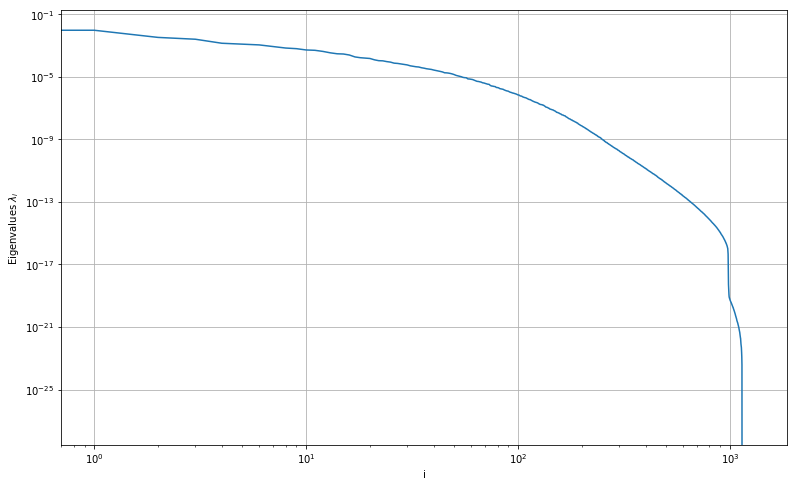

In [21]:
plt.figure(figsize=(13,8))
plt.loglog(eig_emp[::-1])
plt.grid()
plt.xlabel("i")
plt.ylabel("Eigenvalues $\lambda_i$")

### OAS Covariance

In [22]:
cov, shrinkage_coef = oas(Z[S,:].T)
cov.shape

(1295, 1295)

In [23]:
np.linalg.slogdet(cov)

(1.0, -19447.95746158477)

In [24]:
eig_oas = np.linalg.eigvalsh(cov)


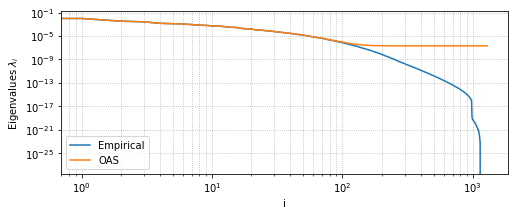

In [94]:
plt.figure(figsize=(8,3))
plt.loglog(eig_emp[::-1])

plt.loglog(eig_oas[::-1])

plt.grid(True,which="both",ls=":")
plt.xlabel("i")
plt.ylabel("Eigenvalues $\lambda_i$")
plt.legend(['Empirical', 'OAS'])

## Optimisation Comparison

Number of sensors to place : 

In [26]:
k = 10

Define the Sets for the optimisation

In [27]:
sets = define_sets(S)

In [28]:
A_opt = {}

### Sensor Optimisation with 1st Algorithm :

In [95]:
start = time.time()
A_opt['naive'] = sensor_loc_optimisation_naive(k,cov, sets)
print(time.time() - start)

















Main Loop:   0%|          | 0/10 [00:00<?, ?it/s]
















Inner Loop : placing sensor 1:   0%|          | 0/1295 [00:00<?, ?it/s]
















Inner Loop : placing sensor 1:   0%|          | 2/1295 [00:00<01:57, 10.96it/s]
















Inner Loop : placing sensor 1:   0%|          | 4/1295 [00:00<01:55, 11.21it/s]
















Inner Loop : placing sensor 1:   0%|          | 6/1295 [00:00<01:53, 11.37it/s]
















Inner Loop : placing sensor 1:   1%|          | 8/1295 [00:00<01:52, 11.48it/s]
















Inner Loop : placing sensor 1:   1%|          | 10/1295 [00:00<01:51, 11.54it/s]
















Inner Loop : placing sensor 1:   1%|          | 12/1295 [00:01<01:50, 11.60it/s]
















Inner Loop : placing sensor 1:   1%|          | 14/1295 [00:01<01:50, 11.63it/s]
















Inner Loop : placing sensor 1:   1%|          | 16/1295 [00:01<01:49, 11.63it/s]
















Inner Loop : placing sensor 1:   1%|▏         | 18/1295 [0

Inner Loop : placing sensor 1:  17%|█▋        | 218/1295 [00:17<01:24, 12.74it/s]
















Inner Loop : placing sensor 1:  17%|█▋        | 220/1295 [00:17<01:24, 12.75it/s]
















Inner Loop : placing sensor 1:  17%|█▋        | 222/1295 [00:17<01:24, 12.76it/s]
















Inner Loop : placing sensor 1:  17%|█▋        | 224/1295 [00:18<01:23, 12.75it/s]
















Inner Loop : placing sensor 1:  17%|█▋        | 226/1295 [00:18<01:23, 12.75it/s]
















Inner Loop : placing sensor 1:  18%|█▊        | 228/1295 [00:18<01:23, 12.75it/s]
















Inner Loop : placing sensor 1:  18%|█▊        | 230/1295 [00:18<01:23, 12.74it/s]
















Inner Loop : placing sensor 1:  18%|█▊        | 232/1295 [00:18<01:23, 12.74it/s]
















Inner Loop : placing sensor 1:  18%|█▊        | 234/1295 [00:18<01:23, 12.74it/s]
















Inner Loop : placing sensor 1:  18%|█▊        | 236/1295 [00:19<01:23, 12.75it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  25%|██▌       | 328/1295 [00:26<01:13, 13.08it/s]
















Inner Loop : placing sensor 1:  25%|██▌       | 330/1295 [00:26<01:13, 13.09it/s]
















Inner Loop : placing sensor 1:  26%|██▌       | 332/1295 [00:26<01:13, 13.11it/s]
















Inner Loop : placing sensor 1:  26%|██▌       | 334/1295 [00:26<01:13, 13.11it/s]
















Inner Loop : placing sensor 1:  26%|██▌       | 336/1295 [00:26<01:13, 13.12it/s]
















Inner Loop : placing sensor 1:  26%|██▌       | 338/1295 [00:26<01:12, 13.13it/s]
















Inner Loop : placing sensor 1:  26%|██▋       | 340/1295 [00:27<01:12, 13.13it/s]
















Inner Loop : placing sensor 1:  26%|██▋       | 342/1295 [00:27<01:12, 13.16it/s]
















Inner Loop : placing sensor 1:  27%|██▋       | 344/1295 [00:27<01:12, 13.18it/s]
















Inner Loop : placing sensor 1:  27%|██▋       | 346/1295 [00:27<01:11, 13.20it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  34%|███▍      | 438/1295 [00:34<01:04, 13.21it/s]
















Inner Loop : placing sensor 1:  34%|███▍      | 440/1295 [00:34<01:04, 13.21it/s]
















Inner Loop : placing sensor 1:  34%|███▍      | 442/1295 [00:34<01:04, 13.20it/s]
















Inner Loop : placing sensor 1:  34%|███▍      | 444/1295 [00:35<01:04, 13.20it/s]
















Inner Loop : placing sensor 1:  34%|███▍      | 446/1295 [00:35<01:04, 13.22it/s]
















Inner Loop : placing sensor 1:  35%|███▍      | 448/1295 [00:35<01:04, 13.23it/s]
















Inner Loop : placing sensor 1:  35%|███▍      | 450/1295 [00:35<01:03, 13.23it/s]
















Inner Loop : placing sensor 1:  35%|███▍      | 452/1295 [00:35<01:03, 13.23it/s]
















Inner Loop : placing sensor 1:  35%|███▌      | 454/1295 [00:35<01:03, 13.22it/s]
















Inner Loop : placing sensor 1:  35%|███▌      | 456/1295 [00:35<01:03, 13.22it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  42%|████▏     | 548/1295 [00:42<00:56, 13.17it/s]
















Inner Loop : placing sensor 1:  42%|████▏     | 550/1295 [00:43<00:56, 13.20it/s]
















Inner Loop : placing sensor 1:  43%|████▎     | 552/1295 [00:43<00:56, 13.15it/s]
















Inner Loop : placing sensor 1:  43%|████▎     | 554/1295 [00:43<00:56, 13.16it/s]
















Inner Loop : placing sensor 1:  43%|████▎     | 556/1295 [00:43<00:56, 13.17it/s]
















Inner Loop : placing sensor 1:  43%|████▎     | 558/1295 [00:43<00:55, 13.19it/s]
















Inner Loop : placing sensor 1:  43%|████▎     | 560/1295 [00:43<00:55, 13.20it/s]
















Inner Loop : placing sensor 1:  43%|████▎     | 562/1295 [00:43<00:55, 13.20it/s]
















Inner Loop : placing sensor 1:  44%|████▎     | 564/1295 [00:44<00:55, 13.20it/s]
















Inner Loop : placing sensor 1:  44%|████▎     | 566/1295 [00:44<00:55, 13.20it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  51%|█████     | 658/1295 [00:51<00:48, 13.22it/s]
















Inner Loop : placing sensor 1:  51%|█████     | 660/1295 [00:51<00:48, 13.22it/s]
















Inner Loop : placing sensor 1:  51%|█████     | 662/1295 [00:51<00:47, 13.21it/s]
















Inner Loop : placing sensor 1:  51%|█████▏    | 664/1295 [00:51<00:47, 13.20it/s]
















Inner Loop : placing sensor 1:  51%|█████▏    | 666/1295 [00:51<00:47, 13.21it/s]
















Inner Loop : placing sensor 1:  52%|█████▏    | 668/1295 [00:51<00:47, 13.20it/s]
















Inner Loop : placing sensor 1:  52%|█████▏    | 670/1295 [00:52<00:47, 13.16it/s]
















Inner Loop : placing sensor 1:  52%|█████▏    | 672/1295 [00:52<00:47, 13.19it/s]
















Inner Loop : placing sensor 1:  52%|█████▏    | 674/1295 [00:52<00:47, 13.20it/s]
















Inner Loop : placing sensor 1:  52%|█████▏    | 676/1295 [00:52<00:46, 13.20it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  59%|█████▉    | 768/1295 [00:59<00:39, 13.23it/s]
















Inner Loop : placing sensor 1:  59%|█████▉    | 770/1295 [00:59<00:39, 13.25it/s]
















Inner Loop : placing sensor 1:  60%|█████▉    | 772/1295 [00:59<00:39, 13.22it/s]
















Inner Loop : placing sensor 1:  60%|█████▉    | 774/1295 [00:59<00:39, 13.23it/s]
















Inner Loop : placing sensor 1:  60%|█████▉    | 776/1295 [01:00<00:39, 13.23it/s]
















Inner Loop : placing sensor 1:  60%|██████    | 778/1295 [01:00<00:39, 13.22it/s]
















Inner Loop : placing sensor 1:  60%|██████    | 780/1295 [01:00<00:38, 13.24it/s]
















Inner Loop : placing sensor 1:  60%|██████    | 782/1295 [01:00<00:38, 13.25it/s]
















Inner Loop : placing sensor 1:  61%|██████    | 784/1295 [01:00<00:38, 13.25it/s]
















Inner Loop : placing sensor 1:  61%|██████    | 786/1295 [01:00<00:38, 13.24it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  68%|██████▊   | 878/1295 [01:07<00:31, 13.04it/s]
















Inner Loop : placing sensor 1:  68%|██████▊   | 880/1295 [01:08<00:31, 13.00it/s]
















Inner Loop : placing sensor 1:  68%|██████▊   | 882/1295 [01:08<00:31, 13.03it/s]
















Inner Loop : placing sensor 1:  68%|██████▊   | 884/1295 [01:08<00:31, 13.00it/s]
















Inner Loop : placing sensor 1:  68%|██████▊   | 886/1295 [01:08<00:31, 12.98it/s]
















Inner Loop : placing sensor 1:  69%|██████▊   | 888/1295 [01:08<00:31, 12.99it/s]
















Inner Loop : placing sensor 1:  69%|██████▊   | 890/1295 [01:08<00:31, 13.00it/s]
















Inner Loop : placing sensor 1:  69%|██████▉   | 892/1295 [01:09<00:30, 13.00it/s]
















Inner Loop : placing sensor 1:  69%|██████▉   | 894/1295 [01:09<00:30, 13.02it/s]
















Inner Loop : placing sensor 1:  69%|██████▉   | 896/1295 [01:09<00:30, 13.01it/s]
















Inner Loop : placing

Inner Loop : placing sensor 1:  76%|███████▋  | 988/1295 [01:16<00:23, 13.03it/s]
















Inner Loop : placing sensor 1:  76%|███████▋  | 990/1295 [01:16<00:23, 13.03it/s]
















Inner Loop : placing sensor 1:  77%|███████▋  | 992/1295 [01:16<00:23, 13.03it/s]
















Inner Loop : placing sensor 1:  77%|███████▋  | 994/1295 [01:16<00:23, 13.04it/s]
















Inner Loop : placing sensor 1:  77%|███████▋  | 996/1295 [01:16<00:22, 13.05it/s]
















Inner Loop : placing sensor 1:  77%|███████▋  | 998/1295 [01:17<00:22, 13.06it/s]
















Inner Loop : placing sensor 1:  77%|███████▋  | 1000/1295 [01:17<00:22, 13.06it/s]
















Inner Loop : placing sensor 1:  77%|███████▋  | 1002/1295 [01:17<00:22, 13.05it/s]
















Inner Loop : placing sensor 1:  78%|███████▊  | 1004/1295 [01:17<00:22, 13.05it/s]
















Inner Loop : placing sensor 1:  78%|███████▊  | 1006/1295 [01:17<00:22, 13.03it/s]
















Inner Loop : pla

Inner Loop : placing sensor 1:  93%|█████████▎| 1204/1295 [01:32<00:06, 13.05it/s]
















Inner Loop : placing sensor 1:  93%|█████████▎| 1206/1295 [01:33<00:06, 13.02it/s]
















Inner Loop : placing sensor 1:  93%|█████████▎| 1208/1295 [01:33<00:06, 13.02it/s]
















Inner Loop : placing sensor 1:  93%|█████████▎| 1210/1295 [01:33<00:06, 13.03it/s]
















Inner Loop : placing sensor 1:  94%|█████████▎| 1212/1295 [01:33<00:06, 13.04it/s]
















Inner Loop : placing sensor 1:  94%|█████████▎| 1214/1295 [01:33<00:06, 13.01it/s]
















Inner Loop : placing sensor 1:  94%|█████████▍| 1216/1295 [01:33<00:06, 13.01it/s]
















Inner Loop : placing sensor 1:  94%|█████████▍| 1218/1295 [01:34<00:05, 13.02it/s]
















Inner Loop : placing sensor 1:  94%|█████████▍| 1220/1295 [01:34<00:05, 13.01it/s]
















Inner Loop : placing sensor 1:  94%|█████████▍| 1222/1295 [01:34<00:05, 13.02it/s]
















Inner Loop

Inner Loop : placing sensor 2:   1%|          | 14/1294 [00:01<01:40, 12.79it/s]
















Inner Loop : placing sensor 2:   1%|          | 16/1294 [00:01<01:39, 12.79it/s]
















Inner Loop : placing sensor 2:   1%|▏         | 18/1294 [00:01<01:39, 12.79it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 20/1294 [00:01<01:40, 12.72it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 22/1294 [00:01<01:40, 12.69it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 24/1294 [00:01<01:40, 12.65it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 26/1294 [00:02<01:39, 12.69it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 28/1294 [00:02<01:39, 12.72it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 30/1294 [00:02<01:39, 12.71it/s]
















Inner Loop : placing sensor 2:   2%|▏         | 32/1294 [00:02<01:39, 12.73it/s]
















Inner Loop : placing sensor 2:

Inner Loop : placing sensor 2:  18%|█▊        | 234/1294 [00:18<01:23, 12.72it/s]
















Inner Loop : placing sensor 2:  18%|█▊        | 236/1294 [00:18<01:22, 12.89it/s]
















Inner Loop : placing sensor 2:  18%|█▊        | 238/1294 [00:19<01:21, 13.01it/s]
















Inner Loop : placing sensor 2:  19%|█▊        | 240/1294 [00:19<01:20, 13.08it/s]
















Inner Loop : placing sensor 2:  19%|█▊        | 242/1294 [00:19<01:20, 13.13it/s]
















Inner Loop : placing sensor 2:  19%|█▉        | 244/1294 [00:19<01:19, 13.18it/s]
















Inner Loop : placing sensor 2:  19%|█▉        | 246/1294 [00:19<01:20, 13.00it/s]
















Inner Loop : placing sensor 2:  19%|█▉        | 248/1294 [00:19<01:19, 13.09it/s]
















Inner Loop : placing sensor 2:  19%|█▉        | 250/1294 [00:20<01:19, 13.13it/s]
















Inner Loop : placing sensor 2:  19%|█▉        | 252/1294 [00:20<01:18, 13.19it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  27%|██▋       | 344/1294 [00:27<01:22, 11.50it/s]
















Inner Loop : placing sensor 2:  27%|██▋       | 346/1294 [00:28<01:22, 11.53it/s]
















Inner Loop : placing sensor 2:  27%|██▋       | 348/1294 [00:28<01:21, 11.54it/s]
















Inner Loop : placing sensor 2:  27%|██▋       | 350/1294 [00:28<01:21, 11.55it/s]
















Inner Loop : placing sensor 2:  27%|██▋       | 352/1294 [00:28<01:21, 11.53it/s]
















Inner Loop : placing sensor 2:  27%|██▋       | 354/1294 [00:28<01:21, 11.48it/s]
















Inner Loop : placing sensor 2:  28%|██▊       | 356/1294 [00:28<01:21, 11.45it/s]
















Inner Loop : placing sensor 2:  28%|██▊       | 358/1294 [00:29<01:21, 11.44it/s]
















Inner Loop : placing sensor 2:  28%|██▊       | 360/1294 [00:29<01:21, 11.43it/s]
















Inner Loop : placing sensor 2:  28%|██▊       | 362/1294 [00:29<01:21, 11.44it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  35%|███▌      | 454/1294 [00:37<01:13, 11.43it/s]
















Inner Loop : placing sensor 2:  35%|███▌      | 456/1294 [00:37<01:13, 11.42it/s]
















Inner Loop : placing sensor 2:  35%|███▌      | 458/1294 [00:37<01:13, 11.42it/s]
















Inner Loop : placing sensor 2:  36%|███▌      | 460/1294 [00:37<01:13, 11.42it/s]
















Inner Loop : placing sensor 2:  36%|███▌      | 462/1294 [00:38<01:12, 11.41it/s]
















Inner Loop : placing sensor 2:  36%|███▌      | 464/1294 [00:38<01:12, 11.41it/s]
















Inner Loop : placing sensor 2:  36%|███▌      | 466/1294 [00:38<01:12, 11.41it/s]
















Inner Loop : placing sensor 2:  36%|███▌      | 468/1294 [00:38<01:12, 11.42it/s]
















Inner Loop : placing sensor 2:  36%|███▋      | 470/1294 [00:38<01:12, 11.42it/s]
















Inner Loop : placing sensor 2:  36%|███▋      | 472/1294 [00:39<01:11, 11.43it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  44%|████▎     | 564/1294 [00:47<01:04, 11.23it/s]
















Inner Loop : placing sensor 2:  44%|████▎     | 566/1294 [00:47<01:04, 11.24it/s]
















Inner Loop : placing sensor 2:  44%|████▍     | 568/1294 [00:47<01:04, 11.26it/s]
















Inner Loop : placing sensor 2:  44%|████▍     | 570/1294 [00:47<01:04, 11.28it/s]
















Inner Loop : placing sensor 2:  44%|████▍     | 572/1294 [00:47<01:03, 11.32it/s]
















Inner Loop : placing sensor 2:  44%|████▍     | 574/1294 [00:48<01:03, 11.35it/s]
















Inner Loop : placing sensor 2:  45%|████▍     | 576/1294 [00:48<01:03, 11.38it/s]
















Inner Loop : placing sensor 2:  45%|████▍     | 578/1294 [00:48<01:02, 11.38it/s]
















Inner Loop : placing sensor 2:  45%|████▍     | 580/1294 [00:48<01:02, 11.35it/s]
















Inner Loop : placing sensor 2:  45%|████▍     | 582/1294 [00:48<01:02, 11.31it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  52%|█████▏    | 673/1294 [00:56<00:51, 12.15it/s]
















Inner Loop : placing sensor 2:  52%|█████▏    | 675/1294 [00:56<00:51, 12.13it/s]
















Inner Loop : placing sensor 2:  52%|█████▏    | 677/1294 [00:56<00:50, 12.13it/s]
















Inner Loop : placing sensor 2:  52%|█████▏    | 679/1294 [00:57<00:50, 12.11it/s]
















Inner Loop : placing sensor 2:  53%|█████▎    | 681/1294 [00:57<00:50, 12.11it/s]
















Inner Loop : placing sensor 2:  53%|█████▎    | 683/1294 [00:57<00:50, 12.10it/s]
















Inner Loop : placing sensor 2:  53%|█████▎    | 685/1294 [00:57<00:50, 12.09it/s]
















Inner Loop : placing sensor 2:  53%|█████▎    | 687/1294 [00:57<00:50, 12.10it/s]
















Inner Loop : placing sensor 2:  53%|█████▎    | 689/1294 [00:57<00:50, 12.08it/s]
















Inner Loop : placing sensor 2:  53%|█████▎    | 691/1294 [00:58<00:49, 12.08it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  61%|██████    | 783/1294 [01:05<00:41, 12.20it/s]
















Inner Loop : placing sensor 2:  61%|██████    | 785/1294 [01:05<00:41, 12.20it/s]
















Inner Loop : placing sensor 2:  61%|██████    | 787/1294 [01:06<00:41, 12.19it/s]
















Inner Loop : placing sensor 2:  61%|██████    | 789/1294 [01:06<00:41, 12.19it/s]
















Inner Loop : placing sensor 2:  61%|██████    | 791/1294 [01:06<00:41, 12.19it/s]
















Inner Loop : placing sensor 2:  61%|██████▏   | 793/1294 [01:06<00:41, 12.18it/s]
















Inner Loop : placing sensor 2:  61%|██████▏   | 795/1294 [01:06<00:40, 12.18it/s]
















Inner Loop : placing sensor 2:  62%|██████▏   | 797/1294 [01:06<00:40, 12.18it/s]
















Inner Loop : placing sensor 2:  62%|██████▏   | 799/1294 [01:06<00:40, 12.19it/s]
















Inner Loop : placing sensor 2:  62%|██████▏   | 801/1294 [01:07<00:40, 12.21it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  69%|██████▉   | 893/1294 [01:14<00:33, 12.15it/s]
















Inner Loop : placing sensor 2:  69%|██████▉   | 895/1294 [01:14<00:32, 12.15it/s]
















Inner Loop : placing sensor 2:  69%|██████▉   | 897/1294 [01:15<00:32, 12.17it/s]
















Inner Loop : placing sensor 2:  69%|██████▉   | 899/1294 [01:15<00:32, 12.15it/s]
















Inner Loop : placing sensor 2:  70%|██████▉   | 901/1294 [01:15<00:32, 12.15it/s]
















Inner Loop : placing sensor 2:  70%|██████▉   | 903/1294 [01:15<00:32, 12.15it/s]
















Inner Loop : placing sensor 2:  70%|██████▉   | 905/1294 [01:15<00:32, 12.15it/s]
















Inner Loop : placing sensor 2:  70%|███████   | 907/1294 [01:15<00:31, 12.15it/s]
















Inner Loop : placing sensor 2:  70%|███████   | 909/1294 [01:16<00:31, 12.16it/s]
















Inner Loop : placing sensor 2:  70%|███████   | 911/1294 [01:16<00:31, 12.18it/s]
















Inner Loop : placing

Inner Loop : placing sensor 2:  78%|███████▊  | 1003/1294 [01:23<00:24, 12.05it/s]
















Inner Loop : placing sensor 2:  78%|███████▊  | 1005/1294 [01:23<00:23, 12.06it/s]
















Inner Loop : placing sensor 2:  78%|███████▊  | 1007/1294 [01:24<00:23, 12.04it/s]
















Inner Loop : placing sensor 2:  78%|███████▊  | 1009/1294 [01:24<00:23, 12.03it/s]
















Inner Loop : placing sensor 2:  78%|███████▊  | 1011/1294 [01:24<00:23, 12.00it/s]
















Inner Loop : placing sensor 2:  78%|███████▊  | 1013/1294 [01:24<00:23, 12.02it/s]
















Inner Loop : placing sensor 2:  78%|███████▊  | 1015/1294 [01:24<00:23, 12.03it/s]
















Inner Loop : placing sensor 2:  79%|███████▊  | 1017/1294 [01:24<00:23, 12.04it/s]
















Inner Loop : placing sensor 2:  79%|███████▊  | 1019/1294 [01:25<00:22, 12.03it/s]
















Inner Loop : placing sensor 2:  79%|███████▉  | 1021/1294 [01:25<00:22, 12.04it/s]
















Inner Loop

Inner Loop : placing sensor 2:  94%|█████████▍| 1219/1294 [01:41<00:06, 12.09it/s]
















Inner Loop : placing sensor 2:  94%|█████████▍| 1221/1294 [01:41<00:06, 12.08it/s]
















Inner Loop : placing sensor 2:  95%|█████████▍| 1223/1294 [01:41<00:05, 12.09it/s]
















Inner Loop : placing sensor 2:  95%|█████████▍| 1225/1294 [01:42<00:05, 12.08it/s]
















Inner Loop : placing sensor 2:  95%|█████████▍| 1227/1294 [01:42<00:05, 12.09it/s]
















Inner Loop : placing sensor 2:  95%|█████████▍| 1229/1294 [01:42<00:05, 12.09it/s]
















Inner Loop : placing sensor 2:  95%|█████████▌| 1231/1294 [01:42<00:05, 12.09it/s]
















Inner Loop : placing sensor 2:  95%|█████████▌| 1233/1294 [01:42<00:05, 12.09it/s]
















Inner Loop : placing sensor 2:  95%|█████████▌| 1235/1294 [01:42<00:04, 12.09it/s]
















Inner Loop : placing sensor 2:  96%|█████████▌| 1237/1294 [01:43<00:04, 12.09it/s]
















Inner Loop

Inner Loop : placing sensor 3:  11%|█         | 140/1293 [00:11<01:30, 12.70it/s]
















Inner Loop : placing sensor 3:  11%|█         | 142/1293 [00:11<01:30, 12.69it/s]
















Inner Loop : placing sensor 3:  11%|█         | 144/1293 [00:11<01:30, 12.68it/s]
















Inner Loop : placing sensor 3:  11%|█▏        | 146/1293 [00:11<01:30, 12.69it/s]
















Inner Loop : placing sensor 3:  11%|█▏        | 148/1293 [00:11<01:30, 12.69it/s]
















Inner Loop : placing sensor 3:  12%|█▏        | 150/1293 [00:11<01:30, 12.69it/s]
















Inner Loop : placing sensor 3:  12%|█▏        | 152/1293 [00:11<01:29, 12.69it/s]
















Inner Loop : placing sensor 3:  12%|█▏        | 154/1293 [00:12<01:30, 12.64it/s]
















Inner Loop : placing sensor 3:  12%|█▏        | 156/1293 [00:12<01:29, 12.68it/s]
















Inner Loop : placing sensor 3:  12%|█▏        | 158/1293 [00:12<01:29, 12.69it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  19%|█▉        | 250/1293 [00:19<01:22, 12.63it/s]
















Inner Loop : placing sensor 3:  19%|█▉        | 252/1293 [00:19<01:22, 12.62it/s]
















Inner Loop : placing sensor 3:  20%|█▉        | 254/1293 [00:20<01:22, 12.64it/s]
















Inner Loop : placing sensor 3:  20%|█▉        | 256/1293 [00:20<01:20, 12.93it/s]
















Inner Loop : placing sensor 3:  20%|█▉        | 258/1293 [00:20<01:18, 13.12it/s]
















Inner Loop : placing sensor 3:  20%|██        | 260/1293 [00:20<01:18, 13.24it/s]
















Inner Loop : placing sensor 3:  20%|██        | 262/1293 [00:20<01:17, 13.37it/s]
















Inner Loop : placing sensor 3:  20%|██        | 264/1293 [00:20<01:16, 13.42it/s]
















Inner Loop : placing sensor 3:  21%|██        | 266/1293 [00:20<01:16, 13.49it/s]
















Inner Loop : placing sensor 3:  21%|██        | 268/1293 [00:21<01:15, 13.52it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  28%|██▊       | 360/1293 [00:28<01:15, 12.33it/s]
















Inner Loop : placing sensor 3:  28%|██▊       | 362/1293 [00:28<01:15, 12.32it/s]
















Inner Loop : placing sensor 3:  28%|██▊       | 364/1293 [00:28<01:15, 12.30it/s]
















Inner Loop : placing sensor 3:  28%|██▊       | 366/1293 [00:28<01:15, 12.33it/s]
















Inner Loop : placing sensor 3:  28%|██▊       | 368/1293 [00:28<01:14, 12.35it/s]
















Inner Loop : placing sensor 3:  29%|██▊       | 370/1293 [00:29<01:14, 12.36it/s]
















Inner Loop : placing sensor 3:  29%|██▉       | 372/1293 [00:29<01:14, 12.38it/s]
















Inner Loop : placing sensor 3:  29%|██▉       | 374/1293 [00:29<01:14, 12.38it/s]
















Inner Loop : placing sensor 3:  29%|██▉       | 376/1293 [00:29<01:13, 12.39it/s]
















Inner Loop : placing sensor 3:  29%|██▉       | 378/1293 [00:29<01:13, 12.40it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  36%|███▋      | 470/1293 [00:37<01:05, 12.54it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 472/1293 [00:37<01:05, 12.52it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 474/1293 [00:37<01:05, 12.45it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 476/1293 [00:37<01:05, 12.40it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 478/1293 [00:37<01:05, 12.40it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 480/1293 [00:37<01:05, 12.36it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 482/1293 [00:38<01:05, 12.34it/s]
















Inner Loop : placing sensor 3:  37%|███▋      | 484/1293 [00:38<01:05, 12.35it/s]
















Inner Loop : placing sensor 3:  38%|███▊      | 486/1293 [00:38<01:05, 12.37it/s]
















Inner Loop : placing sensor 3:  38%|███▊      | 488/1293 [00:38<01:05, 12.38it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  45%|████▍     | 580/1293 [00:46<00:57, 12.41it/s]
















Inner Loop : placing sensor 3:  45%|████▌     | 582/1293 [00:46<00:57, 12.41it/s]
















Inner Loop : placing sensor 3:  45%|████▌     | 584/1293 [00:46<00:57, 12.40it/s]
















Inner Loop : placing sensor 3:  45%|████▌     | 586/1293 [00:46<00:57, 12.37it/s]
















Inner Loop : placing sensor 3:  45%|████▌     | 588/1293 [00:46<00:56, 12.38it/s]
















Inner Loop : placing sensor 3:  46%|████▌     | 590/1293 [00:46<00:56, 12.41it/s]
















Inner Loop : placing sensor 3:  46%|████▌     | 592/1293 [00:47<00:56, 12.42it/s]
















Inner Loop : placing sensor 3:  46%|████▌     | 594/1293 [00:47<00:56, 12.45it/s]
















Inner Loop : placing sensor 3:  46%|████▌     | 596/1293 [00:47<00:55, 12.46it/s]
















Inner Loop : placing sensor 3:  46%|████▌     | 598/1293 [00:47<00:55, 12.48it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  53%|█████▎    | 690/1293 [00:54<00:48, 12.42it/s]
















Inner Loop : placing sensor 3:  54%|█████▎    | 692/1293 [00:55<00:48, 12.45it/s]
















Inner Loop : placing sensor 3:  54%|█████▎    | 694/1293 [00:55<00:48, 12.45it/s]
















Inner Loop : placing sensor 3:  54%|█████▍    | 696/1293 [00:55<00:47, 12.46it/s]
















Inner Loop : placing sensor 3:  54%|█████▍    | 698/1293 [00:55<00:47, 12.45it/s]
















Inner Loop : placing sensor 3:  54%|█████▍    | 700/1293 [00:55<00:47, 12.45it/s]
















Inner Loop : placing sensor 3:  54%|█████▍    | 702/1293 [00:55<00:47, 12.44it/s]
















Inner Loop : placing sensor 3:  54%|█████▍    | 704/1293 [00:55<00:47, 12.43it/s]
















Inner Loop : placing sensor 3:  55%|█████▍    | 706/1293 [00:56<00:47, 12.43it/s]
















Inner Loop : placing sensor 3:  55%|█████▍    | 708/1293 [00:56<00:47, 12.44it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  62%|██████▏   | 800/1293 [01:03<00:39, 12.40it/s]
















Inner Loop : placing sensor 3:  62%|██████▏   | 802/1293 [01:03<00:39, 12.40it/s]
















Inner Loop : placing sensor 3:  62%|██████▏   | 804/1293 [01:04<00:39, 12.40it/s]
















Inner Loop : placing sensor 3:  62%|██████▏   | 806/1293 [01:04<00:39, 12.41it/s]
















Inner Loop : placing sensor 3:  62%|██████▏   | 808/1293 [01:04<00:39, 12.42it/s]
















Inner Loop : placing sensor 3:  63%|██████▎   | 810/1293 [01:04<00:38, 12.43it/s]
















Inner Loop : placing sensor 3:  63%|██████▎   | 812/1293 [01:04<00:38, 12.46it/s]
















Inner Loop : placing sensor 3:  63%|██████▎   | 814/1293 [01:04<00:38, 12.46it/s]
















Inner Loop : placing sensor 3:  63%|██████▎   | 816/1293 [01:04<00:38, 12.45it/s]
















Inner Loop : placing sensor 3:  63%|██████▎   | 818/1293 [01:05<00:38, 12.42it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  70%|███████   | 910/1293 [01:12<00:31, 12.32it/s]
















Inner Loop : placing sensor 3:  71%|███████   | 912/1293 [01:12<00:30, 12.32it/s]
















Inner Loop : placing sensor 3:  71%|███████   | 914/1293 [01:12<00:30, 12.29it/s]
















Inner Loop : placing sensor 3:  71%|███████   | 916/1293 [01:13<00:30, 12.27it/s]
















Inner Loop : placing sensor 3:  71%|███████   | 918/1293 [01:13<00:30, 12.30it/s]
















Inner Loop : placing sensor 3:  71%|███████   | 920/1293 [01:13<00:30, 12.32it/s]
















Inner Loop : placing sensor 3:  71%|███████▏  | 922/1293 [01:13<00:30, 12.33it/s]
















Inner Loop : placing sensor 3:  71%|███████▏  | 924/1293 [01:13<00:29, 12.34it/s]
















Inner Loop : placing sensor 3:  72%|███████▏  | 926/1293 [01:13<00:29, 12.38it/s]
















Inner Loop : placing sensor 3:  72%|███████▏  | 928/1293 [01:14<00:29, 12.37it/s]
















Inner Loop : placing

Inner Loop : placing sensor 3:  79%|███████▉  | 1020/1293 [01:21<00:21, 12.41it/s]
















Inner Loop : placing sensor 3:  79%|███████▉  | 1022/1293 [01:21<00:21, 12.42it/s]
















Inner Loop : placing sensor 3:  79%|███████▉  | 1024/1293 [01:21<00:21, 12.41it/s]
















Inner Loop : placing sensor 3:  79%|███████▉  | 1026/1293 [01:21<00:21, 12.41it/s]
















Inner Loop : placing sensor 3:  80%|███████▉  | 1028/1293 [01:22<00:21, 12.40it/s]
















Inner Loop : placing sensor 3:  80%|███████▉  | 1030/1293 [01:22<00:21, 12.42it/s]
















Inner Loop : placing sensor 3:  80%|███████▉  | 1032/1293 [01:22<00:21, 12.38it/s]
















Inner Loop : placing sensor 3:  80%|███████▉  | 1034/1293 [01:22<00:21, 12.31it/s]
















Inner Loop : placing sensor 3:  80%|████████  | 1036/1293 [01:22<00:20, 12.25it/s]
















Inner Loop : placing sensor 3:  80%|████████  | 1038/1293 [01:22<00:20, 12.25it/s]
















Inner Loop

Inner Loop : placing sensor 3:  96%|█████████▌| 1236/1293 [01:38<00:04, 12.41it/s]
















Inner Loop : placing sensor 3:  96%|█████████▌| 1238/1293 [01:38<00:04, 12.42it/s]
















Inner Loop : placing sensor 3:  96%|█████████▌| 1240/1293 [01:39<00:04, 12.43it/s]
















Inner Loop : placing sensor 3:  96%|█████████▌| 1242/1293 [01:39<00:04, 12.42it/s]
















Inner Loop : placing sensor 3:  96%|█████████▌| 1244/1293 [01:39<00:03, 12.41it/s]
















Inner Loop : placing sensor 3:  96%|█████████▋| 1246/1293 [01:39<00:03, 12.41it/s]
















Inner Loop : placing sensor 3:  97%|█████████▋| 1248/1293 [01:39<00:03, 12.41it/s]
















Inner Loop : placing sensor 3:  97%|█████████▋| 1250/1293 [01:39<00:03, 12.39it/s]
















Inner Loop : placing sensor 3:  97%|█████████▋| 1252/1293 [01:40<00:03, 12.40it/s]
















Inner Loop : placing sensor 3:  97%|█████████▋| 1254/1293 [01:40<00:03, 12.38it/s]
















Inner Loop

Inner Loop : placing sensor 4:  12%|█▏        | 158/1292 [00:12<01:33, 12.13it/s]
















Inner Loop : placing sensor 4:  12%|█▏        | 160/1292 [00:13<01:33, 12.10it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 162/1292 [00:13<01:33, 12.08it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 164/1292 [00:13<01:33, 12.06it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 166/1292 [00:13<01:33, 12.06it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 168/1292 [00:13<01:32, 12.09it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 170/1292 [00:13<01:32, 12.10it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 172/1292 [00:14<01:32, 12.11it/s]
















Inner Loop : placing sensor 4:  13%|█▎        | 174/1292 [00:14<01:32, 12.10it/s]
















Inner Loop : placing sensor 4:  14%|█▎        | 176/1292 [00:14<01:32, 12.11it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  21%|██        | 268/1292 [00:22<01:24, 12.09it/s]
















Inner Loop : placing sensor 4:  21%|██        | 270/1292 [00:22<01:24, 12.09it/s]
















Inner Loop : placing sensor 4:  21%|██        | 272/1292 [00:22<01:24, 12.07it/s]
















Inner Loop : placing sensor 4:  21%|██        | 274/1292 [00:22<01:24, 12.10it/s]
















Inner Loop : placing sensor 4:  21%|██▏       | 276/1292 [00:22<01:23, 12.11it/s]
















Inner Loop : placing sensor 4:  22%|██▏       | 278/1292 [00:22<01:23, 12.13it/s]
















Inner Loop : placing sensor 4:  22%|██▏       | 280/1292 [00:23<01:23, 12.09it/s]
















Inner Loop : placing sensor 4:  22%|██▏       | 282/1292 [00:23<01:23, 12.05it/s]
















Inner Loop : placing sensor 4:  22%|██▏       | 284/1292 [00:23<01:23, 12.02it/s]
















Inner Loop : placing sensor 4:  22%|██▏       | 286/1292 [00:23<01:23, 12.00it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  29%|██▉       | 378/1292 [00:31<01:15, 12.08it/s]
















Inner Loop : placing sensor 4:  29%|██▉       | 380/1292 [00:31<01:15, 12.08it/s]
















Inner Loop : placing sensor 4:  30%|██▉       | 382/1292 [00:31<01:15, 12.07it/s]
















Inner Loop : placing sensor 4:  30%|██▉       | 384/1292 [00:31<01:15, 12.09it/s]
















Inner Loop : placing sensor 4:  30%|██▉       | 386/1292 [00:31<01:15, 12.07it/s]
















Inner Loop : placing sensor 4:  30%|███       | 388/1292 [00:32<01:14, 12.07it/s]
















Inner Loop : placing sensor 4:  30%|███       | 390/1292 [00:32<01:14, 12.07it/s]
















Inner Loop : placing sensor 4:  30%|███       | 392/1292 [00:32<01:14, 12.09it/s]
















Inner Loop : placing sensor 4:  30%|███       | 394/1292 [00:32<01:14, 12.11it/s]
















Inner Loop : placing sensor 4:  31%|███       | 396/1292 [00:32<01:13, 12.11it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  38%|███▊      | 488/1292 [00:40<01:06, 12.12it/s]
















Inner Loop : placing sensor 4:  38%|███▊      | 490/1292 [00:40<01:06, 12.13it/s]
















Inner Loop : placing sensor 4:  38%|███▊      | 492/1292 [00:40<01:05, 12.13it/s]
















Inner Loop : placing sensor 4:  38%|███▊      | 494/1292 [00:40<01:05, 12.14it/s]
















Inner Loop : placing sensor 4:  38%|███▊      | 496/1292 [00:40<01:05, 12.14it/s]
















Inner Loop : placing sensor 4:  39%|███▊      | 498/1292 [00:41<01:05, 12.13it/s]
















Inner Loop : placing sensor 4:  39%|███▊      | 500/1292 [00:41<01:05, 12.11it/s]
















Inner Loop : placing sensor 4:  39%|███▉      | 502/1292 [00:41<01:05, 12.09it/s]
















Inner Loop : placing sensor 4:  39%|███▉      | 504/1292 [00:41<01:05, 12.10it/s]
















Inner Loop : placing sensor 4:  39%|███▉      | 506/1292 [00:41<01:04, 12.12it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  46%|████▋     | 598/1292 [00:49<00:57, 12.13it/s]
















Inner Loop : placing sensor 4:  46%|████▋     | 600/1292 [00:49<00:57, 12.14it/s]
















Inner Loop : placing sensor 4:  47%|████▋     | 602/1292 [00:49<00:56, 12.14it/s]
















Inner Loop : placing sensor 4:  47%|████▋     | 604/1292 [00:49<00:56, 12.14it/s]
















Inner Loop : placing sensor 4:  47%|████▋     | 606/1292 [00:49<00:56, 12.16it/s]
















Inner Loop : placing sensor 4:  47%|████▋     | 608/1292 [00:50<00:56, 12.16it/s]
















Inner Loop : placing sensor 4:  47%|████▋     | 610/1292 [00:50<00:56, 12.17it/s]
















Inner Loop : placing sensor 4:  47%|████▋     | 612/1292 [00:50<00:55, 12.14it/s]
















Inner Loop : placing sensor 4:  48%|████▊     | 614/1292 [00:50<00:55, 12.13it/s]
















Inner Loop : placing sensor 4:  48%|████▊     | 616/1292 [00:50<00:55, 12.11it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  55%|█████▍    | 708/1292 [00:58<00:48, 12.14it/s]
















Inner Loop : placing sensor 4:  55%|█████▍    | 710/1292 [00:58<00:47, 12.15it/s]
















Inner Loop : placing sensor 4:  55%|█████▌    | 712/1292 [00:58<00:47, 12.17it/s]
















Inner Loop : placing sensor 4:  55%|█████▌    | 714/1292 [00:58<00:47, 12.15it/s]
















Inner Loop : placing sensor 4:  55%|█████▌    | 716/1292 [00:59<00:47, 12.15it/s]
















Inner Loop : placing sensor 4:  56%|█████▌    | 718/1292 [00:59<00:47, 12.15it/s]
















Inner Loop : placing sensor 4:  56%|█████▌    | 720/1292 [00:59<00:47, 12.15it/s]
















Inner Loop : placing sensor 4:  56%|█████▌    | 722/1292 [00:59<00:46, 12.17it/s]
















Inner Loop : placing sensor 4:  56%|█████▌    | 724/1292 [00:59<00:46, 12.21it/s]
















Inner Loop : placing sensor 4:  56%|█████▌    | 726/1292 [00:59<00:46, 12.22it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  63%|██████▎   | 818/1292 [01:07<00:38, 12.16it/s]
















Inner Loop : placing sensor 4:  63%|██████▎   | 820/1292 [01:07<00:38, 12.19it/s]
















Inner Loop : placing sensor 4:  64%|██████▎   | 822/1292 [01:07<00:38, 12.19it/s]
















Inner Loop : placing sensor 4:  64%|██████▍   | 824/1292 [01:07<00:38, 12.20it/s]
















Inner Loop : placing sensor 4:  64%|██████▍   | 826/1292 [01:08<00:38, 12.20it/s]
















Inner Loop : placing sensor 4:  64%|██████▍   | 828/1292 [01:08<00:38, 12.20it/s]
















Inner Loop : placing sensor 4:  64%|██████▍   | 830/1292 [01:08<00:37, 12.19it/s]
















Inner Loop : placing sensor 4:  64%|██████▍   | 832/1292 [01:08<00:37, 12.18it/s]
















Inner Loop : placing sensor 4:  65%|██████▍   | 834/1292 [01:08<00:37, 12.16it/s]
















Inner Loop : placing sensor 4:  65%|██████▍   | 836/1292 [01:08<00:37, 12.16it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  72%|███████▏  | 928/1292 [01:16<00:30, 12.01it/s]
















Inner Loop : placing sensor 4:  72%|███████▏  | 930/1292 [01:16<00:30, 11.98it/s]
















Inner Loop : placing sensor 4:  72%|███████▏  | 932/1292 [01:16<00:30, 11.96it/s]
















Inner Loop : placing sensor 4:  72%|███████▏  | 934/1292 [01:16<00:29, 11.94it/s]
















Inner Loop : placing sensor 4:  72%|███████▏  | 936/1292 [01:17<00:29, 11.92it/s]
















Inner Loop : placing sensor 4:  73%|███████▎  | 938/1292 [01:17<00:29, 11.92it/s]
















Inner Loop : placing sensor 4:  73%|███████▎  | 940/1292 [01:17<00:29, 11.92it/s]
















Inner Loop : placing sensor 4:  73%|███████▎  | 942/1292 [01:17<00:29, 11.98it/s]
















Inner Loop : placing sensor 4:  73%|███████▎  | 944/1292 [01:17<00:28, 12.02it/s]
















Inner Loop : placing sensor 4:  73%|███████▎  | 946/1292 [01:17<00:28, 12.04it/s]
















Inner Loop : placing

Inner Loop : placing sensor 4:  89%|████████▊ | 1144/1292 [01:34<00:12, 12.22it/s]
















Inner Loop : placing sensor 4:  89%|████████▊ | 1146/1292 [01:34<00:11, 12.23it/s]
















Inner Loop : placing sensor 4:  89%|████████▉ | 1148/1292 [01:34<00:11, 12.23it/s]
















Inner Loop : placing sensor 4:  89%|████████▉ | 1150/1292 [01:34<00:11, 12.23it/s]
















Inner Loop : placing sensor 4:  89%|████████▉ | 1152/1292 [01:34<00:11, 12.23it/s]
















Inner Loop : placing sensor 4:  89%|████████▉ | 1154/1292 [01:35<00:11, 12.22it/s]
















Inner Loop : placing sensor 4:  89%|████████▉ | 1156/1292 [01:35<00:11, 12.22it/s]
















Inner Loop : placing sensor 4:  90%|████████▉ | 1158/1292 [01:35<00:11, 12.17it/s]
















Inner Loop : placing sensor 4:  90%|████████▉ | 1160/1292 [01:35<00:10, 12.17it/s]
















Inner Loop : placing sensor 4:  90%|████████▉ | 1162/1292 [01:35<00:10, 12.17it/s]
















Inner Loop

Inner Loop : placing sensor 5:   5%|▌         | 66/1291 [00:05<01:38, 12.38it/s]
















Inner Loop : placing sensor 5:   5%|▌         | 68/1291 [00:05<01:38, 12.37it/s]
















Inner Loop : placing sensor 5:   5%|▌         | 70/1291 [00:05<01:38, 12.36it/s]
















Inner Loop : placing sensor 5:   6%|▌         | 72/1291 [00:05<01:38, 12.36it/s]
















Inner Loop : placing sensor 5:   6%|▌         | 74/1291 [00:05<01:38, 12.36it/s]
















Inner Loop : placing sensor 5:   6%|▌         | 76/1291 [00:06<01:38, 12.35it/s]
















Inner Loop : placing sensor 5:   6%|▌         | 78/1291 [00:06<01:38, 12.33it/s]
















Inner Loop : placing sensor 5:   6%|▌         | 80/1291 [00:06<01:38, 12.32it/s]
















Inner Loop : placing sensor 5:   6%|▋         | 82/1291 [00:06<01:38, 12.31it/s]
















Inner Loop : placing sensor 5:   7%|▋         | 84/1291 [00:06<01:38, 12.26it/s]
















Inner Loop : placing sensor 5:

Inner Loop : placing sensor 5:  22%|██▏       | 286/1291 [00:22<01:19, 12.65it/s]
















Inner Loop : placing sensor 5:  22%|██▏       | 288/1291 [00:22<01:19, 12.65it/s]
















Inner Loop : placing sensor 5:  22%|██▏       | 290/1291 [00:23<01:19, 12.65it/s]
















Inner Loop : placing sensor 5:  23%|██▎       | 292/1291 [00:23<01:18, 12.65it/s]
















Inner Loop : placing sensor 5:  23%|██▎       | 294/1291 [00:23<01:18, 12.66it/s]
















Inner Loop : placing sensor 5:  23%|██▎       | 296/1291 [00:23<01:18, 12.65it/s]
















Inner Loop : placing sensor 5:  23%|██▎       | 298/1291 [00:23<01:18, 12.64it/s]
















Inner Loop : placing sensor 5:  23%|██▎       | 300/1291 [00:23<01:18, 12.65it/s]
















Inner Loop : placing sensor 5:  23%|██▎       | 302/1291 [00:24<01:18, 12.64it/s]
















Inner Loop : placing sensor 5:  24%|██▎       | 304/1291 [00:24<01:18, 12.64it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  31%|███       | 396/1291 [00:31<01:10, 12.64it/s]
















Inner Loop : placing sensor 5:  31%|███       | 398/1291 [00:31<01:10, 12.65it/s]
















Inner Loop : placing sensor 5:  31%|███       | 400/1291 [00:31<01:10, 12.65it/s]
















Inner Loop : placing sensor 5:  31%|███       | 402/1291 [00:32<01:10, 12.64it/s]
















Inner Loop : placing sensor 5:  31%|███▏      | 404/1291 [00:32<01:11, 12.41it/s]
















Inner Loop : placing sensor 5:  31%|███▏      | 406/1291 [00:32<01:10, 12.48it/s]
















Inner Loop : placing sensor 5:  32%|███▏      | 408/1291 [00:32<01:10, 12.53it/s]
















Inner Loop : placing sensor 5:  32%|███▏      | 410/1291 [00:32<01:10, 12.58it/s]
















Inner Loop : placing sensor 5:  32%|███▏      | 412/1291 [00:32<01:09, 12.59it/s]
















Inner Loop : placing sensor 5:  32%|███▏      | 414/1291 [00:32<01:09, 12.61it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  39%|███▉      | 506/1291 [00:40<01:04, 12.20it/s]
















Inner Loop : placing sensor 5:  39%|███▉      | 508/1291 [00:40<01:04, 12.20it/s]
















Inner Loop : placing sensor 5:  40%|███▉      | 510/1291 [00:40<01:04, 12.18it/s]
















Inner Loop : placing sensor 5:  40%|███▉      | 512/1291 [00:40<01:03, 12.19it/s]
















Inner Loop : placing sensor 5:  40%|███▉      | 514/1291 [00:41<01:03, 12.19it/s]
















Inner Loop : placing sensor 5:  40%|███▉      | 516/1291 [00:41<01:03, 12.19it/s]
















Inner Loop : placing sensor 5:  40%|████      | 518/1291 [00:41<01:03, 12.17it/s]
















Inner Loop : placing sensor 5:  40%|████      | 520/1291 [00:41<01:03, 12.15it/s]
















Inner Loop : placing sensor 5:  40%|████      | 522/1291 [00:41<01:03, 12.15it/s]
















Inner Loop : placing sensor 5:  41%|████      | 524/1291 [00:41<01:03, 12.17it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  48%|████▊     | 616/1291 [00:49<00:55, 12.19it/s]
















Inner Loop : placing sensor 5:  48%|████▊     | 618/1291 [00:49<00:55, 12.18it/s]
















Inner Loop : placing sensor 5:  48%|████▊     | 620/1291 [00:49<00:55, 12.20it/s]
















Inner Loop : placing sensor 5:  48%|████▊     | 622/1291 [00:49<00:54, 12.20it/s]
















Inner Loop : placing sensor 5:  48%|████▊     | 624/1291 [00:50<00:54, 12.21it/s]
















Inner Loop : placing sensor 5:  48%|████▊     | 626/1291 [00:50<00:54, 12.20it/s]
















Inner Loop : placing sensor 5:  49%|████▊     | 628/1291 [00:50<00:54, 12.20it/s]
















Inner Loop : placing sensor 5:  49%|████▉     | 630/1291 [00:50<00:54, 12.21it/s]
















Inner Loop : placing sensor 5:  49%|████▉     | 632/1291 [00:50<00:54, 12.20it/s]
















Inner Loop : placing sensor 5:  49%|████▉     | 634/1291 [00:50<00:53, 12.21it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  56%|█████▌    | 726/1291 [00:58<00:46, 12.22it/s]
















Inner Loop : placing sensor 5:  56%|█████▋    | 728/1291 [00:58<00:46, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 730/1291 [00:58<00:45, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 732/1291 [00:58<00:45, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 734/1291 [00:59<00:45, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 736/1291 [00:59<00:45, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 738/1291 [00:59<00:45, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 740/1291 [00:59<00:45, 12.23it/s]
















Inner Loop : placing sensor 5:  57%|█████▋    | 742/1291 [00:59<00:44, 12.22it/s]
















Inner Loop : placing sensor 5:  58%|█████▊    | 744/1291 [00:59<00:44, 12.22it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  65%|██████▍   | 836/1291 [01:07<00:36, 12.35it/s]
















Inner Loop : placing sensor 5:  65%|██████▍   | 838/1291 [01:07<00:36, 12.35it/s]
















Inner Loop : placing sensor 5:  65%|██████▌   | 840/1291 [01:07<00:36, 12.36it/s]
















Inner Loop : placing sensor 5:  65%|██████▌   | 842/1291 [01:07<00:36, 12.35it/s]
















Inner Loop : placing sensor 5:  65%|██████▌   | 844/1291 [01:07<00:36, 12.37it/s]
















Inner Loop : placing sensor 5:  66%|██████▌   | 846/1291 [01:08<00:35, 12.37it/s]
















Inner Loop : placing sensor 5:  66%|██████▌   | 848/1291 [01:08<00:35, 12.36it/s]
















Inner Loop : placing sensor 5:  66%|██████▌   | 850/1291 [01:08<00:35, 12.37it/s]
















Inner Loop : placing sensor 5:  66%|██████▌   | 852/1291 [01:08<00:35, 12.33it/s]
















Inner Loop : placing sensor 5:  66%|██████▌   | 854/1291 [01:08<00:35, 12.33it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  73%|███████▎  | 946/1291 [01:16<00:28, 12.24it/s]
















Inner Loop : placing sensor 5:  73%|███████▎  | 948/1291 [01:16<00:28, 12.24it/s]
















Inner Loop : placing sensor 5:  74%|███████▎  | 950/1291 [01:16<00:27, 12.22it/s]
















Inner Loop : placing sensor 5:  74%|███████▎  | 952/1291 [01:16<00:27, 12.21it/s]
















Inner Loop : placing sensor 5:  74%|███████▍  | 954/1291 [01:16<00:27, 12.24it/s]
















Inner Loop : placing sensor 5:  74%|███████▍  | 956/1291 [01:17<00:27, 12.23it/s]
















Inner Loop : placing sensor 5:  74%|███████▍  | 958/1291 [01:17<00:27, 12.23it/s]
















Inner Loop : placing sensor 5:  74%|███████▍  | 960/1291 [01:17<00:27, 12.22it/s]
















Inner Loop : placing sensor 5:  75%|███████▍  | 962/1291 [01:17<00:26, 12.22it/s]
















Inner Loop : placing sensor 5:  75%|███████▍  | 964/1291 [01:17<00:26, 12.23it/s]
















Inner Loop : placing

Inner Loop : placing sensor 5:  90%|█████████ | 1162/1291 [01:33<00:10, 12.34it/s]
















Inner Loop : placing sensor 5:  90%|█████████ | 1164/1291 [01:33<00:10, 12.36it/s]
















Inner Loop : placing sensor 5:  90%|█████████ | 1166/1291 [01:34<00:10, 12.28it/s]
















Inner Loop : placing sensor 5:  90%|█████████ | 1168/1291 [01:34<00:09, 12.34it/s]
















Inner Loop : placing sensor 5:  91%|█████████ | 1170/1291 [01:34<00:09, 12.36it/s]
















Inner Loop : placing sensor 5:  91%|█████████ | 1172/1291 [01:34<00:09, 12.41it/s]
















Inner Loop : placing sensor 5:  91%|█████████ | 1174/1291 [01:34<00:09, 12.44it/s]
















Inner Loop : placing sensor 5:  91%|█████████ | 1176/1291 [01:34<00:09, 12.37it/s]
















Inner Loop : placing sensor 5:  91%|█████████ | 1178/1291 [01:35<00:09, 12.40it/s]
















Inner Loop : placing sensor 5:  91%|█████████▏| 1180/1291 [01:35<00:08, 12.41it/s]
















Inner Loop

Inner Loop : placing sensor 6:   7%|▋         | 84/1290 [00:06<01:38, 12.20it/s]
















Inner Loop : placing sensor 6:   7%|▋         | 86/1290 [00:07<01:36, 12.43it/s]
















Inner Loop : placing sensor 6:   7%|▋         | 88/1290 [00:07<01:35, 12.61it/s]
















Inner Loop : placing sensor 6:   7%|▋         | 90/1290 [00:07<01:34, 12.71it/s]
















Inner Loop : placing sensor 6:   7%|▋         | 92/1290 [00:07<01:33, 12.80it/s]
















Inner Loop : placing sensor 6:   7%|▋         | 94/1290 [00:07<01:32, 12.88it/s]
















Inner Loop : placing sensor 6:   7%|▋         | 96/1290 [00:07<01:32, 12.91it/s]
















Inner Loop : placing sensor 6:   8%|▊         | 98/1290 [00:08<01:32, 12.95it/s]
















Inner Loop : placing sensor 6:   8%|▊         | 100/1290 [00:08<01:31, 12.98it/s]
















Inner Loop : placing sensor 6:   8%|▊         | 102/1290 [00:08<01:31, 13.00it/s]
















Inner Loop : placing sensor 

Inner Loop : placing sensor 6:  24%|██▎       | 304/1290 [00:24<01:21, 12.15it/s]
















Inner Loop : placing sensor 6:  24%|██▎       | 306/1290 [00:25<01:20, 12.22it/s]
















Inner Loop : placing sensor 6:  24%|██▍       | 308/1290 [00:25<01:19, 12.28it/s]
















Inner Loop : placing sensor 6:  24%|██▍       | 310/1290 [00:25<01:19, 12.30it/s]
















Inner Loop : placing sensor 6:  24%|██▍       | 312/1290 [00:25<01:19, 12.31it/s]
















Inner Loop : placing sensor 6:  24%|██▍       | 314/1290 [00:25<01:19, 12.32it/s]
















Inner Loop : placing sensor 6:  24%|██▍       | 316/1290 [00:25<01:18, 12.34it/s]
















Inner Loop : placing sensor 6:  25%|██▍       | 318/1290 [00:26<01:18, 12.35it/s]
















Inner Loop : placing sensor 6:  25%|██▍       | 320/1290 [00:26<01:18, 12.35it/s]
















Inner Loop : placing sensor 6:  25%|██▍       | 322/1290 [00:26<01:18, 12.36it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  32%|███▏      | 414/1290 [00:33<01:10, 12.35it/s]
















Inner Loop : placing sensor 6:  32%|███▏      | 416/1290 [00:33<01:10, 12.36it/s]
















Inner Loop : placing sensor 6:  32%|███▏      | 418/1290 [00:34<01:10, 12.36it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 420/1290 [00:34<01:10, 12.39it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 422/1290 [00:34<01:10, 12.38it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 424/1290 [00:34<01:09, 12.37it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 426/1290 [00:34<01:09, 12.37it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 428/1290 [00:34<01:09, 12.36it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 430/1290 [00:35<01:09, 12.35it/s]
















Inner Loop : placing sensor 6:  33%|███▎      | 432/1290 [00:35<01:09, 12.35it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  41%|████      | 524/1290 [00:42<01:02, 12.19it/s]
















Inner Loop : placing sensor 6:  41%|████      | 526/1290 [00:42<01:02, 12.20it/s]
















Inner Loop : placing sensor 6:  41%|████      | 528/1290 [00:43<01:02, 12.20it/s]
















Inner Loop : placing sensor 6:  41%|████      | 530/1290 [00:43<01:02, 12.20it/s]
















Inner Loop : placing sensor 6:  41%|████      | 532/1290 [00:43<01:02, 12.21it/s]
















Inner Loop : placing sensor 6:  41%|████▏     | 534/1290 [00:43<01:01, 12.21it/s]
















Inner Loop : placing sensor 6:  42%|████▏     | 536/1290 [00:43<01:01, 12.22it/s]
















Inner Loop : placing sensor 6:  42%|████▏     | 538/1290 [00:43<01:01, 12.16it/s]
















Inner Loop : placing sensor 6:  42%|████▏     | 540/1290 [00:44<01:01, 12.16it/s]
















Inner Loop : placing sensor 6:  42%|████▏     | 542/1290 [00:44<01:01, 12.17it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  49%|████▉     | 634/1290 [00:51<00:54, 12.10it/s]
















Inner Loop : placing sensor 6:  49%|████▉     | 636/1290 [00:52<00:54, 12.09it/s]
















Inner Loop : placing sensor 6:  49%|████▉     | 638/1290 [00:52<00:53, 12.09it/s]
















Inner Loop : placing sensor 6:  50%|████▉     | 640/1290 [00:52<00:53, 12.08it/s]
















Inner Loop : placing sensor 6:  50%|████▉     | 642/1290 [00:52<00:53, 12.07it/s]
















Inner Loop : placing sensor 6:  50%|████▉     | 644/1290 [00:52<00:53, 12.09it/s]
















Inner Loop : placing sensor 6:  50%|█████     | 646/1290 [00:52<00:53, 12.11it/s]
















Inner Loop : placing sensor 6:  50%|█████     | 648/1290 [00:53<00:52, 12.11it/s]
















Inner Loop : placing sensor 6:  50%|█████     | 650/1290 [00:53<00:52, 12.12it/s]
















Inner Loop : placing sensor 6:  51%|█████     | 652/1290 [00:53<00:52, 12.13it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  58%|█████▊    | 744/1290 [01:00<00:44, 12.16it/s]
















Inner Loop : placing sensor 6:  58%|█████▊    | 746/1290 [01:00<00:44, 12.18it/s]
















Inner Loop : placing sensor 6:  58%|█████▊    | 748/1290 [01:00<00:44, 12.19it/s]
















Inner Loop : placing sensor 6:  58%|█████▊    | 750/1290 [01:01<00:44, 12.18it/s]
















Inner Loop : placing sensor 6:  58%|█████▊    | 752/1290 [01:01<00:44, 12.17it/s]
















Inner Loop : placing sensor 6:  58%|█████▊    | 754/1290 [01:01<00:44, 12.17it/s]
















Inner Loop : placing sensor 6:  59%|█████▊    | 756/1290 [01:01<00:43, 12.14it/s]
















Inner Loop : placing sensor 6:  59%|█████▉    | 758/1290 [01:01<00:43, 12.12it/s]
















Inner Loop : placing sensor 6:  59%|█████▉    | 760/1290 [01:01<00:43, 12.12it/s]
















Inner Loop : placing sensor 6:  59%|█████▉    | 762/1290 [01:02<00:43, 12.13it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  66%|██████▌   | 854/1290 [01:09<00:35, 12.12it/s]
















Inner Loop : placing sensor 6:  66%|██████▋   | 856/1290 [01:09<00:35, 12.10it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 858/1290 [01:10<00:35, 12.06it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 860/1290 [01:10<00:35, 12.10it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 862/1290 [01:10<00:35, 12.11it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 864/1290 [01:10<00:35, 12.13it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 866/1290 [01:10<00:34, 12.12it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 868/1290 [01:10<00:34, 12.11it/s]
















Inner Loop : placing sensor 6:  67%|██████▋   | 870/1290 [01:11<00:34, 12.10it/s]
















Inner Loop : placing sensor 6:  68%|██████▊   | 872/1290 [01:11<00:34, 12.09it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  75%|███████▍  | 964/1290 [01:18<00:26, 12.31it/s]
















Inner Loop : placing sensor 6:  75%|███████▍  | 966/1290 [01:18<00:26, 12.24it/s]
















Inner Loop : placing sensor 6:  75%|███████▌  | 968/1290 [01:19<00:26, 12.21it/s]
















Inner Loop : placing sensor 6:  75%|███████▌  | 970/1290 [01:19<00:26, 12.17it/s]
















Inner Loop : placing sensor 6:  75%|███████▌  | 972/1290 [01:19<00:26, 12.14it/s]
















Inner Loop : placing sensor 6:  76%|███████▌  | 974/1290 [01:19<00:26, 12.09it/s]
















Inner Loop : placing sensor 6:  76%|███████▌  | 976/1290 [01:19<00:26, 12.07it/s]
















Inner Loop : placing sensor 6:  76%|███████▌  | 978/1290 [01:19<00:25, 12.10it/s]
















Inner Loop : placing sensor 6:  76%|███████▌  | 980/1290 [01:20<00:25, 12.08it/s]
















Inner Loop : placing sensor 6:  76%|███████▌  | 982/1290 [01:20<00:25, 12.07it/s]
















Inner Loop : placing

Inner Loop : placing sensor 6:  91%|█████████▏| 1180/1290 [01:36<00:09, 12.14it/s]
















Inner Loop : placing sensor 6:  92%|█████████▏| 1182/1290 [01:36<00:08, 12.15it/s]
















Inner Loop : placing sensor 6:  92%|█████████▏| 1184/1290 [01:36<00:08, 12.16it/s]
















Inner Loop : placing sensor 6:  92%|█████████▏| 1186/1290 [01:37<00:08, 12.16it/s]
















Inner Loop : placing sensor 6:  92%|█████████▏| 1188/1290 [01:37<00:08, 12.14it/s]
















Inner Loop : placing sensor 6:  92%|█████████▏| 1190/1290 [01:37<00:08, 12.12it/s]
















Inner Loop : placing sensor 6:  92%|█████████▏| 1192/1290 [01:37<00:08, 12.11it/s]
















Inner Loop : placing sensor 6:  93%|█████████▎| 1194/1290 [01:37<00:07, 12.11it/s]
















Inner Loop : placing sensor 6:  93%|█████████▎| 1196/1290 [01:37<00:07, 12.11it/s]
















Inner Loop : placing sensor 6:  93%|█████████▎| 1198/1290 [01:38<00:07, 12.12it/s]
















Inner Loop

Inner Loop : placing sensor 7:   8%|▊         | 104/1289 [00:08<01:31, 12.96it/s]
















Inner Loop : placing sensor 7:   8%|▊         | 106/1289 [00:08<01:31, 12.99it/s]
















Inner Loop : placing sensor 7:   8%|▊         | 108/1289 [00:08<01:30, 12.98it/s]
















Inner Loop : placing sensor 7:   9%|▊         | 110/1289 [00:08<01:30, 12.97it/s]
















Inner Loop : placing sensor 7:   9%|▊         | 112/1289 [00:08<01:30, 12.95it/s]
















Inner Loop : placing sensor 7:   9%|▉         | 114/1289 [00:08<01:31, 12.84it/s]
















Inner Loop : placing sensor 7:   9%|▉         | 116/1289 [00:08<01:31, 12.88it/s]
















Inner Loop : placing sensor 7:   9%|▉         | 118/1289 [00:09<01:30, 12.91it/s]
















Inner Loop : placing sensor 7:   9%|▉         | 120/1289 [00:09<01:30, 12.90it/s]
















Inner Loop : placing sensor 7:   9%|▉         | 122/1289 [00:09<01:30, 12.94it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  17%|█▋        | 214/1289 [00:16<01:22, 12.98it/s]
















Inner Loop : placing sensor 7:  17%|█▋        | 216/1289 [00:16<01:22, 12.95it/s]
















Inner Loop : placing sensor 7:  17%|█▋        | 218/1289 [00:16<01:22, 12.94it/s]
















Inner Loop : placing sensor 7:  17%|█▋        | 220/1289 [00:16<01:22, 12.97it/s]
















Inner Loop : placing sensor 7:  17%|█▋        | 222/1289 [00:17<01:22, 12.97it/s]
















Inner Loop : placing sensor 7:  17%|█▋        | 224/1289 [00:17<01:21, 12.99it/s]
















Inner Loop : placing sensor 7:  18%|█▊        | 226/1289 [00:17<01:21, 12.98it/s]
















Inner Loop : placing sensor 7:  18%|█▊        | 228/1289 [00:17<01:22, 12.92it/s]
















Inner Loop : placing sensor 7:  18%|█▊        | 230/1289 [00:17<01:22, 12.90it/s]
















Inner Loop : placing sensor 7:  18%|█▊        | 232/1289 [00:17<01:21, 12.90it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  25%|██▌       | 324/1289 [00:24<01:14, 13.03it/s]
















Inner Loop : placing sensor 7:  25%|██▌       | 326/1289 [00:25<01:13, 13.02it/s]
















Inner Loop : placing sensor 7:  25%|██▌       | 328/1289 [00:25<01:13, 13.02it/s]
















Inner Loop : placing sensor 7:  26%|██▌       | 330/1289 [00:25<01:13, 13.01it/s]
















Inner Loop : placing sensor 7:  26%|██▌       | 332/1289 [00:25<01:13, 12.96it/s]
















Inner Loop : placing sensor 7:  26%|██▌       | 334/1289 [00:25<01:13, 12.97it/s]
















Inner Loop : placing sensor 7:  26%|██▌       | 336/1289 [00:25<01:13, 13.03it/s]
















Inner Loop : placing sensor 7:  26%|██▌       | 338/1289 [00:26<01:12, 13.09it/s]
















Inner Loop : placing sensor 7:  26%|██▋       | 340/1289 [00:26<01:12, 13.14it/s]
















Inner Loop : placing sensor 7:  27%|██▋       | 342/1289 [00:26<01:11, 13.17it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  34%|███▎      | 434/1289 [00:33<01:03, 13.48it/s]
















Inner Loop : placing sensor 7:  34%|███▍      | 436/1289 [00:33<01:03, 13.42it/s]
















Inner Loop : placing sensor 7:  34%|███▍      | 438/1289 [00:33<01:04, 13.15it/s]
















Inner Loop : placing sensor 7:  34%|███▍      | 440/1289 [00:33<01:04, 13.12it/s]
















Inner Loop : placing sensor 7:  34%|███▍      | 442/1289 [00:33<01:05, 12.91it/s]
















Inner Loop : placing sensor 7:  34%|███▍      | 444/1289 [00:34<01:05, 12.85it/s]
















Inner Loop : placing sensor 7:  35%|███▍      | 446/1289 [00:34<01:06, 12.76it/s]
















Inner Loop : placing sensor 7:  35%|███▍      | 448/1289 [00:34<01:05, 12.83it/s]
















Inner Loop : placing sensor 7:  35%|███▍      | 450/1289 [00:34<01:05, 12.89it/s]
















Inner Loop : placing sensor 7:  35%|███▌      | 452/1289 [00:34<01:04, 12.92it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  42%|████▏     | 544/1289 [00:41<00:56, 13.25it/s]
















Inner Loop : placing sensor 7:  42%|████▏     | 546/1289 [00:41<00:56, 13.26it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 548/1289 [00:41<00:55, 13.27it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 550/1289 [00:42<00:55, 13.28it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 552/1289 [00:42<00:55, 13.28it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 554/1289 [00:42<00:55, 13.28it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 556/1289 [00:42<00:55, 13.28it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 558/1289 [00:42<00:55, 13.26it/s]
















Inner Loop : placing sensor 7:  43%|████▎     | 560/1289 [00:42<00:54, 13.27it/s]
















Inner Loop : placing sensor 7:  44%|████▎     | 562/1289 [00:43<00:54, 13.27it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  51%|█████     | 654/1289 [00:49<00:47, 13.27it/s]
















Inner Loop : placing sensor 7:  51%|█████     | 656/1289 [00:50<00:47, 13.28it/s]
















Inner Loop : placing sensor 7:  51%|█████     | 658/1289 [00:50<00:47, 13.28it/s]
















Inner Loop : placing sensor 7:  51%|█████     | 660/1289 [00:50<00:47, 13.27it/s]
















Inner Loop : placing sensor 7:  51%|█████▏    | 662/1289 [00:50<00:47, 13.27it/s]
















Inner Loop : placing sensor 7:  52%|█████▏    | 664/1289 [00:50<00:47, 13.28it/s]
















Inner Loop : placing sensor 7:  52%|█████▏    | 666/1289 [00:50<00:46, 13.28it/s]
















Inner Loop : placing sensor 7:  52%|█████▏    | 668/1289 [00:51<00:46, 13.28it/s]
















Inner Loop : placing sensor 7:  52%|█████▏    | 670/1289 [00:51<00:46, 13.28it/s]
















Inner Loop : placing sensor 7:  52%|█████▏    | 672/1289 [00:51<00:46, 13.28it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  59%|█████▉    | 764/1289 [00:58<00:39, 13.27it/s]
















Inner Loop : placing sensor 7:  59%|█████▉    | 766/1289 [00:58<00:39, 13.27it/s]
















Inner Loop : placing sensor 7:  60%|█████▉    | 768/1289 [00:58<00:39, 13.27it/s]
















Inner Loop : placing sensor 7:  60%|█████▉    | 770/1289 [00:58<00:39, 13.28it/s]
















Inner Loop : placing sensor 7:  60%|█████▉    | 772/1289 [00:58<00:38, 13.28it/s]
















Inner Loop : placing sensor 7:  60%|██████    | 774/1289 [00:59<00:38, 13.29it/s]
















Inner Loop : placing sensor 7:  60%|██████    | 776/1289 [00:59<00:38, 13.29it/s]
















Inner Loop : placing sensor 7:  60%|██████    | 778/1289 [00:59<00:38, 13.28it/s]
















Inner Loop : placing sensor 7:  61%|██████    | 780/1289 [00:59<00:38, 13.28it/s]
















Inner Loop : placing sensor 7:  61%|██████    | 782/1289 [00:59<00:38, 13.28it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  68%|██████▊   | 874/1289 [01:06<00:31, 13.28it/s]
















Inner Loop : placing sensor 7:  68%|██████▊   | 876/1289 [01:06<00:31, 13.28it/s]
















Inner Loop : placing sensor 7:  68%|██████▊   | 878/1289 [01:06<00:30, 13.29it/s]
















Inner Loop : placing sensor 7:  68%|██████▊   | 880/1289 [01:07<00:30, 13.29it/s]
















Inner Loop : placing sensor 7:  68%|██████▊   | 882/1289 [01:07<00:30, 13.29it/s]
















Inner Loop : placing sensor 7:  69%|██████▊   | 884/1289 [01:07<00:30, 13.28it/s]
















Inner Loop : placing sensor 7:  69%|██████▊   | 886/1289 [01:07<00:30, 13.28it/s]
















Inner Loop : placing sensor 7:  69%|██████▉   | 888/1289 [01:07<00:30, 13.27it/s]
















Inner Loop : placing sensor 7:  69%|██████▉   | 890/1289 [01:07<00:30, 13.28it/s]
















Inner Loop : placing sensor 7:  69%|██████▉   | 892/1289 [01:07<00:29, 13.29it/s]
















Inner Loop : placing

Inner Loop : placing sensor 7:  76%|███████▋  | 984/1289 [01:14<00:22, 13.29it/s]
















Inner Loop : placing sensor 7:  76%|███████▋  | 986/1289 [01:14<00:22, 13.28it/s]
















Inner Loop : placing sensor 7:  77%|███████▋  | 988/1289 [01:15<00:22, 13.28it/s]
















Inner Loop : placing sensor 7:  77%|███████▋  | 990/1289 [01:15<00:22, 13.28it/s]
















Inner Loop : placing sensor 7:  77%|███████▋  | 992/1289 [01:15<00:22, 13.28it/s]
















Inner Loop : placing sensor 7:  77%|███████▋  | 994/1289 [01:15<00:22, 13.28it/s]
















Inner Loop : placing sensor 7:  77%|███████▋  | 996/1289 [01:15<00:22, 13.27it/s]
















Inner Loop : placing sensor 7:  77%|███████▋  | 998/1289 [01:15<00:21, 13.28it/s]
















Inner Loop : placing sensor 7:  78%|███████▊  | 1000/1289 [01:16<00:21, 13.28it/s]
















Inner Loop : placing sensor 7:  78%|███████▊  | 1002/1289 [01:16<00:21, 13.28it/s]
















Inner Loop : placi

Inner Loop : placing sensor 7:  93%|█████████▎| 1200/1289 [01:31<00:06, 13.30it/s]
















Inner Loop : placing sensor 7:  93%|█████████▎| 1202/1289 [01:31<00:06, 13.29it/s]
















Inner Loop : placing sensor 7:  93%|█████████▎| 1204/1289 [01:31<00:06, 13.29it/s]
















Inner Loop : placing sensor 7:  94%|█████████▎| 1206/1289 [01:31<00:06, 13.29it/s]
















Inner Loop : placing sensor 7:  94%|█████████▎| 1208/1289 [01:31<00:06, 13.29it/s]
















Inner Loop : placing sensor 7:  94%|█████████▍| 1210/1289 [01:31<00:05, 13.29it/s]
















Inner Loop : placing sensor 7:  94%|█████████▍| 1212/1289 [01:31<00:05, 13.26it/s]
















Inner Loop : placing sensor 7:  94%|█████████▍| 1214/1289 [01:32<00:05, 13.26it/s]
















Inner Loop : placing sensor 7:  94%|█████████▍| 1216/1289 [01:32<00:05, 13.27it/s]
















Inner Loop : placing sensor 7:  94%|█████████▍| 1218/1289 [01:32<00:05, 13.27it/s]
















Inner Loop

Inner Loop : placing sensor 8:   1%|          | 16/1288 [00:01<01:45, 12.08it/s]
















Inner Loop : placing sensor 8:   1%|▏         | 18/1288 [00:01<01:45, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 20/1288 [00:01<01:44, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 22/1288 [00:01<01:44, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 24/1288 [00:01<01:44, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 26/1288 [00:02<01:44, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 28/1288 [00:02<01:44, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 30/1288 [00:02<01:44, 12.09it/s]
















Inner Loop : placing sensor 8:   2%|▏         | 32/1288 [00:02<01:43, 12.09it/s]
















Inner Loop : placing sensor 8:   3%|▎         | 34/1288 [00:02<01:43, 12.10it/s]
















Inner Loop : placing sensor 8:

Inner Loop : placing sensor 8:  18%|█▊        | 236/1288 [00:19<01:26, 12.12it/s]
















Inner Loop : placing sensor 8:  18%|█▊        | 238/1288 [00:19<01:26, 12.14it/s]
















Inner Loop : placing sensor 8:  19%|█▊        | 240/1288 [00:19<01:26, 12.14it/s]
















Inner Loop : placing sensor 8:  19%|█▉        | 242/1288 [00:20<01:26, 12.13it/s]
















Inner Loop : placing sensor 8:  19%|█▉        | 244/1288 [00:20<01:26, 12.13it/s]
















Inner Loop : placing sensor 8:  19%|█▉        | 246/1288 [00:20<01:25, 12.13it/s]
















Inner Loop : placing sensor 8:  19%|█▉        | 248/1288 [00:20<01:25, 12.12it/s]
















Inner Loop : placing sensor 8:  19%|█▉        | 250/1288 [00:20<01:25, 12.12it/s]
















Inner Loop : placing sensor 8:  20%|█▉        | 252/1288 [00:20<01:25, 12.12it/s]
















Inner Loop : placing sensor 8:  20%|█▉        | 254/1288 [00:21<01:25, 12.12it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  27%|██▋       | 346/1288 [00:28<01:18, 12.05it/s]
















Inner Loop : placing sensor 8:  27%|██▋       | 348/1288 [00:28<01:17, 12.09it/s]
















Inner Loop : placing sensor 8:  27%|██▋       | 350/1288 [00:28<01:17, 12.10it/s]
















Inner Loop : placing sensor 8:  27%|██▋       | 352/1288 [00:29<01:17, 12.09it/s]
















Inner Loop : placing sensor 8:  27%|██▋       | 354/1288 [00:29<01:17, 12.02it/s]
















Inner Loop : placing sensor 8:  28%|██▊       | 356/1288 [00:29<01:17, 12.05it/s]
















Inner Loop : placing sensor 8:  28%|██▊       | 358/1288 [00:29<01:17, 12.07it/s]
















Inner Loop : placing sensor 8:  28%|██▊       | 360/1288 [00:29<01:17, 12.05it/s]
















Inner Loop : placing sensor 8:  28%|██▊       | 362/1288 [00:29<01:16, 12.08it/s]
















Inner Loop : placing sensor 8:  28%|██▊       | 364/1288 [00:30<01:16, 12.11it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  35%|███▌      | 456/1288 [00:37<01:08, 12.10it/s]
















Inner Loop : placing sensor 8:  36%|███▌      | 458/1288 [00:37<01:08, 12.14it/s]
















Inner Loop : placing sensor 8:  36%|███▌      | 460/1288 [00:38<01:08, 12.16it/s]
















Inner Loop : placing sensor 8:  36%|███▌      | 462/1288 [00:38<01:07, 12.17it/s]
















Inner Loop : placing sensor 8:  36%|███▌      | 464/1288 [00:38<01:07, 12.18it/s]
















Inner Loop : placing sensor 8:  36%|███▌      | 466/1288 [00:38<01:07, 12.12it/s]
















Inner Loop : placing sensor 8:  36%|███▋      | 468/1288 [00:38<01:07, 12.15it/s]
















Inner Loop : placing sensor 8:  36%|███▋      | 470/1288 [00:38<01:07, 12.18it/s]
















Inner Loop : placing sensor 8:  37%|███▋      | 472/1288 [00:39<01:06, 12.20it/s]
















Inner Loop : placing sensor 8:  37%|███▋      | 474/1288 [00:39<01:06, 12.25it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  44%|████▍     | 566/1288 [00:46<00:58, 12.32it/s]
















Inner Loop : placing sensor 8:  44%|████▍     | 568/1288 [00:46<00:58, 12.23it/s]
















Inner Loop : placing sensor 8:  44%|████▍     | 570/1288 [00:46<00:58, 12.19it/s]
















Inner Loop : placing sensor 8:  44%|████▍     | 572/1288 [00:46<00:58, 12.16it/s]
















Inner Loop : placing sensor 8:  45%|████▍     | 574/1288 [00:47<00:58, 12.14it/s]
















Inner Loop : placing sensor 8:  45%|████▍     | 576/1288 [00:47<00:58, 12.16it/s]
















Inner Loop : placing sensor 8:  45%|████▍     | 578/1288 [00:47<00:58, 12.20it/s]
















Inner Loop : placing sensor 8:  45%|████▌     | 580/1288 [00:47<00:58, 12.17it/s]
















Inner Loop : placing sensor 8:  45%|████▌     | 582/1288 [00:47<00:58, 12.15it/s]
















Inner Loop : placing sensor 8:  45%|████▌     | 584/1288 [00:47<00:58, 12.13it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  52%|█████▏    | 676/1288 [00:55<00:49, 12.26it/s]
















Inner Loop : placing sensor 8:  53%|█████▎    | 678/1288 [00:55<00:50, 12.19it/s]
















Inner Loop : placing sensor 8:  53%|█████▎    | 680/1288 [00:55<00:49, 12.19it/s]
















Inner Loop : placing sensor 8:  53%|█████▎    | 682/1288 [00:55<00:49, 12.14it/s]
















Inner Loop : placing sensor 8:  53%|█████▎    | 684/1288 [00:56<00:49, 12.12it/s]
















Inner Loop : placing sensor 8:  53%|█████▎    | 686/1288 [00:56<00:49, 12.10it/s]
















Inner Loop : placing sensor 8:  53%|█████▎    | 688/1288 [00:56<00:49, 12.07it/s]
















Inner Loop : placing sensor 8:  54%|█████▎    | 690/1288 [00:56<00:49, 12.05it/s]
















Inner Loop : placing sensor 8:  54%|█████▎    | 692/1288 [00:56<00:49, 12.04it/s]
















Inner Loop : placing sensor 8:  54%|█████▍    | 694/1288 [00:56<00:49, 12.03it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  61%|██████    | 786/1288 [01:04<00:41, 12.00it/s]
















Inner Loop : placing sensor 8:  61%|██████    | 788/1288 [01:04<00:41, 12.00it/s]
















Inner Loop : placing sensor 8:  61%|██████▏   | 790/1288 [01:04<00:41, 12.00it/s]
















Inner Loop : placing sensor 8:  61%|██████▏   | 792/1288 [01:05<00:41, 12.00it/s]
















Inner Loop : placing sensor 8:  62%|██████▏   | 794/1288 [01:05<00:41, 12.01it/s]
















Inner Loop : placing sensor 8:  62%|██████▏   | 796/1288 [01:05<00:40, 12.01it/s]
















Inner Loop : placing sensor 8:  62%|██████▏   | 798/1288 [01:05<00:41, 11.91it/s]
















Inner Loop : placing sensor 8:  62%|██████▏   | 800/1288 [01:05<00:40, 11.94it/s]
















Inner Loop : placing sensor 8:  62%|██████▏   | 802/1288 [01:05<00:40, 11.96it/s]
















Inner Loop : placing sensor 8:  62%|██████▏   | 804/1288 [01:06<00:40, 11.98it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  70%|██████▉   | 896/1288 [01:13<00:32, 12.02it/s]
















Inner Loop : placing sensor 8:  70%|██████▉   | 898/1288 [01:13<00:32, 12.03it/s]
















Inner Loop : placing sensor 8:  70%|██████▉   | 900/1288 [01:14<00:32, 12.04it/s]
















Inner Loop : placing sensor 8:  70%|███████   | 902/1288 [01:14<00:32, 11.99it/s]
















Inner Loop : placing sensor 8:  70%|███████   | 904/1288 [01:14<00:31, 12.06it/s]
















Inner Loop : placing sensor 8:  70%|███████   | 906/1288 [01:14<00:31, 12.11it/s]
















Inner Loop : placing sensor 8:  70%|███████   | 908/1288 [01:14<00:31, 12.14it/s]
















Inner Loop : placing sensor 8:  71%|███████   | 910/1288 [01:14<00:31, 12.13it/s]
















Inner Loop : placing sensor 8:  71%|███████   | 912/1288 [01:15<00:31, 12.11it/s]
















Inner Loop : placing sensor 8:  71%|███████   | 914/1288 [01:15<00:30, 12.09it/s]
















Inner Loop : placing

Inner Loop : placing sensor 8:  78%|███████▊  | 1006/1288 [01:22<00:23, 12.12it/s]
















Inner Loop : placing sensor 8:  78%|███████▊  | 1008/1288 [01:22<00:23, 12.10it/s]
















Inner Loop : placing sensor 8:  78%|███████▊  | 1010/1288 [01:23<00:23, 12.09it/s]
















Inner Loop : placing sensor 8:  79%|███████▊  | 1012/1288 [01:23<00:22, 12.08it/s]
















Inner Loop : placing sensor 8:  79%|███████▊  | 1014/1288 [01:23<00:22, 12.07it/s]
















Inner Loop : placing sensor 8:  79%|███████▉  | 1016/1288 [01:23<00:22, 12.07it/s]
















Inner Loop : placing sensor 8:  79%|███████▉  | 1018/1288 [01:23<00:22, 12.12it/s]
















Inner Loop : placing sensor 8:  79%|███████▉  | 1020/1288 [01:23<00:22, 12.11it/s]
















Inner Loop : placing sensor 8:  79%|███████▉  | 1022/1288 [01:24<00:21, 12.09it/s]
















Inner Loop : placing sensor 8:  80%|███████▉  | 1024/1288 [01:24<00:21, 12.08it/s]
















Inner Loop

Inner Loop : placing sensor 8:  95%|█████████▍| 1222/1288 [01:40<00:05, 12.20it/s]
















Inner Loop : placing sensor 8:  95%|█████████▌| 1224/1288 [01:40<00:05, 12.19it/s]
















Inner Loop : placing sensor 8:  95%|█████████▌| 1226/1288 [01:40<00:05, 12.20it/s]
















Inner Loop : placing sensor 8:  95%|█████████▌| 1228/1288 [01:40<00:04, 12.19it/s]
















Inner Loop : placing sensor 8:  95%|█████████▌| 1230/1288 [01:40<00:04, 12.19it/s]
















Inner Loop : placing sensor 8:  96%|█████████▌| 1232/1288 [01:41<00:04, 12.18it/s]
















Inner Loop : placing sensor 8:  96%|█████████▌| 1234/1288 [01:41<00:04, 12.19it/s]
















Inner Loop : placing sensor 8:  96%|█████████▌| 1236/1288 [01:41<00:04, 12.19it/s]
















Inner Loop : placing sensor 8:  96%|█████████▌| 1238/1288 [01:41<00:04, 12.19it/s]
















Inner Loop : placing sensor 8:  96%|█████████▋| 1240/1288 [01:41<00:03, 12.18it/s]
















Inner Loop

Inner Loop : placing sensor 9:  12%|█▏        | 150/1287 [00:11<01:31, 12.47it/s]
















Inner Loop : placing sensor 9:  12%|█▏        | 152/1287 [00:12<01:31, 12.45it/s]
















Inner Loop : placing sensor 9:  12%|█▏        | 154/1287 [00:12<01:31, 12.42it/s]
















Inner Loop : placing sensor 9:  12%|█▏        | 156/1287 [00:12<01:31, 12.40it/s]
















Inner Loop : placing sensor 9:  12%|█▏        | 158/1287 [00:12<01:31, 12.39it/s]
















Inner Loop : placing sensor 9:  12%|█▏        | 160/1287 [00:12<01:31, 12.38it/s]
















Inner Loop : placing sensor 9:  13%|█▎        | 162/1287 [00:12<01:30, 12.38it/s]
















Inner Loop : placing sensor 9:  13%|█▎        | 164/1287 [00:13<01:30, 12.38it/s]
















Inner Loop : placing sensor 9:  13%|█▎        | 166/1287 [00:13<01:30, 12.39it/s]
















Inner Loop : placing sensor 9:  13%|█▎        | 168/1287 [00:13<01:30, 12.40it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  20%|██        | 260/1287 [00:20<01:22, 12.40it/s]
















Inner Loop : placing sensor 9:  20%|██        | 262/1287 [00:21<01:22, 12.37it/s]
















Inner Loop : placing sensor 9:  21%|██        | 264/1287 [00:21<01:22, 12.40it/s]
















Inner Loop : placing sensor 9:  21%|██        | 266/1287 [00:21<01:22, 12.42it/s]
















Inner Loop : placing sensor 9:  21%|██        | 268/1287 [00:21<01:22, 12.42it/s]
















Inner Loop : placing sensor 9:  21%|██        | 270/1287 [00:21<01:21, 12.42it/s]
















Inner Loop : placing sensor 9:  21%|██        | 272/1287 [00:21<01:21, 12.42it/s]
















Inner Loop : placing sensor 9:  21%|██▏       | 274/1287 [00:22<01:21, 12.38it/s]
















Inner Loop : placing sensor 9:  21%|██▏       | 276/1287 [00:22<01:21, 12.39it/s]
















Inner Loop : placing sensor 9:  22%|██▏       | 278/1287 [00:22<01:21, 12.40it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  29%|██▊       | 370/1287 [00:29<01:13, 12.41it/s]
















Inner Loop : placing sensor 9:  29%|██▉       | 372/1287 [00:29<01:13, 12.42it/s]
















Inner Loop : placing sensor 9:  29%|██▉       | 374/1287 [00:30<01:13, 12.42it/s]
















Inner Loop : placing sensor 9:  29%|██▉       | 376/1287 [00:30<01:13, 12.43it/s]
















Inner Loop : placing sensor 9:  29%|██▉       | 378/1287 [00:30<01:13, 12.42it/s]
















Inner Loop : placing sensor 9:  30%|██▉       | 380/1287 [00:30<01:13, 12.42it/s]
















Inner Loop : placing sensor 9:  30%|██▉       | 382/1287 [00:30<01:12, 12.42it/s]
















Inner Loop : placing sensor 9:  30%|██▉       | 384/1287 [00:30<01:12, 12.42it/s]
















Inner Loop : placing sensor 9:  30%|██▉       | 386/1287 [00:31<01:12, 12.41it/s]
















Inner Loop : placing sensor 9:  30%|███       | 388/1287 [00:31<01:12, 12.42it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  37%|███▋      | 480/1287 [00:38<01:04, 12.42it/s]
















Inner Loop : placing sensor 9:  37%|███▋      | 482/1287 [00:38<01:04, 12.42it/s]
















Inner Loop : placing sensor 9:  38%|███▊      | 484/1287 [00:38<01:04, 12.43it/s]
















Inner Loop : placing sensor 9:  38%|███▊      | 486/1287 [00:39<01:04, 12.43it/s]
















Inner Loop : placing sensor 9:  38%|███▊      | 488/1287 [00:39<01:04, 12.42it/s]
















Inner Loop : placing sensor 9:  38%|███▊      | 490/1287 [00:39<01:04, 12.43it/s]
















Inner Loop : placing sensor 9:  38%|███▊      | 492/1287 [00:39<01:03, 12.43it/s]
















Inner Loop : placing sensor 9:  38%|███▊      | 494/1287 [00:39<01:03, 12.40it/s]
















Inner Loop : placing sensor 9:  39%|███▊      | 496/1287 [00:39<01:03, 12.43it/s]
















Inner Loop : placing sensor 9:  39%|███▊      | 498/1287 [00:40<01:03, 12.43it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  46%|████▌     | 590/1287 [00:47<00:55, 12.55it/s]
















Inner Loop : placing sensor 9:  46%|████▌     | 592/1287 [00:47<00:55, 12.52it/s]
















Inner Loop : placing sensor 9:  46%|████▌     | 594/1287 [00:47<00:55, 12.49it/s]
















Inner Loop : placing sensor 9:  46%|████▋     | 596/1287 [00:47<00:55, 12.47it/s]
















Inner Loop : placing sensor 9:  46%|████▋     | 598/1287 [00:48<00:55, 12.46it/s]
















Inner Loop : placing sensor 9:  47%|████▋     | 600/1287 [00:48<00:54, 12.51it/s]
















Inner Loop : placing sensor 9:  47%|████▋     | 602/1287 [00:48<00:54, 12.49it/s]
















Inner Loop : placing sensor 9:  47%|████▋     | 604/1287 [00:48<00:54, 12.47it/s]
















Inner Loop : placing sensor 9:  47%|████▋     | 606/1287 [00:48<00:54, 12.46it/s]
















Inner Loop : placing sensor 9:  47%|████▋     | 608/1287 [00:48<00:54, 12.48it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  54%|█████▍    | 700/1287 [00:56<00:47, 12.42it/s]
















Inner Loop : placing sensor 9:  55%|█████▍    | 702/1287 [00:56<00:47, 12.42it/s]
















Inner Loop : placing sensor 9:  55%|█████▍    | 704/1287 [00:56<00:46, 12.42it/s]
















Inner Loop : placing sensor 9:  55%|█████▍    | 706/1287 [00:56<00:46, 12.42it/s]
















Inner Loop : placing sensor 9:  55%|█████▌    | 708/1287 [00:56<00:46, 12.41it/s]
















Inner Loop : placing sensor 9:  55%|█████▌    | 710/1287 [00:57<00:46, 12.42it/s]
















Inner Loop : placing sensor 9:  55%|█████▌    | 712/1287 [00:57<00:46, 12.42it/s]
















Inner Loop : placing sensor 9:  55%|█████▌    | 714/1287 [00:57<00:46, 12.41it/s]
















Inner Loop : placing sensor 9:  56%|█████▌    | 716/1287 [00:57<00:46, 12.41it/s]
















Inner Loop : placing sensor 9:  56%|█████▌    | 718/1287 [00:57<00:45, 12.41it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  63%|██████▎   | 810/1287 [01:05<00:38, 12.44it/s]
















Inner Loop : placing sensor 9:  63%|██████▎   | 812/1287 [01:05<00:38, 12.44it/s]
















Inner Loop : placing sensor 9:  63%|██████▎   | 814/1287 [01:05<00:38, 12.44it/s]
















Inner Loop : placing sensor 9:  63%|██████▎   | 816/1287 [01:05<00:37, 12.43it/s]
















Inner Loop : placing sensor 9:  64%|██████▎   | 818/1287 [01:05<00:37, 12.44it/s]
















Inner Loop : placing sensor 9:  64%|██████▎   | 820/1287 [01:05<00:37, 12.43it/s]
















Inner Loop : placing sensor 9:  64%|██████▍   | 822/1287 [01:06<00:37, 12.42it/s]
















Inner Loop : placing sensor 9:  64%|██████▍   | 824/1287 [01:06<00:37, 12.43it/s]
















Inner Loop : placing sensor 9:  64%|██████▍   | 826/1287 [01:06<00:37, 12.43it/s]
















Inner Loop : placing sensor 9:  64%|██████▍   | 828/1287 [01:06<00:36, 12.44it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  71%|███████▏  | 920/1287 [01:13<00:29, 12.44it/s]
















Inner Loop : placing sensor 9:  72%|███████▏  | 922/1287 [01:14<00:29, 12.48it/s]
















Inner Loop : placing sensor 9:  72%|███████▏  | 924/1287 [01:14<00:28, 12.52it/s]
















Inner Loop : placing sensor 9:  72%|███████▏  | 926/1287 [01:14<00:28, 12.54it/s]
















Inner Loop : placing sensor 9:  72%|███████▏  | 928/1287 [01:14<00:28, 12.51it/s]
















Inner Loop : placing sensor 9:  72%|███████▏  | 930/1287 [01:14<00:28, 12.49it/s]
















Inner Loop : placing sensor 9:  72%|███████▏  | 932/1287 [01:14<00:28, 12.49it/s]
















Inner Loop : placing sensor 9:  73%|███████▎  | 934/1287 [01:15<00:28, 12.47it/s]
















Inner Loop : placing sensor 9:  73%|███████▎  | 936/1287 [01:15<00:28, 12.49it/s]
















Inner Loop : placing sensor 9:  73%|███████▎  | 938/1287 [01:15<00:27, 12.52it/s]
















Inner Loop : placing

Inner Loop : placing sensor 9:  88%|████████▊ | 1136/1287 [01:30<00:11, 12.60it/s]
















Inner Loop : placing sensor 9:  88%|████████▊ | 1138/1287 [01:30<00:11, 12.55it/s]
















Inner Loop : placing sensor 9:  89%|████████▊ | 1140/1287 [01:30<00:11, 12.54it/s]
















Inner Loop : placing sensor 9:  89%|████████▊ | 1142/1287 [01:30<00:11, 12.53it/s]
















Inner Loop : placing sensor 9:  89%|████████▉ | 1144/1287 [01:31<00:11, 12.48it/s]
















Inner Loop : placing sensor 9:  89%|████████▉ | 1146/1287 [01:31<00:11, 12.47it/s]
















Inner Loop : placing sensor 9:  89%|████████▉ | 1148/1287 [01:31<00:11, 12.44it/s]
















Inner Loop : placing sensor 9:  89%|████████▉ | 1150/1287 [01:31<00:11, 12.27it/s]
















Inner Loop : placing sensor 9:  90%|████████▉ | 1152/1287 [01:31<00:11, 12.26it/s]
















Inner Loop : placing sensor 9:  90%|████████▉ | 1154/1287 [01:31<00:10, 12.27it/s]
















Inner Loop

Inner Loop : placing sensor 10:   5%|▍         | 62/1286 [00:05<01:41, 12.11it/s]
















Inner Loop : placing sensor 10:   5%|▍         | 64/1286 [00:05<01:40, 12.11it/s]
















Inner Loop : placing sensor 10:   5%|▌         | 66/1286 [00:05<01:40, 12.11it/s]
















Inner Loop : placing sensor 10:   5%|▌         | 68/1286 [00:05<01:40, 12.09it/s]
















Inner Loop : placing sensor 10:   5%|▌         | 70/1286 [00:05<01:40, 12.10it/s]
















Inner Loop : placing sensor 10:   6%|▌         | 72/1286 [00:05<01:40, 12.09it/s]
















Inner Loop : placing sensor 10:   6%|▌         | 74/1286 [00:06<01:40, 12.10it/s]
















Inner Loop : placing sensor 10:   6%|▌         | 76/1286 [00:06<01:39, 12.11it/s]
















Inner Loop : placing sensor 10:   6%|▌         | 78/1286 [00:06<01:39, 12.13it/s]
















Inner Loop : placing sensor 10:   6%|▌         | 80/1286 [00:06<01:39, 12.13it/s]
















Inner Loop : placing

Inner Loop : placing sensor 10:  22%|██▏       | 278/1286 [00:23<01:28, 11.39it/s]
















Inner Loop : placing sensor 10:  22%|██▏       | 280/1286 [00:24<01:28, 11.35it/s]
















Inner Loop : placing sensor 10:  22%|██▏       | 282/1286 [00:24<01:26, 11.58it/s]
















Inner Loop : placing sensor 10:  22%|██▏       | 284/1286 [00:24<01:24, 11.86it/s]
















Inner Loop : placing sensor 10:  22%|██▏       | 286/1286 [00:24<01:22, 12.07it/s]
















Inner Loop : placing sensor 10:  22%|██▏       | 288/1286 [00:24<01:21, 12.19it/s]
















Inner Loop : placing sensor 10:  23%|██▎       | 290/1286 [00:24<01:20, 12.32it/s]
















Inner Loop : placing sensor 10:  23%|██▎       | 292/1286 [00:24<01:20, 12.33it/s]
















Inner Loop : placing sensor 10:  23%|██▎       | 294/1286 [00:25<01:19, 12.44it/s]
















Inner Loop : placing sensor 10:  23%|██▎       | 296/1286 [00:25<01:19, 12.51it/s]
















Inner Loop

Inner Loop : placing sensor 10:  38%|███▊      | 494/1286 [00:42<01:10, 11.28it/s]
















Inner Loop : placing sensor 10:  39%|███▊      | 496/1286 [00:42<01:10, 11.27it/s]
















Inner Loop : placing sensor 10:  39%|███▊      | 498/1286 [00:43<01:09, 11.27it/s]
















Inner Loop : placing sensor 10:  39%|███▉      | 500/1286 [00:43<01:09, 11.27it/s]
















Inner Loop : placing sensor 10:  39%|███▉      | 502/1286 [00:43<01:09, 11.26it/s]
















Inner Loop : placing sensor 10:  39%|███▉      | 504/1286 [00:43<01:09, 11.26it/s]
















Inner Loop : placing sensor 10:  39%|███▉      | 506/1286 [00:43<01:09, 11.27it/s]
















Inner Loop : placing sensor 10:  40%|███▉      | 508/1286 [00:44<01:08, 11.28it/s]
















Inner Loop : placing sensor 10:  40%|███▉      | 510/1286 [00:44<01:08, 11.29it/s]
















Inner Loop : placing sensor 10:  40%|███▉      | 512/1286 [00:44<01:08, 11.31it/s]
















Inner Loop

Inner Loop : placing sensor 10:  55%|█████▌    | 710/1286 [01:01<00:49, 11.71it/s]
















Inner Loop : placing sensor 10:  55%|█████▌    | 712/1286 [01:01<00:49, 11.65it/s]
















Inner Loop : placing sensor 10:  56%|█████▌    | 714/1286 [01:01<00:49, 11.60it/s]
















Inner Loop : placing sensor 10:  56%|█████▌    | 716/1286 [01:02<00:49, 11.57it/s]
















Inner Loop : placing sensor 10:  56%|█████▌    | 718/1286 [01:02<00:49, 11.56it/s]
















Inner Loop : placing sensor 10:  56%|█████▌    | 720/1286 [01:02<00:49, 11.53it/s]
















Inner Loop : placing sensor 10:  56%|█████▌    | 722/1286 [01:02<00:48, 11.52it/s]
















Inner Loop : placing sensor 10:  56%|█████▋    | 724/1286 [01:02<00:48, 11.49it/s]
















Inner Loop : placing sensor 10:  56%|█████▋    | 726/1286 [01:02<00:48, 11.48it/s]
















Inner Loop : placing sensor 10:  57%|█████▋    | 728/1286 [01:03<00:48, 11.48it/s]
















Inner Loop

Inner Loop : placing sensor 10:  72%|███████▏  | 926/1286 [01:20<00:32, 11.23it/s]
















Inner Loop : placing sensor 10:  72%|███████▏  | 928/1286 [01:20<00:31, 11.33it/s]
















Inner Loop : placing sensor 10:  72%|███████▏  | 930/1286 [01:20<00:30, 11.71it/s]
















Inner Loop : placing sensor 10:  72%|███████▏  | 932/1286 [01:20<00:29, 12.00it/s]
















Inner Loop : placing sensor 10:  73%|███████▎  | 934/1286 [01:21<00:28, 12.22it/s]
















Inner Loop : placing sensor 10:  73%|███████▎  | 936/1286 [01:21<00:28, 12.38it/s]
















Inner Loop : placing sensor 10:  73%|███████▎  | 938/1286 [01:21<00:27, 12.48it/s]
















Inner Loop : placing sensor 10:  73%|███████▎  | 940/1286 [01:21<00:27, 12.55it/s]
















Inner Loop : placing sensor 10:  73%|███████▎  | 942/1286 [01:21<00:27, 12.60it/s]
















Inner Loop : placing sensor 10:  73%|███████▎  | 944/1286 [01:21<00:27, 12.62it/s]
















Inner Loop

Inner Loop : placing sensor 10:  89%|████████▉ | 1142/1286 [01:37<00:11, 12.64it/s]
















Inner Loop : placing sensor 10:  89%|████████▉ | 1144/1286 [01:37<00:11, 12.60it/s]
















Inner Loop : placing sensor 10:  89%|████████▉ | 1146/1286 [01:38<00:11, 12.60it/s]
















Inner Loop : placing sensor 10:  89%|████████▉ | 1148/1286 [01:38<00:10, 12.61it/s]
















Inner Loop : placing sensor 10:  89%|████████▉ | 1150/1286 [01:38<00:10, 12.63it/s]
















Inner Loop : placing sensor 10:  90%|████████▉ | 1152/1286 [01:38<00:10, 12.63it/s]
















Inner Loop : placing sensor 10:  90%|████████▉ | 1154/1286 [01:38<00:10, 12.64it/s]
















Inner Loop : placing sensor 10:  90%|████████▉ | 1156/1286 [01:38<00:10, 12.64it/s]
















Inner Loop : placing sensor 10:  90%|█████████ | 1158/1286 [01:39<00:10, 12.64it/s]
















Inner Loop : placing sensor 10:  90%|█████████ | 1160/1286 [01:39<00:09, 12.64it/s]


















1043.2712469100952


In [31]:
A_opt['naive']

array([52731, 47876,  3078, 19782, 26045, 30511, 26754, 81507, 11608,
        3903])

In [88]:
#A_list = set_to_onehot(A_opt['naive'],data_df.shape[0])
#save_vtu(ref_vtu[0],'ComparisonOptSmall',A_list)

==> Saved to : ../data/temp_data/LSBU_res_2019:08:12-16:13:54_ComparisonOptSmall.vtu


### Sensor Optimisation with 2nd Algorithm :

In [96]:
start = time.time()
A_opt['lazy'] = sensor_loc_optimisation_lazy(k,cov, sets)
print(time.time() - start)

















Main Loop : Sensor Placement:   0%|          | 0/10 [00:00<?, ?it/s]
















Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]
















Inner Loop:   0%|          | 3/1295 [00:00<01:07, 19.21it/s]
















Inner Loop:   0%|          | 5/1295 [00:00<01:17, 16.73it/s]
















Inner Loop:   1%|          | 7/1295 [00:00<01:23, 15.35it/s]
















Inner Loop:   1%|          | 9/1295 [00:00<01:28, 14.52it/s]
















Inner Loop:   1%|          | 11/1295 [00:00<01:31, 14.02it/s]
















Inner Loop:   1%|          | 13/1295 [00:00<01:33, 13.69it/s]
















Inner Loop:   1%|          | 15/1295 [00:01<01:35, 13.46it/s]
















Inner Loop:   1%|▏         | 17/1295 [00:01<01:35, 13.33it/s]
















Inner Loop:   1%|▏         | 19/1295 [00:01<01:36, 13.23it/s]
















Inner Loop:   2%|▏         | 21/1295 [00:01<01:36, 13.14it/s]
















Inner Loop:   2%|▏         | 23/1295 [00:01<01:37, 13.

Inner Loop:  19%|█▉        | 251/1295 [00:20<01:30, 11.59it/s]
















Inner Loop:  20%|█▉        | 253/1295 [00:21<01:30, 11.57it/s]
















Inner Loop:  20%|█▉        | 255/1295 [00:21<01:29, 11.56it/s]
















Inner Loop:  20%|█▉        | 257/1295 [00:21<01:29, 11.55it/s]
















Inner Loop:  20%|██        | 259/1295 [00:21<01:29, 11.57it/s]
















Inner Loop:  20%|██        | 261/1295 [00:21<01:29, 11.58it/s]
















Inner Loop:  20%|██        | 263/1295 [00:21<01:29, 11.58it/s]
















Inner Loop:  20%|██        | 265/1295 [00:22<01:29, 11.51it/s]
















Inner Loop:  21%|██        | 267/1295 [00:22<01:29, 11.53it/s]
















Inner Loop:  21%|██        | 269/1295 [00:22<01:28, 11.56it/s]
















Inner Loop:  21%|██        | 271/1295 [00:22<01:28, 11.58it/s]
















Inner Loop:  21%|██        | 273/1295 [00:22<01:28, 11.59it/s]
















Inner Loop:  21%|██        | 275/1295 [00:23<01:27, 

Inner Loop:  39%|███▉      | 503/1295 [00:42<01:07, 11.81it/s]
















Inner Loop:  39%|███▉      | 505/1295 [00:42<01:06, 11.79it/s]
















Inner Loop:  39%|███▉      | 507/1295 [00:42<01:06, 11.78it/s]
















Inner Loop:  39%|███▉      | 509/1295 [00:43<01:06, 11.79it/s]
















Inner Loop:  39%|███▉      | 511/1295 [00:43<01:06, 11.80it/s]
















Inner Loop:  40%|███▉      | 513/1295 [00:43<01:06, 11.80it/s]
















Inner Loop:  40%|███▉      | 515/1295 [00:43<01:06, 11.80it/s]
















Inner Loop:  40%|███▉      | 517/1295 [00:43<01:05, 11.80it/s]
















Inner Loop:  40%|████      | 519/1295 [00:43<01:05, 11.81it/s]
















Inner Loop:  40%|████      | 521/1295 [00:44<01:05, 11.78it/s]
















Inner Loop:  40%|████      | 523/1295 [00:44<01:05, 11.77it/s]
















Inner Loop:  41%|████      | 525/1295 [00:44<01:05, 11.80it/s]
















Inner Loop:  41%|████      | 527/1295 [00:44<01:04, 

Inner Loop:  58%|█████▊    | 755/1295 [01:03<00:40, 13.21it/s]
















Inner Loop:  58%|█████▊    | 757/1295 [01:03<00:40, 13.13it/s]
















Inner Loop:  59%|█████▊    | 759/1295 [01:03<00:41, 13.02it/s]
















Inner Loop:  59%|█████▉    | 761/1295 [01:03<00:41, 12.96it/s]
















Inner Loop:  59%|█████▉    | 763/1295 [01:04<00:41, 12.91it/s]
















Inner Loop:  59%|█████▉    | 765/1295 [01:04<00:41, 12.88it/s]
















Inner Loop:  59%|█████▉    | 767/1295 [01:04<00:41, 12.86it/s]
















Inner Loop:  59%|█████▉    | 769/1295 [01:04<00:40, 12.84it/s]
















Inner Loop:  60%|█████▉    | 771/1295 [01:04<00:40, 12.82it/s]
















Inner Loop:  60%|█████▉    | 773/1295 [01:04<00:40, 12.79it/s]
















Inner Loop:  60%|█████▉    | 775/1295 [01:05<00:40, 12.78it/s]
















Inner Loop:  60%|██████    | 777/1295 [01:05<00:40, 12.78it/s]
















Inner Loop:  60%|██████    | 779/1295 [01:05<00:40, 

Inner Loop:  78%|███████▊  | 1007/1295 [01:23<00:22, 12.85it/s]
















Inner Loop:  78%|███████▊  | 1009/1295 [01:23<00:22, 12.88it/s]
















Inner Loop:  78%|███████▊  | 1011/1295 [01:23<00:21, 12.92it/s]
















Inner Loop:  78%|███████▊  | 1013/1295 [01:24<00:21, 12.94it/s]
















Inner Loop:  78%|███████▊  | 1015/1295 [01:24<00:21, 12.96it/s]
















Inner Loop:  79%|███████▊  | 1017/1295 [01:24<00:21, 12.97it/s]
















Inner Loop:  79%|███████▊  | 1019/1295 [01:24<00:21, 12.98it/s]
















Inner Loop:  79%|███████▉  | 1021/1295 [01:24<00:21, 12.99it/s]
















Inner Loop:  79%|███████▉  | 1023/1295 [01:24<00:20, 12.98it/s]
















Inner Loop:  79%|███████▉  | 1025/1295 [01:25<00:20, 12.98it/s]
















Inner Loop:  79%|███████▉  | 1027/1295 [01:25<00:20, 12.99it/s]
















Inner Loop:  79%|███████▉  | 1029/1295 [01:25<00:20, 12.98it/s]
















Inner Loop:  80%|███████▉  | 1031/1295 [

Inner Loop:  97%|█████████▋| 1255/1295 [01:42<00:03, 12.91it/s]
















Inner Loop:  97%|█████████▋| 1257/1295 [01:42<00:02, 12.93it/s]
















Inner Loop:  97%|█████████▋| 1259/1295 [01:43<00:02, 12.88it/s]
















Inner Loop:  97%|█████████▋| 1261/1295 [01:43<00:02, 12.68it/s]
















Inner Loop:  98%|█████████▊| 1263/1295 [01:43<00:02, 12.48it/s]
















Inner Loop:  98%|█████████▊| 1265/1295 [01:43<00:02, 12.13it/s]
















Inner Loop:  98%|█████████▊| 1267/1295 [01:43<00:02, 11.69it/s]
















Inner Loop:  98%|█████████▊| 1269/1295 [01:43<00:02, 11.35it/s]
















Inner Loop:  98%|█████████▊| 1271/1295 [01:44<00:02, 11.12it/s]
















Inner Loop:  98%|█████████▊| 1273/1295 [01:44<00:02, 10.97it/s]
















Inner Loop:  98%|█████████▊| 1275/1295 [01:44<00:01, 10.88it/s]
















Inner Loop:  99%|█████████▊| 1277/1295 [01:44<00:01, 11.13it/s]
















Inner Loop:  99%|█████████▉| 1279/1295 [

Inner Loop:   5%|▌         | 69/1295 [00:05<01:35, 12.80it/s]

















Inner Loop:   5%|▌         | 71/1295 [00:05<01:35, 12.81it/s]

















Inner Loop:   6%|▌         | 73/1295 [00:05<01:35, 12.80it/s]

















Inner Loop:   6%|▌         | 75/1295 [00:05<01:35, 12.81it/s]

















Inner Loop:   6%|▌         | 77/1295 [00:05<01:35, 12.81it/s]

















Inner Loop:   6%|▌         | 79/1295 [00:06<01:34, 12.81it/s]

















Inner Loop:   6%|▋         | 81/1295 [00:06<01:34, 12.81it/s]

















Inner Loop:   6%|▋         | 83/1295 [00:06<01:34, 12.82it/s]

















Inner Loop:   7%|▋         | 85/1295 [00:06<01:34, 12.81it/s]

















Inner Loop:   7%|▋         | 87/1295 [00:06<01:34, 12.81it/s]

















Inner Loop:   7%|▋         | 89/1295 [00:06<01:34, 12.80it/s]

















Inner Loop:   7%|▋         | 91/1295 [00:07<01:34, 12.80it/s]

















Inner Loop:   7%|▋         | 93/1295 [00:07<01:33, 1

Inner Loop:   3%|▎         | 45/1295 [00:03<01:39, 12.59it/s]



















Inner Loop:   4%|▎         | 47/1295 [00:03<01:39, 12.59it/s]



















Inner Loop:   4%|▍         | 49/1295 [00:03<01:39, 12.58it/s]



















Inner Loop:   4%|▍         | 51/1295 [00:03<01:38, 12.58it/s]



















Inner Loop:   4%|▍         | 53/1295 [00:04<01:38, 12.58it/s]



















Inner Loop:   4%|▍         | 55/1295 [00:04<01:38, 12.58it/s]



















Inner Loop:   4%|▍         | 57/1295 [00:04<01:38, 12.58it/s]



















Inner Loop:   5%|▍         | 59/1295 [00:04<01:38, 12.58it/s]



















Inner Loop:   5%|▍         | 61/1295 [00:04<01:38, 12.59it/s]



















Inner Loop:   5%|▍         | 63/1295 [00:04<01:38, 12.57it/s]



















Inner Loop:   5%|▌         | 65/1295 [00:05<01:37, 12.58it/s]



















Inner Loop:   5%|▌         | 67/1295 [00:05<01:37, 12.55it/s]



















Inner Loop:   5%|▌         |

Inner Loop:   0%|          | 5/1295 [00:00<01:16, 16.75it/s]





















Inner Loop:   1%|          | 7/1295 [00:00<01:23, 15.43it/s]





















Inner Loop:   1%|          | 9/1295 [00:00<01:27, 14.61it/s]





















Inner Loop:   1%|          | 11/1295 [00:00<01:31, 14.09it/s]





















Inner Loop:   1%|          | 13/1295 [00:00<01:33, 13.75it/s]





















Inner Loop:   1%|          | 15/1295 [00:01<01:34, 13.53it/s]





















Inner Loop:   1%|▏         | 17/1295 [00:01<01:35, 13.38it/s]





















Inner Loop:   1%|▏         | 19/1295 [00:01<01:36, 13.27it/s]





















Inner Loop:   2%|▏         | 21/1295 [00:01<01:36, 13.18it/s]





















Inner Loop:   2%|▏         | 23/1295 [00:01<01:36, 13.14it/s]





















Inner Loop:   2%|▏         | 25/1295 [00:01<01:36, 13.09it/s]





















Inner Loop:   2%|▏         | 27/1295 [00:02<01:37, 13.05it/s]





















Inner L

152.43705654144287






















Inner Loop:   2%|▏         | 28/1295 [00:21<01:36, 13.07it/s]




















Inner Loop:   7%|▋         | 97/1295 [00:23<01:31, 13.03it/s]

In [90]:
A_opt['lazy'] 

array([52731, 47876,  3078, 19782, 26045, 30511, 26754, 81507, 11608,
        3903])
















Inner Loop:   6%|▌         | 76/1295 [00:25<01:36, 12.68it/s]

In [91]:
divergence_set(A_opt['naive'],A_opt['lazy'],loc_df)

0.0

### Sensor Optimisation with 3rd Algorithm : 


Truncation parameteter for the local covariance set: 

In [41]:
epsilon = 10**-5
d = 200

In [42]:
#A_opt['local'] = sensor_loc_optimisation_naive_local(k,cov, "fixed", d, sets)
A_opt['local_eps_-3'] = sensor_loc_optimisation_naive_local(k,cov, "threshold", epsilon, sets)












Init Loop:   0%|          | 0/1295 [00:00<?, ?it/s]










Init Loop:   1%|          | 9/1295 [00:00<00:15, 85.11it/s]










Init Loop:   1%|          | 13/1295 [00:00<00:21, 58.43it/s]










Init Loop:   2%|▏         | 22/1295 [00:00<00:19, 64.66it/s]










Init Loop:   3%|▎         | 34/1295 [00:00<00:17, 74.16it/s]










Init Loop:   3%|▎         | 44/1295 [00:00<00:15, 78.73it/s]










Init Loop:   4%|▍         | 53/1295 [00:00<00:15, 79.24it/s]










Init Loop:   5%|▌         | 68/1295 [00:00<00:13, 91.18it/s]










Init Loop:   6%|▋         | 83/1295 [00:00<00:11, 101.44it/s]










Init Loop:   8%|▊         | 101/1295 [00:00<00:10, 116.31it/s]










Init Loop:   9%|▉         | 114/1295 [00:01<00:10, 117.36it/s]










Init Loop:  10%|█         | 132/1295 [00:01<00:09, 127.44it/s]










Init Loop:  12%|█▏        | 149/1295 [00:01<00:08, 136.79it/s]










Init Loop:  13%|█▎        | 172/1295 [00:01<00:07, 154.72it/s]






52731
[606]














Inner Loop : placing sensor 1:   3%|▎         | 36/1294 [00:00<00:07, 179.23it/s]











Inner Loop : placing sensor 1:   4%|▎         | 47/1294 [00:00<00:08, 150.06it/s]











Inner Loop : placing sensor 1:   5%|▌         | 68/1294 [00:00<00:07, 161.62it/s]











Inner Loop : placing sensor 1:   7%|▋         | 93/1294 [00:00<00:06, 176.18it/s]











Inner Loop : placing sensor 1:   8%|▊         | 109/1294 [00:00<00:06, 170.39it/s]











Inner Loop : placing sensor 1:  10%|█         | 131/1294 [00:00<00:06, 182.58it/s]











Inner Loop : placing sensor 1:  12%|█▏        | 151/1294 [00:00<00:06, 187.00it/s]











Inner Loop : placing sensor 1:  14%|█▍        | 183/1294 [00:00<00:05, 209.38it/s]











Inner Loop : placing sensor 1:  16%|█▌        | 205/1294 [00:01<00:05, 211.90it/s]











Inner Loop : placing sensor 1:  18%|█▊        | 232/1294 [00:01<00:04, 225.77it/s]











Inner Loop : placing sensor 1:  20%|█▉        | 256/

78559
[606, 501]














Inner Loop : placing sensor 2:   3%|▎         | 41/1293 [00:00<00:07, 163.37it/s]











Inner Loop : placing sensor 2:   4%|▍         | 51/1293 [00:00<00:09, 134.83it/s]











Inner Loop : placing sensor 2:   5%|▌         | 67/1293 [00:00<00:08, 138.65it/s]











Inner Loop : placing sensor 2:   7%|▋         | 94/1293 [00:00<00:07, 161.90it/s]











Inner Loop : placing sensor 2:   9%|▉         | 122/1293 [00:00<00:06, 183.12it/s]











Inner Loop : placing sensor 2:  13%|█▎        | 165/1293 [00:00<00:05, 220.81it/s]











Inner Loop : placing sensor 2:  15%|█▌        | 200/1293 [00:00<00:04, 247.61it/s]











Inner Loop : placing sensor 2:  18%|█▊        | 232/1293 [00:00<00:04, 262.70it/s]











Inner Loop : placing sensor 2:  20%|██        | 262/1293 [00:01<00:03, 263.68it/s]











Inner Loop : placing sensor 2:  23%|██▎       | 291/1293 [00:01<00:04, 229.96it/s]











Inner Loop : placing sensor 2:  25%|██▌       | 324/

3078
[606, 501, 541]














Inner Loop : placing sensor 3:   3%|▎         | 35/1292 [00:00<00:07, 161.47it/s]











Inner Loop : placing sensor 3:   4%|▎         | 46/1292 [00:00<00:09, 135.16it/s]











Inner Loop : placing sensor 3:   5%|▌         | 66/1292 [00:00<00:08, 145.85it/s]











Inner Loop : placing sensor 3:   7%|▋         | 84/1292 [00:00<00:07, 154.59it/s]











Inner Loop : placing sensor 3:   8%|▊         | 105/1292 [00:00<00:07, 166.04it/s]











Inner Loop : placing sensor 3:  10%|█         | 130/1292 [00:00<00:06, 177.78it/s]











Inner Loop : placing sensor 3:  12%|█▏        | 150/1292 [00:00<00:06, 183.28it/s]











Inner Loop : placing sensor 3:  14%|█▍        | 184/1292 [00:00<00:05, 207.94it/s]











Inner Loop : placing sensor 3:  16%|█▋        | 210/1292 [00:01<00:04, 219.78it/s]











Inner Loop : placing sensor 3:  18%|█▊        | 233/1292 [00:01<00:04, 222.66it/s]











Inner Loop : placing sensor 3:  20%|█▉        | 256/

26045
[606, 501, 541, 599]














Inner Loop : placing sensor 4:   3%|▎         | 36/1291 [00:00<00:08, 144.84it/s]











Inner Loop : placing sensor 4:   4%|▍         | 53/1291 [00:00<00:08, 141.36it/s]











Inner Loop : placing sensor 4:   6%|▌         | 72/1291 [00:00<00:08, 151.92it/s]











Inner Loop : placing sensor 4:   8%|▊         | 106/1291 [00:00<00:06, 181.23it/s]











Inner Loop : placing sensor 4:  10%|█         | 134/1291 [00:00<00:05, 202.63it/s]











Inner Loop : placing sensor 4:  13%|█▎        | 167/1291 [00:00<00:04, 229.13it/s]











Inner Loop : placing sensor 4:  15%|█▍        | 192/1291 [00:00<00:04, 234.90it/s]











Inner Loop : placing sensor 4:  18%|█▊        | 232/1291 [00:00<00:03, 268.02it/s]











Inner Loop : placing sensor 4:  20%|██        | 262/1291 [00:01<00:03, 265.92it/s]











Inner Loop : placing sensor 4:  23%|██▎       | 291/1291 [00:01<00:03, 263.94it/s]











Inner Loop : placing sensor 4:  25%|██▍       | 319

19782
[606, 501, 541, 599, 538]














Inner Loop : placing sensor 5:   2%|▏         | 26/1290 [00:00<00:11, 110.27it/s]











Inner Loop : placing sensor 5:   3%|▎         | 41/1290 [00:00<00:10, 117.27it/s]











Inner Loop : placing sensor 5:   4%|▍         | 57/1290 [00:00<00:09, 126.44it/s]











Inner Loop : placing sensor 5:   7%|▋         | 88/1290 [00:00<00:07, 152.53it/s]











Inner Loop : placing sensor 5:   8%|▊         | 106/1290 [00:00<00:07, 157.24it/s]











Inner Loop : placing sensor 5:  10%|█         | 133/1290 [00:00<00:06, 178.62it/s]











Inner Loop : placing sensor 5:  13%|█▎        | 164/1290 [00:00<00:05, 198.91it/s]











Inner Loop : placing sensor 5:  15%|█▍        | 192/1290 [00:00<00:05, 216.29it/s]











Inner Loop : placing sensor 5:  17%|█▋        | 223/1290 [00:01<00:04, 232.44it/s]











Inner Loop : placing sensor 5:  19%|█▉        | 248/1290 [00:01<00:04, 233.90it/s]











Inner Loop : placing sensor 5:  21%|██        | 273/

47844
[606, 501, 541, 599, 538, 450]














Inner Loop : placing sensor 6:   3%|▎         | 36/1289 [00:00<00:07, 165.04it/s]











Inner Loop : placing sensor 6:   3%|▎         | 45/1289 [00:00<00:09, 128.58it/s]











Inner Loop : placing sensor 6:   4%|▍         | 57/1289 [00:00<00:10, 121.38it/s]











Inner Loop : placing sensor 6:   6%|▌         | 72/1289 [00:00<00:09, 128.51it/s]











Inner Loop : placing sensor 6:   7%|▋         | 94/1289 [00:00<00:08, 146.77it/s]











Inner Loop : placing sensor 6:   9%|▊         | 112/1289 [00:00<00:07, 154.82it/s]











Inner Loop : placing sensor 6:  12%|█▏        | 153/1289 [00:00<00:05, 189.35it/s]











Inner Loop : placing sensor 6:  14%|█▍        | 186/1289 [00:00<00:05, 215.04it/s]











Inner Loop : placing sensor 6:  16%|█▋        | 212/1289 [00:01<00:04, 222.03it/s]











Inner Loop : placing sensor 6:  19%|█▉        | 242/1289 [00:01<00:04, 237.91it/s]











Inner Loop : placing sensor 6:  21%|██        | 268/1

10357
[606, 501, 541, 599, 538, 450, 388]














Inner Loop : placing sensor 7:   5%|▍         | 60/1288 [00:00<00:04, 306.81it/s]











Inner Loop : placing sensor 7:   8%|▊         | 105/1288 [00:00<00:03, 338.96it/s]











Inner Loop : placing sensor 7:  10%|█         | 134/1288 [00:00<00:03, 319.31it/s]











Inner Loop : placing sensor 7:  14%|█▍        | 180/1288 [00:00<00:03, 347.05it/s]











Inner Loop : placing sensor 7:  16%|█▋        | 211/1288 [00:00<00:03, 322.32it/s]











Inner Loop : placing sensor 7:  20%|█▉        | 256/1288 [00:00<00:02, 350.00it/s]











Inner Loop : placing sensor 7:  23%|██▎       | 290/1288 [00:00<00:03, 278.68it/s]











Inner Loop : placing sensor 7:  25%|██▍       | 320/1288 [00:01<00:03, 273.71it/s]











Inner Loop : placing sensor 7:  27%|██▋       | 349/1288 [00:01<00:03, 271.74it/s]











Inner Loop : placing sensor 7:  29%|██▉       | 377/1288 [00:01<00:03, 258.50it/s]











Inner Loop : placing sensor 7:  32%|███▏      | 4

3903
[606, 501, 541, 599, 538, 450, 388, 605]














Inner Loop : placing sensor 8:   1%|          | 13/1287 [00:00<00:54, 23.55it/s]











Inner Loop : placing sensor 8:   2%|▏         | 26/1287 [00:00<00:40, 31.07it/s]











Inner Loop : placing sensor 8:   3%|▎         | 36/1287 [00:00<00:32, 38.73it/s]











Inner Loop : placing sensor 8:   3%|▎         | 43/1287 [00:00<00:28, 43.52it/s]











Inner Loop : placing sensor 8:   4%|▍         | 53/1287 [00:00<00:23, 52.04it/s]











Inner Loop : placing sensor 8:   5%|▌         | 67/1287 [00:01<00:19, 64.02it/s]











Inner Loop : placing sensor 8:   7%|▋         | 91/1287 [00:01<00:14, 81.68it/s]











Inner Loop : placing sensor 8:   8%|▊         | 105/1287 [00:01<00:13, 87.03it/s]











Inner Loop : placing sensor 8:  11%|█         | 137/1287 [00:01<00:10, 111.08it/s]











Inner Loop : placing sensor 8:  13%|█▎        | 166/1287 [00:01<00:08, 136.08it/s]











Inner Loop : placing sensor 8:  15%|█▍        | 192/1287 [00:01

10177
[606, 501, 541, 599, 538, 450, 388, 605, 391]














Inner Loop : placing sensor 9:   4%|▎         | 47/1286 [00:00<00:05, 229.17it/s]











Inner Loop : placing sensor 9:   6%|▌         | 77/1286 [00:00<00:04, 244.69it/s]











Inner Loop : placing sensor 9:   8%|▊         | 101/1286 [00:00<00:05, 236.44it/s]











Inner Loop : placing sensor 9:  10%|█         | 129/1286 [00:00<00:04, 240.55it/s]











Inner Loop : placing sensor 9:  13%|█▎        | 163/1286 [00:00<00:04, 255.87it/s]











Inner Loop : placing sensor 9:  16%|█▌        | 207/1286 [00:00<00:03, 289.46it/s]











Inner Loop : placing sensor 9:  18%|█▊        | 237/1286 [00:00<00:03, 287.36it/s]











Inner Loop : placing sensor 9:  21%|██        | 269/1286 [00:00<00:03, 290.85it/s]











Inner Loop : placing sensor 9:  23%|██▎       | 298/1286 [00:01<00:03, 284.80it/s]











Inner Loop : placing sensor 9:  26%|██▌       | 333/1286 [00:01<00:03, 297.05it/s]











Inner Loop : placing sensor 9:  28%|██▊       | 36

38562
[606, 501, 541, 599, 538, 450, 388, 605, 391, 486]














Inner Loop : placing sensor 10:   3%|▎         | 33/1285 [00:00<00:07, 157.66it/s]











Inner Loop : placing sensor 10:   4%|▎         | 46/1285 [00:00<00:08, 146.69it/s]











Inner Loop : placing sensor 10:   5%|▌         | 68/1285 [00:00<00:07, 161.55it/s]











Inner Loop : placing sensor 10:   7%|▋         | 92/1285 [00:00<00:06, 174.85it/s]











Inner Loop : placing sensor 10:   8%|▊         | 108/1285 [00:00<00:07, 157.83it/s]











Inner Loop : placing sensor 10:  11%|█         | 139/1285 [00:00<00:06, 181.94it/s]











Inner Loop : placing sensor 10:  13%|█▎        | 173/1285 [00:00<00:05, 210.35it/s]











Inner Loop : placing sensor 10:  16%|█▋        | 209/1285 [00:00<00:04, 235.29it/s]











Inner Loop : placing sensor 10:  18%|█▊        | 237/1285 [00:01<00:04, 246.31it/s]











Inner Loop : placing sensor 10:  21%|██        | 264/1285 [00:01<00:04, 245.93it/s]











Inner Loop : placing sensor 10:  23%|██▎  

[606, 501, 541, 599, 538, 450, 388, 605, 391, 486]
510.5
78.23458314581858


In [43]:
dist_set(A_opt['local_eps_-11'],A_opt['lazy'],loc_df)

KeyError: 'local_eps_-11'

In [367]:
dist_set(A_opt['local_eps_-10'],A_opt['lazy'],loc_df)

1.982017068682903

In [368]:
dist_set(A_opt['local_eps_-9'],A_opt['lazy'],loc_df)

14.26980612132802

In [375]:
dist_set(A_opt['local_eps_-8'],A_opt['lazy'],loc_df)

22.6096051461128

In [370]:
dist_set(A_opt['local_eps_-7'],A_opt['lazy'],loc_df)

37.29911564170068

In [378]:
dist_set(A_opt['local_eps_-6'],A_opt['lazy'],loc_df)

58.65418665262988

In [50]:
loc_df.loc[A_opt['local_eps_-3'][0],:]

,X,Y,Z
52731,61.310795,40.056891,1.517226
78559,42.908830,27.483838,12.232534
3078,77.308928,35.551302,1.454437
26045,48.226689,29.375776,19.525959
19782,38.747350,35.258986,1.799108
47844,50.411891,29.898642,17.032196
10357,62.126762,45.229813,1.635897
3903,62.005233,32.392064,0.200000
10177,72.739136,43.905307,1.291269
38562,57.748886,32.255950,1.789163


In [51]:
dist_set(A_opt['local_eps_-3'][0],A_opt['lazy'],loc_df)

27.831964094201094

In [ ]:
r_min = -10
r_max = 0
validation = dict()
for i in range(r_min,r_max):
    validation[i] = dict()
    validation[i]['eps'] = 10**i
    print(validation)
    
    start = time.time()
    validation[i]['A_opt'], validation[i]['d_opt']  = sensor_loc_optimisation_naive_local(k,cov, "threshold", validation[i]['eps'], sets)
    validation[i]['time'] = time.time() - start
    print(validation[i]['time'])
    

    validation[i]['dist'] = dist_set(validation[i]['A_opt'],A_opt['lazy'],loc_df)
validation

In [56]:
validation = pd.DataFrame(validation).transpose()
validation

,A_opt,d_opt,dist,eps,time
-10,"[52731, 47876, 3078, 19782, 26045, 30511, 2675...","[1294, 1293, 1292, 1291, 1290, 1289, 1288, 128...",0,1e-10,1660.85
-9,"[52731, 47876, 3078, 19782, 26045, 30511, 2675...","[1294, 1292, 1291, 1290, 1289, 1288, 1285, 128...",0,1e-09,1617.92
-8,"[52731, 47876, 3078, 19782, 26045, 30511, 2675...","[1291, 1292, 1289, 1287, 1283, 1288, 1274, 128...",0,1e-08,1500.63
-7,"[52731, 47876, 3078, 19782, 26045, 30511, 2675...","[1279, 1276, 1248, 1262, 1240, 1261, 1186, 126...",0,1e-07,1151.68
-6,"[52731, 78559, 3078, 19782, 26045, 26754, 7902...","[1085, 1076, 993, 1027, 1069, 994, 1020, 1033,...",12.4754,1e-06,520.357
-5,"[52731, 78559, 3078, 26045, 19782, 47844, 1035...","[606, 501, 541, 599, 538, 450, 388, 605, 391, ...",27.832,1e-05,60.883
-4,"[79228, 10059, 10357, 9837, 81060, 47876, 2855...","[34, 8, 3, 15, 22, 19, 5, 9, 25, 12]",46.9339,0.0001,2.44107
-3,"[147, 148, 149, 272, 273, 346, 355, 411, 604, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",110.583,0.001,1.74077
-2,"[147, 148, 149, 272, 273, 346, 355, 411, 604, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",110.583,0.01,3.24543
-1,"[147, 148, 149, 272, 273, 346, 355, 411, 604, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",110.583,0.1,2.12666


In [79]:
validation.loc[:,'d_opt_mean'] = validation.loc[:,'d_opt'].apply(np.mean)


,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1
dist,0.000000,0.000000,0.000000,0.000000,12.475446,27.831964,46.933853,110.582615,110.582615,110.582615
time,1660.849421,1617.915434,1500.630844,1151.676351,520.356652,60.883023,2.441072,1.740773,3.245429,2.126658
d_opt_mean,1289.400000,1288.200000,1284.800000,1245.600000,1029.600000,510.500000,15.200000,0.000000,0.000000,0.000000


In [86]:
print(validation.transpose().loc[['dist','time','d_opt_mean'],:].astype(float).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &     -10 &     -9  &     -8  &     -7  &     -6  &    -5  &   -4  &    -3  &    -2  &    -1  \\
\midrule
dist       &    0.00 &    0.00 &    0.00 &    0.00 &   12.48 &  27.83 & 46.93 & 110.58 & 110.58 & 110.58 \\
time       & 1660.85 & 1617.92 & 1500.63 & 1151.68 &  520.36 &  60.88 &  2.44 &   1.74 &   3.25 &   2.13 \\
d\_opt\_mean & 1289.40 & 1288.20 & 1284.80 & 1245.60 & 1029.60 & 510.50 & 15.20 &   0.00 &   0.00 &   0.00 \\
\bottomrule
\end{tabular}



Text(0, 0.5, 'Distance between sets [m]')

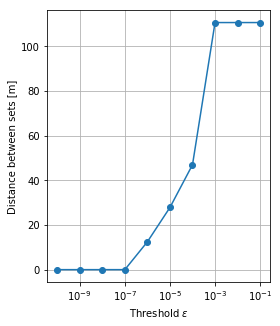

In [67]:
plt.figure(figsize=(4,5))
plt.semilogx(validation.loc[:,'eps'],validation.loc[:,'dist'],'o-')    
plt.grid()
plt.xlabel("Threshold $\epsilon$")
plt.ylabel("Distance between sets [m]")


Text(0, 0.5, 'Time [s]')

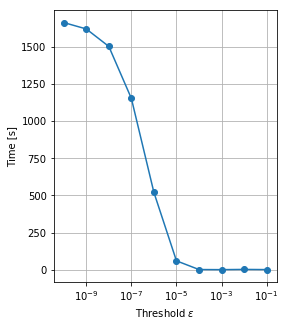

In [65]:
plt.figure(figsize=(4,5))
plt.semilogx(validation.loc[:,'eps'],validation.loc[:,'time'],'o-')    
plt.grid()
plt.xlabel("Threshold $\epsilon$")
plt.ylabel("Time [s]")


Text(0, 0.5, 'Average d_opt')

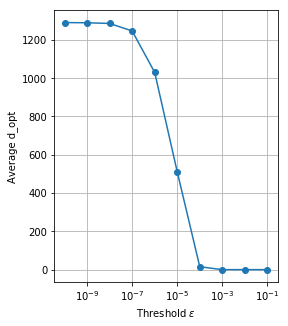

In [64]:
plt.figure(figsize=(4,5))
plt.semilogx(validation.loc[:,'eps'],validation.loc[:,'d_opt'].apply(np.mean),'o-')    
plt.grid()
plt.xlabel("Threshold $\epsilon$")
plt.ylabel("Average d_opt")


In [400]:
np.sum(np.linalg.norm(loc_df.loc[A_opt['local'],:].values -  loc_df.loc[A_opt['lazy'],:].values,axis=1))

89.28175403959759

In [169]:
np.sum(np.linalg.norm(loc_df.loc[A_opt['local_eps'],:].values -  loc_df.loc[A_opt['lazy'],:].values,axis=1))

60.7942530855986

In [ ]:
d_range = [10,20,30,40,50,60,70,80,90,100,130,160,190, 250, 300, 350, 400, 500, 600, 700, 800, 900]
dist = []
for d in d_range:
    A_opt['local'] = sensor_loc_optimisation_naive_local(k,cov, "fixed", d, sets)
    dist.append(np.sum(np.linalg.norm(loc_df.loc[A_opt['local'],:].values -  loc_df.loc[A_opt['lazy'],:].values,axis=1)))

In [294]:
loc_df.loc[A_opt['local'],:]

,X,Y,Z
23399,16.312404,-1.260180,4.785623
11787,2.851225,12.281740,13.500000
37748,13.440969,1.442257,0.200000
31462,18.836989,-2.580306,3.651052
85670,2.162813,19.322572,4.641349
26787,-0.852907,15.704938,10.055821
3857,0.536449,12.102244,13.500000
63918,-2.278041,9.450979,13.180973
16327,3.023293,8.513032,13.500000
61206,13.469344,2.513685,9.722393


In [318]:
S_2 = loc_df.loc[A_opt['local_eps'],:].values

In [319]:
S_1 = loc_df.loc[A_opt['lazy'],:].values

In [297]:
N = S_1.shape[0]
idx = np.zeros((S_1.shape[0],S_1.shape[0])).astype(int)
distmat = np.zeros((S_1.shape[0],S_1.shape[0]))
for i in range(S_1.shape[0]):
    idx[i,:] = np.argsort([np.linalg.norm(S_1[i,:] - S_2[k,:]) for k in range(S_2.shape[0])])
    distmat[i,:] = np.sort([np.linalg.norm(S_1[i,:] - S_2[k,:]) for k in range(S_2.shape[0])])
i = 0
closest_idx = dict(zip(list(range(S_1.shape[0])),idx[:,0]))
closest_dist = dict(zip(list(range(S_1.shape[0])),distmat[:,0]))

closest_idx

{0: 0, 1: 1, 2: 2, 3: 4, 4: 0, 5: 5, 6: 7, 7: 8, 8: 8, 9: 6}

In [298]:
[np.sum(idx[:,0] == idx[i,0])-1 for i in range(N)]

[1, 0, 0, 0, 1, 0, 0, 1, 1, 0]

In [299]:
[np.sum(idx[:,0] == idx[i,0])-1 for i in range(N)]

[1, 0, 0, 0, 1, 0, 0, 1, 1, 0]

In [300]:
idx[4,]

array([0, 3, 9, 2, 8, 1, 6, 7, 5, 4])

In [301]:
dist_dict = dict()
for i in range(N):
    dist_dict[i] = dict(zip(idx[i,],distmat[i,]))
dist_dict

{0: {0: 0.0,
  3: 3.066515390136874,
  2: 6.04782967396397,
  9: 6.833501424785458,
  8: 18.656272140173655,
  1: 20.98874216097033,
  6: 22.436030565503096,
  7: 23.03943233202736,
  5: 24.702997681384616,
  4: 24.977618250014608},
 1: {1: 2.5672092002826283,
  6: 2.8402008602358193,
  5: 4.49122254198476,
  8: 6.237659399200921,
  7: 6.61728880523437,
  4: 10.028557445721587,
  9: 17.22807569298372,
  2: 22.042835736368044,
  0: 23.20570175135767,
  3: 26.130542337146988},
 2: {2: 0.0,
  0: 6.04782967396397,
  3: 7.563583954301399,
  9: 9.582522282074509,
  8: 18.314306762914637,
  1: 20.162516643392603,
  6: 21.378773385474616,
  4: 21.60157510985053,
  7: 21.902797848433053,
  5: 22.46944958905681},
 3: {4: 0.0,
  5: 7.176234828413138,
  1: 11.336794830905282,
  6: 11.543565035952147,
  7: 13.787482880856343,
  8: 14.002224017380236,
  9: 20.885241996562314,
  2: 21.60157510985053,
  0: 24.977618250014608,
  3: 27.545324317379123},
 4: {0: 1.6347293419554516,
  3: 2.867408269570384

In [302]:
dict_dup = dict()
for i in dist_dict:
    dict_dup[i] = 1
    print(min(dist_dict[i], key=dist_dict[i].get))

0
1
2
4
0
5
7
8
8
6


In [336]:
dist_set(A_opt['local'],A_opt['local_eps'],loc_df)

16.069312389289202

In [337]:
divergence_set(A_opt['local'],A_opt['local_eps'],loc_df)

14.739770098879571

In [324]:
S_1

array([[16.3124036 , -1.26018018,  4.78562335],
       [ 1.82332029, 14.63418039, 13.5       ],
       [13.44096945,  1.44225729,  0.2       ],
       [ 2.16281299, 19.32257192,  4.6413492 ],
       [17.50235303, -1.39998891,  5.8977447 ],
       [-0.85290658, 15.70493802, 10.05582118],
       [-1.16526356, 10.94998957, 13.5       ],
       [ 3.02329313,  8.51303181, 13.5       ],
       [ 9.40764168, 10.20464211, 13.5       ],
       [-1.19704242, 14.4140768 , 13.71003896]])

# TSV Comparison :

In [97]:
from utils.sensor_optimisation_tsvd import *

In [ ]:
tau=900
start = time.time()
A_opt['lazy'] = sensor_loc_optimisation_lazy(k,Z, sets, tau)
end = time.time()


In [105]:
A_opt['lazy']

array([ 2291, 74499, 39687, 79228, 14576, 54697, 53299, 65824, 16256,
       15384])

In [114]:
end - start

46.370155334472656

In [108]:
dist_set(A_opt['lazy'],A_opt['naive'],loc_df)

53.663258380472826

In [ ]:
tau_range = [10,20,30,40,50,60,70,80,90,100,150,200,300,400,500,600,800,1000,1200]
validation_tsvd = dict()

for i in tau_range:
    validation_tsvd[i] = dict()
    
    start = time.time()
    validation_tsvd[i]['A_opt']  = sensor_loc_optimisation_lazy(k,Z, sets, i)
    validation_tsvd[i]['time'] = time.time() - start
    print(validation_tsvd[i]['time'])
    
    

    validation_tsvd[i]['dist'] = dist_set(validation_tsvd[i]['A_opt'],A_opt['naive'],loc_df)
validvalidation_tsvdation

In [122]:
np.linspace(10,1200,40).astype(int)

array([  10,   40,   71,  101,  132,  162,  193,  223,  254,  284,  315,
        345,  376,  406,  437,  467,  498,  528,  559,  589,  620,  650,
        681,  711,  742,  772,  803,  833,  864,  894,  925,  955,  986,
       1016, 1047, 1077, 1108, 1138, 1169, 1200])

In [182]:
validation_tsvd = pd.DataFrame(validation_tsvd).T
validation_tsvd


,A_opt,dist,time
10,"[2291, 74499, 39687, 79228, 14576, 54697, 5329...",53.6633,44.5915
20,"[41204, 30576, 58367, 17066, 46020, 16256, 134...",45.2721,51.9014
30,"[41204, 54367, 46020, 58367, 1728, 37216, 2368...",52.7809,61.2112
40,"[24950, 45390, 41204, 58367, 13683, 37164, 372...",62.1019,69.065
50,"[20748, 54367, 50515, 21728, 37216, 851, 17183...",58.0496,77.489
60,"[42338, 85636, 21728, 1319, 18021, 11724, 6660...",64.2176,79.6631
70,"[2291, 91348, 2858, 45546, 37164, 1319, 68624,...",71.094,80.5582
80,"[20748, 37164, 1319, 30576, 6864, 11724, 15469...",59.9321,99.8066
90,"[24950, 54367, 70414, 50515, 6864, 346, 15469,...",65.6416,105.748
100,"[8473, 70414, 54367, 605, 34230, 10439, 60495,...",69.2021,114.133


Text(0, 0.5, 'Distance between sets [m]')

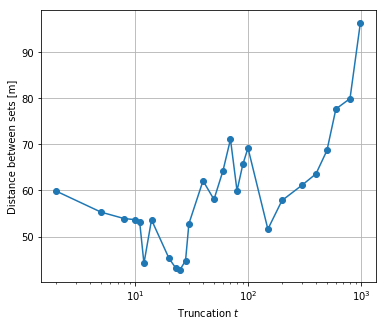

In [255]:
plt.figure(figsize=(6,5))
plt.semilogx(tau_range,validation_dist,'o-')    
plt.grid()
plt.xlabel("Truncation $t$")
plt.ylabel("Distance between sets [m]")


Text(0, 0.5, 'Time [s]')

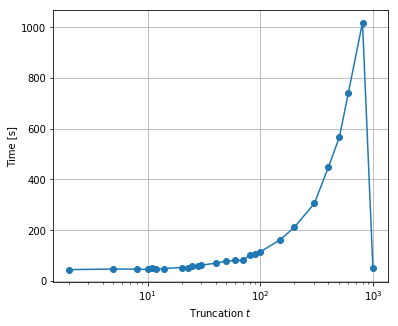

In [258]:
plt.figure(figsize=(6,5))
plt.semilogx(tau_range,validation_time,'o-')    
plt.grid()
plt.xlabel("Truncation $t$")
plt.ylabel("Time [s]")


In [160]:
A_opt['naive']

array([52731, 47876,  3078, 19782, 26045, 30511, 26754, 81507, 11608,
        3903])

In [247]:
#validation_tsvd = validation_tsvd.T.to_dict()
#validation_tsvd = dict()
i = 23
validation_tsvd[i] = dict()

start = time.time()
validation_tsvd[i]['A_opt']  = sensor_loc_optimisation_lazy(k,Z, sets, i)
validation_tsvd[i]['time'] = time.time() - start
print(validation_tsvd[i]['time'])



validation_tsvd[i]['dist'] = dist_set(validation_tsvd[i]['A_opt'],A_opt['naive'],loc_df)































































































































































































  0%|          | 0/10 [00:00<?, ?it/s]






























































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]






























































































































































































Inner Loop:   0%|          | 4/1295 [00:00<00:32, 39.18it/s]






























































































































































































Inner Loop:   1%|          | 8/1295 [00:00<00:33, 38.14it/s]




























Inner Loop:   2%|▏         | 32/1295 [00:00<00:32, 38.30it/s]






























































































































































































Inner Loop:   3%|▎         | 36/1295 [00:00<00:32, 38.39it/s]






























































































































































































Inner Loop:   3%|▎         | 40/1295 [00:01<00:32, 38.44it/s]






























































































































































































Inner Loop:   3%|▎         | 44/1295 [00:01<00:32, 38.45it/s]
























































































































































































Inner Loop:   6%|▌         | 72/1295 [00:01<00:31, 38.78it/s]






























































































































































































Inner Loop:   6%|▌         | 76/1295 [00:01<00:31, 38.81it/s]






























































































































































































Inner Loop:   6%|▌         | 80/1295 [00:02<00:31, 38.85it/s]






























































































































































































Inner Loop:   6%|▋         | 84/1295 [00:02<00:31, 38.88it/s]
























































































































































































Inner Loop:   9%|▉         | 118/1295 [00:03<00:29, 40.55it/s]






























































































































































































Inner Loop:   9%|▉         | 123/1295 [00:03<00:28, 40.65it/s]






























































































































































































Inner Loop:  10%|▉         | 128/1295 [00:03<00:28, 40.69it/s]






























































































































































































Inner Loop:  10%|█         | 133/1295 [00:03<00:28, 40.74it/s]




















































































































































































Inner Loop:  13%|█▎        | 168/1295 [00:04<00:27, 40.73it/s]






























































































































































































Inner Loop:  13%|█▎        | 173/1295 [00:04<00:27, 40.61it/s]






























































































































































































Inner Loop:  14%|█▎        | 178/1295 [00:04<00:27, 40.49it/s]






























































































































































































Inner Loop:  14%|█▍        | 183/1295 [00:04<00:27, 40.43it/s]




















































































































































































Inner Loop:  17%|█▋        | 218/1295 [00:05<00:26, 40.33it/s]






























































































































































































Inner Loop:  17%|█▋        | 223/1295 [00:05<00:26, 40.37it/s]






























































































































































































Inner Loop:  18%|█▊        | 228/1295 [00:05<00:26, 40.47it/s]






























































































































































































Inner Loop:  18%|█▊        | 233/1295 [00:05<00:26, 40.50it/s]




















































































































































































Inner Loop:  21%|██        | 268/1295 [00:06<00:25, 40.39it/s]






























































































































































































Inner Loop:  21%|██        | 273/1295 [00:06<00:25, 40.36it/s]






























































































































































































Inner Loop:  21%|██▏       | 278/1295 [00:06<00:26, 39.03it/s]






























































































































































































Inner Loop:  22%|██▏       | 282/1295 [00:07<00:26, 38.10it/s]




















































































































































































Inner Loop:  24%|██▍       | 310/1295 [00:07<00:27, 36.27it/s]






























































































































































































Inner Loop:  24%|██▍       | 314/1295 [00:07<00:27, 36.22it/s]






























































































































































































Inner Loop:  25%|██▍       | 318/1295 [00:08<00:27, 36.17it/s]






























































































































































































Inner Loop:  25%|██▍       | 322/1295 [00:08<00:26, 36.16it/s]




















































































































































































Inner Loop:  27%|██▋       | 350/1295 [00:08<00:26, 36.11it/s]






























































































































































































Inner Loop:  27%|██▋       | 354/1295 [00:09<00:26, 36.12it/s]






























































































































































































Inner Loop:  28%|██▊       | 358/1295 [00:09<00:25, 36.11it/s]






























































































































































































Inner Loop:  28%|██▊       | 362/1295 [00:09<00:25, 36.12it/s]




















































































































































































Inner Loop:  30%|███       | 390/1295 [00:10<00:25, 36.11it/s]






























































































































































































Inner Loop:  30%|███       | 394/1295 [00:10<00:24, 36.11it/s]






























































































































































































Inner Loop:  31%|███       | 398/1295 [00:10<00:24, 36.12it/s]






























































































































































































Inner Loop:  31%|███       | 402/1295 [00:10<00:24, 36.12it/s]




















































































































































































Inner Loop:  33%|███▎      | 430/1295 [00:11<00:23, 36.13it/s]






























































































































































































Inner Loop:  34%|███▎      | 434/1295 [00:11<00:23, 36.13it/s]






























































































































































































Inner Loop:  34%|███▍      | 438/1295 [00:11<00:23, 36.12it/s]






























































































































































































Inner Loop:  34%|███▍      | 442/1295 [00:11<00:23, 36.13it/s]




















































































































































































Inner Loop:  36%|███▋      | 470/1295 [00:12<00:22, 36.12it/s]






























































































































































































Inner Loop:  37%|███▋      | 474/1295 [00:12<00:22, 36.12it/s]






























































































































































































Inner Loop:  37%|███▋      | 478/1295 [00:12<00:22, 36.13it/s]






























































































































































































Inner Loop:  37%|███▋      | 482/1295 [00:12<00:22, 36.12it/s]




















































































































































































Inner Loop:  39%|███▉      | 510/1295 [00:13<00:21, 36.11it/s]






























































































































































































Inner Loop:  40%|███▉      | 514/1295 [00:13<00:21, 36.09it/s]






























































































































































































Inner Loop:  40%|████      | 518/1295 [00:13<00:21, 36.11it/s]






























































































































































































Inner Loop:  40%|████      | 522/1295 [00:13<00:21, 36.10it/s]




















































































































































































Inner Loop:  42%|████▏     | 550/1295 [00:14<00:20, 36.03it/s]






























































































































































































Inner Loop:  43%|████▎     | 554/1295 [00:14<00:20, 36.08it/s]






























































































































































































Inner Loop:  43%|████▎     | 558/1295 [00:14<00:20, 36.08it/s]






























































































































































































Inner Loop:  43%|████▎     | 562/1295 [00:14<00:20, 36.08it/s]




















































































































































































Inner Loop:  46%|████▌     | 593/1295 [00:15<00:17, 39.06it/s]






























































































































































































Inner Loop:  46%|████▌     | 598/1295 [00:15<00:17, 39.43it/s]






























































































































































































Inner Loop:  47%|████▋     | 603/1295 [00:15<00:17, 39.71it/s]






























































































































































































Inner Loop:  47%|████▋     | 607/1295 [00:16<00:17, 38.23it/s]




















































































































































































Inner Loop:  49%|████▉     | 635/1295 [00:16<00:18, 36.54it/s]






























































































































































































Inner Loop:  49%|████▉     | 640/1295 [00:16<00:17, 37.71it/s]






























































































































































































Inner Loop:  50%|████▉     | 645/1295 [00:17<00:16, 38.60it/s]






























































































































































































Inner Loop:  50%|█████     | 650/1295 [00:17<00:16, 39.20it/s]




















































































































































































Inner Loop:  53%|█████▎    | 685/1295 [00:18<00:15, 40.61it/s]






























































































































































































Inner Loop:  53%|█████▎    | 690/1295 [00:18<00:14, 40.66it/s]






























































































































































































Inner Loop:  54%|█████▎    | 695/1295 [00:18<00:14, 40.69it/s]






























































































































































































Inner Loop:  54%|█████▍    | 700/1295 [00:18<00:14, 40.72it/s]




















































































































































































Inner Loop:  57%|█████▋    | 735/1295 [00:19<00:13, 40.74it/s]






























































































































































































Inner Loop:  57%|█████▋    | 740/1295 [00:19<00:13, 40.76it/s]






























































































































































































Inner Loop:  58%|█████▊    | 745/1295 [00:19<00:13, 40.78it/s]






























































































































































































Inner Loop:  58%|█████▊    | 750/1295 [00:19<00:13, 40.78it/s]




















































































































































































Inner Loop:  61%|██████    | 785/1295 [00:20<00:12, 40.79it/s]






























































































































































































Inner Loop:  61%|██████    | 790/1295 [00:20<00:12, 40.79it/s]






























































































































































































Inner Loop:  61%|██████▏   | 795/1295 [00:20<00:12, 40.76it/s]






























































































































































































Inner Loop:  62%|██████▏   | 800/1295 [00:20<00:12, 40.78it/s]




















































































































































































Inner Loop:  64%|██████▍   | 835/1295 [00:21<00:11, 40.75it/s]






























































































































































































Inner Loop:  65%|██████▍   | 840/1295 [00:21<00:11, 40.74it/s]






























































































































































































Inner Loop:  65%|██████▌   | 845/1295 [00:21<00:11, 40.77it/s]






























































































































































































Inner Loop:  66%|██████▌   | 850/1295 [00:22<00:10, 40.77it/s]




















































































































































































Inner Loop:  68%|██████▊   | 885/1295 [00:22<00:10, 40.80it/s]






























































































































































































Inner Loop:  69%|██████▊   | 890/1295 [00:23<00:09, 40.79it/s]






























































































































































































Inner Loop:  69%|██████▉   | 895/1295 [00:23<00:09, 40.78it/s]






























































































































































































Inner Loop:  69%|██████▉   | 900/1295 [00:23<00:09, 40.81it/s]




















































































































































































Inner Loop:  72%|███████▏  | 935/1295 [00:24<00:08, 40.82it/s]






























































































































































































Inner Loop:  73%|███████▎  | 940/1295 [00:24<00:08, 40.82it/s]






























































































































































































Inner Loop:  73%|███████▎  | 945/1295 [00:24<00:08, 40.83it/s]






























































































































































































Inner Loop:  73%|███████▎  | 950/1295 [00:24<00:08, 40.81it/s]




















































































































































































Inner Loop:  76%|███████▌  | 985/1295 [00:25<00:07, 40.75it/s]






























































































































































































Inner Loop:  76%|███████▋  | 990/1295 [00:25<00:07, 40.77it/s]






























































































































































































Inner Loop:  77%|███████▋  | 995/1295 [00:25<00:07, 40.78it/s]






























































































































































































Inner Loop:  77%|███████▋  | 1000/1295 [00:25<00:07, 40.78it/s]



















































































































































































Inner Loop:  80%|███████▉  | 1035/1295 [00:26<00:06, 40.78it/s]






























































































































































































Inner Loop:  80%|████████  | 1040/1295 [00:26<00:06, 40.79it/s]






























































































































































































Inner Loop:  81%|████████  | 1045/1295 [00:26<00:06, 40.77it/s]






























































































































































































Inner Loop:  81%|████████  | 1050/1295 [00:26<00:06, 40.74it/s]
















































































































































































Inner Loop:  84%|████████▍ | 1085/1295 [00:27<00:05, 40.79it/s]






























































































































































































Inner Loop:  84%|████████▍ | 1090/1295 [00:27<00:05, 40.74it/s]






























































































































































































Inner Loop:  85%|████████▍ | 1095/1295 [00:28<00:04, 40.74it/s]






























































































































































































Inner Loop:  85%|████████▍ | 1100/1295 [00:28<00:04, 40.76it/s]
















































































































































































Inner Loop:  88%|████████▊ | 1135/1295 [00:29<00:03, 40.75it/s]






























































































































































































Inner Loop:  88%|████████▊ | 1140/1295 [00:29<00:03, 40.77it/s]






























































































































































































Inner Loop:  88%|████████▊ | 1145/1295 [00:29<00:03, 40.78it/s]






























































































































































































Inner Loop:  89%|████████▉ | 1150/1295 [00:29<00:03, 40.78it/s]
















































































































































































Inner Loop:  92%|█████████▏| 1185/1295 [00:30<00:02, 40.77it/s]






























































































































































































Inner Loop:  92%|█████████▏| 1190/1295 [00:30<00:02, 40.79it/s]






























































































































































































Inner Loop:  92%|█████████▏| 1195/1295 [00:30<00:02, 40.79it/s]






























































































































































































Inner Loop:  93%|█████████▎| 1200/1295 [00:30<00:02, 40.72it/s]
















































































































































































Inner Loop:  95%|█████████▌| 1235/1295 [00:31<00:01, 40.75it/s]






























































































































































































Inner Loop:  96%|█████████▌| 1240/1295 [00:31<00:01, 40.74it/s]






























































































































































































Inner Loop:  96%|█████████▌| 1245/1295 [00:31<00:01, 40.76it/s]






























































































































































































Inner Loop:  97%|█████████▋| 1250/1295 [00:31<00:01, 40.74it/s]
















































































































































































Inner Loop:  99%|█████████▉| 1285/1295 [00:32<00:00, 40.72it/s]






























































































































































































Inner Loop: 100%|█████████▉| 1290/1295 [00:32<00:00, 40.74it/s]






























































































































































































Inner Loop: 100%|██████████| 1295/1295 [00:32<00:00, 40.76it/s]





























































































































































































 10%|█         | 1/10 [00:33<04:57, 33.03s/it]































































































































































































I

[41204]


































































































































































































Inner Loop:   1%|          | 11/1295 [00:00<00:27, 46.38it/s]































































































































































































Inner Loop:   1%|          | 16/1295 [00:00<00:28, 44.49it/s]































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00:29, 43.34it/s]





























































































































































































 20%|██        | 2/10 [00:33<03:06, 23.30s/it]






[41204 30576]


































































































































































































Inner Loop:   1%|          | 11/1295 [00:00<00:28, 45.85it/s]































































































































































































Inner Loop:   1%|          | 16/1295 [00:00<00:28, 44.21it/s]































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00:29, 43.14it/s]































































































































































































Inner Loop:   2%|▏         | 26/1295 [00:00<00:29

Inner Loop:   4%|▍         | 56/1295 [00:01<00:30, 40.95it/s]





























































































































































































 30%|███       | 3/10 [00:35<01:57, 16.74s/it]
































































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]































































































































































































Inner Loop:   5%|▍         | 59/1295 [00:01<00:29, 41.26it/s]































































































































































































Inner Loop:  

[41204 30576 37164]


































































































































































































Inner Loop:   1%|          | 10/1295 [00:00<00:27, 46.66it/s]































































































































































































Inner Loop:   1%|          | 15/1295 [00:00<00:28, 44.71it/s]































































































































































































Inner Loop:   2%|▏         | 20/1295 [00:00<00:29, 43.44it/s]





























































































































































































 40%|████      | 4/10 [00:35<01:11, 11.89s/it]






[41204 30576 37164 58367]


































































































































































































Inner Loop:   1%|          | 11/1295 [00:00<00:28, 45.81it/s]































































































































































































Inner Loop:   1%|          | 16/1295 [00:00<00:28, 44.17it/s]































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00:29, 43.07it/s]































































































































































































Inner Loop:   2%|▏         | 26/1295 [00:00<00:29

Inner Loop:   4%|▍         | 55/1295 [00:01<00:30, 40.56it/s]































































































































































































Inner Loop:   5%|▍         | 59/1295 [00:01<00:30, 40.33it/s]































































































































































































Inner Loop:   5%|▍         | 63/1295 [00:01<00:30, 40.16it/s]































































































































































































Inner Loop:   5%|▌         | 67/1295 [00:01<00:30, 40.02it/s]





















































































































































































Inner Loop:   7%|▋         | 95/1295 [00:02<00:30, 39.75it/s]































































































































































































Inner Loop:   8%|▊         | 99/1295 [00:02<00:30, 39.74it/s]































































































































































































Inner Loop:   8%|▊         | 103/1295 [00:02<00:29, 39.75it/s]































































































































































































Inner Loop:   8%|▊         | 107/1295 [00:02<00:29, 39.75it/s]



















































































































































































Inner Loop:  10%|█         | 135/1295 [00:03<00:29, 39.74it/s]































































































































































































Inner Loop:  11%|█         | 139/1295 [00:03<00:29, 39.75it/s]































































































































































































Inner Loop:  11%|█         | 143/1295 [00:03<00:28, 39.76it/s]































































































































































































Inner Loop:  11%|█▏        | 147/1295 [00:03<00:28, 39.76it/s]

















































































































































































[41204 30576 37164 58367 16256]


































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<00:31, 41.08it/s]































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<00:31, 40.71it/s]































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:00<00:31, 40.42it/s]































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00:31,

Inner Loop:   3%|▎         | 45/1295 [00:01<00:31, 39.74it/s]































































































































































































Inner Loop:   4%|▍         | 49/1295 [00:01<00:31, 39.73it/s]































































































































































































Inner Loop:   4%|▍         | 53/1295 [00:01<00:31, 39.73it/s]































































































































































































Inner Loop:   4%|▍         | 57/1295 [00:01<00:31, 39.74it/s]





















































































































































































Inner Loop:   7%|▋         | 85/1295 [00:02<00:31, 38.19it/s]































































































































































































Inner Loop:   7%|▋         | 89/1295 [00:02<00:31, 38.62it/s]































































































































































































Inner Loop:   7%|▋         | 93/1295 [00:02<00:30, 38.94it/s]































































































































































































Inner Loop:   7%|▋         | 97/1295 [00:02<00:30, 39.18it/s]





















































































































































































Inner Loop:  10%|▉         | 125/1295 [00:03<00:29, 39.63it/s]































































































































































































Inner Loop:  10%|▉         | 129/1295 [00:03<00:29, 39.65it/s]































































































































































































Inner Loop:  10%|█         | 133/1295 [00:03<00:29, 39.65it/s]































































































































































































Inner Loop:  11%|█         | 137/1295 [00:03<00:29, 39.70it/s]

















































































































































































[41204 30576 37164 58367 16256 13945]



































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<00:27, 46.31it/s]
































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<00:29, 44.19it/s]
































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:00<00:29, 42.79it/s]
































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00

Inner Loop:   3%|▎         | 34/1295 [00:00<00:31, 40.54it/s]
































































































































































































Inner Loop:   0%|          | 5/1295 [00:00<00:27, 47.69it/s]

[41204 30576 37164 58367 16256 13945 13403]



































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<00:28, 44.77it/s]
































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<00:29, 43.16it/s]
































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:00<00:30, 42.09it/s]
































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00

[41204 30576 37164 58367 16256 13945 13403 18411]



































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<00:28, 45.38it/s]
































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<00:29, 43.58it/s]
































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:00<00:30, 42.31it/s]
































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00

Inner Loop:   3%|▎         | 45/1295 [00:01<00:31, 39.97it/s]
































































































































































































Inner Loop:   4%|▍         | 49/1295 [00:01<00:31, 39.93it/s]
































































































































































































Inner Loop:   4%|▍         | 53/1295 [00:01<00:31, 39.83it/s]
































































































































































































Inner Loop:   4%|▍         | 57/1295 [00:01<00:31, 39.82it/s]


















































































































































































Inner Loop:   7%|▋         | 85/1295 [00:02<00:30, 39.81it/s]
































































































































































































Inner Loop:   7%|▋         | 89/1295 [00:02<00:30, 39.71it/s]
































































































































































































Inner Loop:   7%|▋         | 93/1295 [00:02<00:30, 39.73it/s]
































































































































































































Inner Loop:   7%|▋         | 97/1295 [00:02<00:30, 39.75it/s]


















































































































































































[41204 30576 37164 58367 16256 13945 13403 18411 20905]



































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<00:28, 44.94it/s]
































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<00:29, 43.27it/s]
































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:00<00:30, 42.14it/s]
































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:00<00

Inner Loop:   3%|▎         | 45/1295 [00:01<00:31, 39.92it/s]
































































































































































































Inner Loop:   4%|▍         | 49/1295 [00:01<00:31, 39.85it/s]
































































































































































































Inner Loop:   4%|▍         | 53/1295 [00:01<00:31, 39.83it/s]
































































































































































































Inner Loop:   4%|▍         | 57/1295 [00:01<00:31, 39.74it/s]


















































































































































































Inner Loop:   7%|▋         | 85/1295 [00:02<00:30, 39.73it/s]
































































































































































































Inner Loop:   7%|▋         | 89/1295 [00:02<00:30, 39.74it/s]
































































































































































































Inner Loop:   7%|▋         | 93/1295 [00:02<00:30, 39.67it/s]
































































































































































































Inner Loop:   7%|▋         | 97/1295 [00:02<00:30, 39.70it/s]


















































































































































































Inner Loop:  10%|▉         | 125/1295 [00:03<00:29, 39.71it/s]
































































































































































































Inner Loop:  10%|▉         | 129/1295 [00:03<00:29, 39.67it/s]





























































































































































































100%|██████████| 10/10 [00:50<00:00,  3.55s/it]

[41204 30576 37164 58367 16256 13945 13403 18411 20905 30566]
50.48015642166138
































































































































































































Inner Loop: 1296it [00:52, 40.76it/s]                          






























































































































































































Inner Loop:  12%|█▏        | 150/1295 [00:22<00:28, 39.70it/s]

In [248]:
validation_tsvd

{200: {},
 5: {'A_opt': array([ 2293, 30576, 52653, 14455, 58367, 15924, 56491,  9223, 14576,
         45546]),
  'time': 46.0302836894989,
  'dist': 55.30014756744285},
 2: {'A_opt': array([10195, 18367,  1075, 29395,  9689, 44721, 79403, 36029,  8477,
         22070]), 'time': 43.52186846733093, 'dist': 59.8694986265659},
 12: {'A_opt': array([21604, 34229, 46020,  6525, 79228, 41204, 30511, 14576, 16256,
         37216]), 'time': 44.93299102783203, 'dist': 44.17146031560189},
 14: {'A_opt': array([14455, 34229, 79228, 39687, 46020, 11724, 39486, 17017, 53299,
         27186]), 'time': 47.96567130088806, 'dist': 53.629040970496334},
 8: {'A_opt': array([91348,  2293, 79228,  1498, 28404, 53299, 14576, 22194, 65824,
         54697]), 'time': 45.32574701309204, 'dist': 53.907206828515044},
 11: {'A_opt': array([29544, 74499, 79228,  2857,  1498, 65824, 54697, 53299, 14576,
         11974]), 'time': 48.380043268203735, 'dist': 53.14688802439049},
 20: {'A_opt': array([41204, 30576, 5836

In [254]:
tau_range = [2, 5,8, 10,11, 12, 14 ,20,23,25,28, 30,40,50,60,70,80,90,100,150,200,300,400,500,600,800,989]

validation_dist = [59.869, 55.3001, 53.9072,  53.6633, 53.146888,  44.1714, 53.6290,  45.2721, 43.131876, 42.8221, 44.741756, 52.7809, 62.1019, 58.0496, 64.2176, 71.094, 59.9321, 65.6416, 69.2021, 51.6019, 57.8224, 61.1175, 63.6066, 68.6706, 77.6655, 79.9222, 96.4155]

validation_time = [43.521, 46.03028, 45.3257, 44.5915, 48.380, 44.9329, 47.9656,  51.9014, 50.480156, 56.9745, 56.54710, 61.2112, 69.065, 77.489, 79.6631, 80.5582, 99.8066, 105.748, 114.133, 161.956, 211.3016, 305.006, 448.916, 567.167, 741.888, 1018.8, 49.403]



In [274]:
validation_tsvd_df = pd.DataFrame(index=tau_range, data=np.array([validation_dist,validation_time]).T,columns=['dist','time']).sort_index()


In [279]:
print(validation_tsvd_df.T.to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrrrrrrrrrrrrrrrrrrrrrr}
\toprule
{} &   2   &   5   &   8   &   10  &   11  &   12  &   14  &   20  &   23  &   25  &   28  &   30  &   40  &   50  &   60  &   70  &   80  &    90  &    100 &    150 &    200 &    300 &    400 &    500 &    600 &     800 &   989 \\
\midrule
dist & 59.87 & 55.30 & 53.91 & 53.66 & 53.15 & 44.17 & 53.63 & 45.27 & 43.13 & 42.82 & 44.74 & 52.78 & 62.10 & 58.05 & 64.22 & 71.09 & 59.93 &  65.64 &  69.20 &  51.60 &  57.82 &  61.12 &  63.61 &  68.67 &  77.67 &   79.92 & 96.42 \\
time & 43.52 & 46.03 & 45.33 & 44.59 & 48.38 & 44.93 & 47.97 & 51.90 & 50.48 & 56.97 & 56.55 & 61.21 & 69.06 & 77.49 & 79.66 & 80.56 & 99.81 & 105.75 & 114.13 & 161.96 & 211.30 & 305.01 & 448.92 & 567.17 & 741.89 & 1018.80 & 49.40 \\
\bottomrule
\end{tabular}



In [177]:
tsvd = TruncatedSVD(n_components=989)
Z_Atau = tsvd.fit_transform(Z[S.astype(int), :].T).T

In [178]:
pd.DataFrame.reindex()

(989, 989)

In [186]:
validation_tsvd = validation_tsvd.T.to_dict()[200] = {'A_opt': np.array([ 3903, 37164,  6864, 54367,  1319,   851, 17865, 13683, 40282,
           346]), 'dist': 57.82241231442638, 'time': 211.30167269706726}

AttributeError: 'dict' object has no attribute 'T'

In [187]:
validation_tsvd

{'A_opt': array([ 3903, 37164,  6864, 54367,  1319,   851, 17865, 13683, 40282,
          346]), 'dist': 57.82241231442638, 'time': 211.30167269706726}

In [188]:
validation_tsvd

{'A_opt': array([ 3903, 37164,  6864, 54367,  1319,   851, 17865, 13683, 40282,
          346]), 'dist': 57.82241231442638, 'time': 211.30167269706726}

# Arbitrary Kernel

In [286]:
from utils.covariance import *
from scipy.spatial.distance import squareform, pdist

In [345]:
cov_matern52 = matern52_kernel(squareform(pdist(loc_df.loc[S,:])),15)
cov_matern52.shape

(1295, 1295)

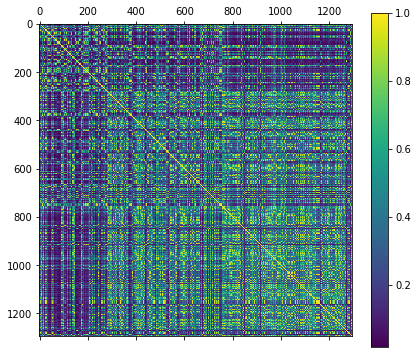

In [346]:
plt.figure(num=100,figsize=(7,6))
plt.matshow(cov_matern52,fignum=100)
plt.colorbar()

In [347]:
eig_matern52 = np.linalg.eigvalsh(cov_matern52)


Text(0, 0.5, 'Eigenvalues $\\lambda_i$')

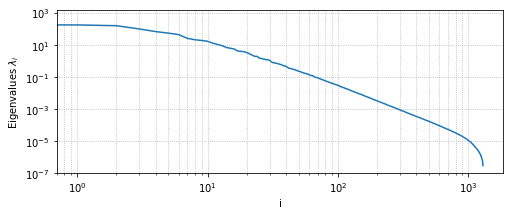

In [348]:
plt.figure(figsize=(8,3))
#plt.loglog(eig_emp[::-1])

#plt.loglog(eig_oas[::-1])

plt.loglog(eig_matern52[::-1])

plt.grid(True,which="both",ls=":")
plt.xlabel("i")
plt.ylabel("Eigenvalues $\lambda_i$")
#plt.legend(['Empirical', 'OAS'])

In [349]:
start = time.time()
A_opt_mattern = sensor_loc_optimisation_lazy(k,cov_matern52,sets)
end = time.time()












































































































































































































Main Loop : Sensor Placement:   0%|          | 0/10 [00:00<?, ?it/s]










































































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]










































































































































































































Inner Loop:   0%|          | 3/1295 [00:00<01:10, 18.27it/s]










































































































































































































Inner Loo

Inner Loop:   1%|▏         | 17/1295 [00:01<01:39, 12.81it/s]










































































































































































































Inner Loop:   1%|▏         | 19/1295 [00:01<01:40, 12.71it/s]










































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:01<01:40, 12.64it/s]










































































































































































































Inner Loop:   2%|▏         | 23/1295 [00:01<01:40, 12.61it/s]




















































































































































Inner Loop:   3%|▎         | 35/1295 [00:02<01:41, 12.44it/s]










































































































































































































Inner Loop:   3%|▎         | 37/1295 [00:02<01:41, 12.44it/s]










































































































































































































Inner Loop:   3%|▎         | 39/1295 [00:03<01:40, 12.44it/s]










































































































































































































Inner Loop:   3%|▎         | 41/1295 [00:03<01:40, 12.43it/s]




















































































































































Inner Loop:   4%|▍         | 53/1295 [00:04<01:40, 12.39it/s]










































































































































































































Inner Loop:   4%|▍         | 55/1295 [00:04<01:39, 12.43it/s]










































































































































































































Inner Loop:   4%|▍         | 57/1295 [00:04<01:39, 12.44it/s]










































































































































































































Inner Loop:   5%|▍         | 59/1295 [00:04<01:39, 12.45it/s]




















































































































































Inner Loop:   5%|▌         | 71/1295 [00:05<01:38, 12.49it/s]










































































































































































































Inner Loop:   6%|▌         | 73/1295 [00:05<01:37, 12.49it/s]










































































































































































































Inner Loop:   6%|▌         | 75/1295 [00:05<01:37, 12.47it/s]










































































































































































































Inner Loop:   6%|▌         | 77/1295 [00:06<01:38, 12.34it/s]




















































































































































Inner Loop:   7%|▋         | 89/1295 [00:07<01:39, 12.07it/s]










































































































































































































Inner Loop:   7%|▋         | 91/1295 [00:07<01:38, 12.21it/s]










































































































































































































Inner Loop:   7%|▋         | 93/1295 [00:07<01:37, 12.31it/s]










































































































































































































Inner Loop:   7%|▋         | 95/1295 [00:07<01:36, 12.37it/s]




















































































































































Inner Loop:   8%|▊         | 107/1295 [00:08<01:35, 12.43it/s]










































































































































































































Inner Loop:   8%|▊         | 109/1295 [00:08<01:35, 12.45it/s]










































































































































































































Inner Loop:   9%|▊         | 111/1295 [00:08<01:34, 12.47it/s]










































































































































































































Inner Loop:   9%|▊         | 113/1295 [00:09<01:34, 12.49it/s]
















































































































































Inner Loop:  10%|▉         | 125/1295 [00:10<01:33, 12.53it/s]










































































































































































































Inner Loop:  10%|▉         | 127/1295 [00:10<01:33, 12.52it/s]










































































































































































































Inner Loop:  10%|▉         | 129/1295 [00:10<01:34, 12.38it/s]










































































































































































































Inner Loop:  10%|█         | 131/1295 [00:10<01:33, 12.42it/s]
















































































































































Inner Loop:  11%|█         | 143/1295 [00:11<01:31, 12.53it/s]










































































































































































































Inner Loop:  11%|█         | 145/1295 [00:11<01:31, 12.53it/s]










































































































































































































Inner Loop:  11%|█▏        | 147/1295 [00:11<01:31, 12.52it/s]










































































































































































































Inner Loop:  12%|█▏        | 149/1295 [00:11<01:32, 12.46it/s]
















































































































































Inner Loop:  12%|█▏        | 161/1295 [00:12<01:30, 12.52it/s]










































































































































































































Inner Loop:  13%|█▎        | 163/1295 [00:13<01:30, 12.52it/s]










































































































































































































Inner Loop:  13%|█▎        | 165/1295 [00:13<01:30, 12.53it/s]










































































































































































































Inner Loop:  13%|█▎        | 167/1295 [00:13<01:30, 12.53it/s]
















































































































































Inner Loop:  14%|█▍        | 179/1295 [00:14<01:29, 12.46it/s]










































































































































































































Inner Loop:  14%|█▍        | 181/1295 [00:14<01:29, 12.48it/s]










































































































































































































Inner Loop:  14%|█▍        | 183/1295 [00:14<01:28, 12.50it/s]










































































































































































































Inner Loop:  14%|█▍        | 185/1295 [00:14<01:28, 12.50it/s]
















































































































































Inner Loop:  15%|█▌        | 197/1295 [00:15<01:27, 12.50it/s]










































































































































































































Inner Loop:  15%|█▌        | 199/1295 [00:15<01:27, 12.49it/s]










































































































































































































Inner Loop:  16%|█▌        | 201/1295 [00:16<01:27, 12.50it/s]










































































































































































































Inner Loop:  16%|█▌        | 203/1295 [00:16<01:27, 12.50it/s]
















































































































































Inner Loop:  17%|█▋        | 215/1295 [00:17<01:26, 12.49it/s]










































































































































































































Inner Loop:  17%|█▋        | 217/1295 [00:17<01:26, 12.50it/s]










































































































































































































Inner Loop:  17%|█▋        | 219/1295 [00:17<01:26, 12.51it/s]










































































































































































































Inner Loop:  17%|█▋        | 221/1295 [00:17<01:26, 12.42it/s]
















































































































































Inner Loop:  18%|█▊        | 233/1295 [00:18<01:27, 12.19it/s]










































































































































































































Inner Loop:  18%|█▊        | 235/1295 [00:18<01:26, 12.30it/s]










































































































































































































Inner Loop:  18%|█▊        | 237/1295 [00:19<01:27, 12.10it/s]










































































































































































































Inner Loop:  18%|█▊        | 239/1295 [00:19<01:26, 12.23it/s]
















































































































































Inner Loop:  19%|█▉        | 251/1295 [00:20<01:23, 12.46it/s]










































































































































































































Inner Loop:  20%|█▉        | 253/1295 [00:20<01:23, 12.47it/s]










































































































































































































Inner Loop:  20%|█▉        | 255/1295 [00:20<01:23, 12.48it/s]










































































































































































































Inner Loop:  20%|█▉        | 257/1295 [00:20<01:24, 12.33it/s]
















































































































































Inner Loop:  21%|██        | 269/1295 [00:21<01:23, 12.35it/s]










































































































































































































Inner Loop:  21%|██        | 271/1295 [00:21<01:22, 12.40it/s]










































































































































































































Inner Loop:  21%|██        | 273/1295 [00:21<01:22, 12.44it/s]










































































































































































































Inner Loop:  21%|██        | 275/1295 [00:22<01:21, 12.45it/s]
















































































































































Inner Loop:  22%|██▏       | 287/1295 [00:23<01:21, 12.42it/s]










































































































































































































Inner Loop:  22%|██▏       | 289/1295 [00:23<01:21, 12.28it/s]










































































































































































































Inner Loop:  22%|██▏       | 291/1295 [00:23<01:21, 12.31it/s]










































































































































































































Inner Loop:  23%|██▎       | 293/1295 [00:23<01:21, 12.34it/s]
















































































































































Inner Loop:  24%|██▎       | 305/1295 [00:24<01:19, 12.47it/s]










































































































































































































Inner Loop:  24%|██▎       | 307/1295 [00:24<01:19, 12.48it/s]










































































































































































































Inner Loop:  24%|██▍       | 309/1295 [00:24<01:18, 12.49it/s]










































































































































































































Inner Loop:  24%|██▍       | 311/1295 [00:24<01:18, 12.50it/s]
















































































































































Inner Loop:  25%|██▍       | 323/1295 [00:25<01:17, 12.51it/s]










































































































































































































Inner Loop:  25%|██▌       | 325/1295 [00:26<01:17, 12.51it/s]










































































































































































































Inner Loop:  25%|██▌       | 327/1295 [00:26<01:17, 12.51it/s]










































































































































































































Inner Loop:  25%|██▌       | 329/1295 [00:26<01:17, 12.52it/s]
















































































































































Inner Loop:  26%|██▋       | 341/1295 [00:27<01:16, 12.42it/s]










































































































































































































Inner Loop:  26%|██▋       | 343/1295 [00:27<01:16, 12.45it/s]










































































































































































































Inner Loop:  27%|██▋       | 345/1295 [00:27<01:16, 12.47it/s]










































































































































































































Inner Loop:  27%|██▋       | 347/1295 [00:27<01:15, 12.48it/s]
















































































































































Inner Loop:  28%|██▊       | 359/1295 [00:28<01:15, 12.46it/s]










































































































































































































Inner Loop:  28%|██▊       | 361/1295 [00:28<01:14, 12.49it/s]










































































































































































































Inner Loop:  28%|██▊       | 363/1295 [00:29<01:14, 12.47it/s]










































































































































































































Inner Loop:  28%|██▊       | 365/1295 [00:29<01:14, 12.47it/s]
















































































































































Inner Loop:  29%|██▉       | 377/1295 [00:30<01:13, 12.41it/s]










































































































































































































Inner Loop:  29%|██▉       | 379/1295 [00:30<01:13, 12.43it/s]










































































































































































































Inner Loop:  29%|██▉       | 381/1295 [00:30<01:13, 12.46it/s]










































































































































































































Inner Loop:  30%|██▉       | 383/1295 [00:30<01:13, 12.49it/s]
















































































































































Inner Loop:  31%|███       | 395/1295 [00:31<01:11, 12.52it/s]










































































































































































































Inner Loop:  31%|███       | 397/1295 [00:31<01:11, 12.54it/s]










































































































































































































Inner Loop:  31%|███       | 399/1295 [00:32<01:11, 12.53it/s]










































































































































































































Inner Loop:  31%|███       | 401/1295 [00:32<01:11, 12.52it/s]
















































































































































Inner Loop:  32%|███▏      | 413/1295 [00:33<01:10, 12.54it/s]










































































































































































































Inner Loop:  32%|███▏      | 415/1295 [00:33<01:10, 12.42it/s]










































































































































































































Inner Loop:  32%|███▏      | 417/1295 [00:33<01:10, 12.46it/s]










































































































































































































Inner Loop:  32%|███▏      | 419/1295 [00:33<01:10, 12.48it/s]
















































































































































Inner Loop:  33%|███▎      | 431/1295 [00:34<01:10, 12.21it/s]










































































































































































































Inner Loop:  33%|███▎      | 433/1295 [00:34<01:10, 12.23it/s]










































































































































































































Inner Loop:  34%|███▎      | 435/1295 [00:34<01:09, 12.31it/s]










































































































































































































Inner Loop:  34%|███▎      | 437/1295 [00:35<01:09, 12.38it/s]
















































































































































Inner Loop:  35%|███▍      | 449/1295 [00:36<01:07, 12.49it/s]










































































































































































































Inner Loop:  35%|███▍      | 451/1295 [00:36<01:07, 12.50it/s]










































































































































































































Inner Loop:  35%|███▍      | 453/1295 [00:36<01:07, 12.50it/s]










































































































































































































Inner Loop:  35%|███▌      | 455/1295 [00:36<01:07, 12.48it/s]
















































































































































Inner Loop:  36%|███▌      | 467/1295 [00:37<01:06, 12.43it/s]










































































































































































































Inner Loop:  36%|███▌      | 469/1295 [00:37<01:06, 12.45it/s]










































































































































































































Inner Loop:  36%|███▋      | 471/1295 [00:37<01:06, 12.47it/s]










































































































































































































Inner Loop:  37%|███▋      | 473/1295 [00:37<01:05, 12.47it/s]
















































































































































Inner Loop:  37%|███▋      | 485/1295 [00:38<01:04, 12.50it/s]










































































































































































































Inner Loop:  38%|███▊      | 487/1295 [00:39<01:04, 12.50it/s]










































































































































































































Inner Loop:  38%|███▊      | 489/1295 [00:39<01:04, 12.50it/s]










































































































































































































Inner Loop:  38%|███▊      | 491/1295 [00:39<01:04, 12.50it/s]
















































































































































Inner Loop:  39%|███▉      | 503/1295 [00:40<01:03, 12.50it/s]










































































































































































































Inner Loop:  39%|███▉      | 505/1295 [00:40<01:03, 12.49it/s]










































































































































































































Inner Loop:  39%|███▉      | 507/1295 [00:40<01:03, 12.49it/s]










































































































































































































Inner Loop:  39%|███▉      | 509/1295 [00:40<01:02, 12.49it/s]
















































































































































Inner Loop:  40%|████      | 521/1295 [00:41<01:01, 12.50it/s]










































































































































































































Inner Loop:  40%|████      | 523/1295 [00:41<01:01, 12.51it/s]










































































































































































































Inner Loop:  41%|████      | 525/1295 [00:42<01:01, 12.50it/s]










































































































































































































Inner Loop:  41%|████      | 527/1295 [00:42<01:01, 12.49it/s]
















































































































































Inner Loop:  42%|████▏     | 539/1295 [00:43<01:00, 12.48it/s]










































































































































































































Inner Loop:  42%|████▏     | 541/1295 [00:43<01:00, 12.50it/s]










































































































































































































Inner Loop:  42%|████▏     | 543/1295 [00:43<01:01, 12.32it/s]










































































































































































































Inner Loop:  42%|████▏     | 545/1295 [00:43<01:00, 12.37it/s]
















































































































































Inner Loop:  43%|████▎     | 557/1295 [00:44<00:59, 12.47it/s]










































































































































































































Inner Loop:  43%|████▎     | 559/1295 [00:44<00:58, 12.48it/s]










































































































































































































Inner Loop:  43%|████▎     | 561/1295 [00:45<00:58, 12.49it/s]










































































































































































































Inner Loop:  43%|████▎     | 563/1295 [00:45<00:58, 12.49it/s]
















































































































































Inner Loop:  44%|████▍     | 575/1295 [00:46<00:57, 12.46it/s]










































































































































































































Inner Loop:  45%|████▍     | 577/1295 [00:46<00:57, 12.48it/s]










































































































































































































Inner Loop:  45%|████▍     | 579/1295 [00:46<00:57, 12.48it/s]










































































































































































































Inner Loop:  45%|████▍     | 581/1295 [00:46<00:57, 12.49it/s]
















































































































































Inner Loop:  46%|████▌     | 593/1295 [00:47<00:56, 12.50it/s]










































































































































































































Inner Loop:  46%|████▌     | 595/1295 [00:47<00:56, 12.49it/s]










































































































































































































Inner Loop:  46%|████▌     | 597/1295 [00:47<00:55, 12.49it/s]










































































































































































































Inner Loop:  46%|████▋     | 599/1295 [00:48<00:55, 12.50it/s]
















































































































































Inner Loop:  47%|████▋     | 611/1295 [00:49<00:54, 12.50it/s]










































































































































































































Inner Loop:  47%|████▋     | 613/1295 [00:49<00:54, 12.48it/s]










































































































































































































Inner Loop:  47%|████▋     | 615/1295 [00:49<00:54, 12.49it/s]










































































































































































































Inner Loop:  48%|████▊     | 617/1295 [00:49<00:54, 12.49it/s]
















































































































































Inner Loop:  49%|████▊     | 629/1295 [00:50<00:53, 12.40it/s]










































































































































































































Inner Loop:  49%|████▊     | 631/1295 [00:50<00:54, 12.28it/s]










































































































































































































Inner Loop:  49%|████▉     | 633/1295 [00:50<00:53, 12.34it/s]










































































































































































































Inner Loop:  49%|████▉     | 635/1295 [00:50<00:53, 12.39it/s]
















































































































































Inner Loop:  50%|████▉     | 647/1295 [00:51<00:52, 12.40it/s]










































































































































































































Inner Loop:  50%|█████     | 649/1295 [00:52<00:51, 12.43it/s]










































































































































































































Inner Loop:  50%|█████     | 651/1295 [00:52<00:51, 12.46it/s]










































































































































































































Inner Loop:  50%|█████     | 653/1295 [00:52<00:51, 12.46it/s]
















































































































































Inner Loop:  51%|█████▏    | 665/1295 [00:53<00:50, 12.50it/s]










































































































































































































Inner Loop:  52%|█████▏    | 667/1295 [00:53<00:50, 12.49it/s]










































































































































































































Inner Loop:  52%|█████▏    | 669/1295 [00:53<00:50, 12.49it/s]










































































































































































































Inner Loop:  52%|█████▏    | 671/1295 [00:53<00:49, 12.49it/s]
















































































































































Inner Loop:  53%|█████▎    | 683/1295 [00:54<00:48, 12.49it/s]










































































































































































































Inner Loop:  53%|█████▎    | 685/1295 [00:54<00:48, 12.50it/s]










































































































































































































Inner Loop:  53%|█████▎    | 687/1295 [00:55<00:48, 12.51it/s]










































































































































































































Inner Loop:  53%|█████▎    | 689/1295 [00:55<00:48, 12.39it/s]
















































































































































Inner Loop:  54%|█████▍    | 701/1295 [00:56<00:47, 12.48it/s]










































































































































































































Inner Loop:  54%|█████▍    | 703/1295 [00:56<00:47, 12.48it/s]










































































































































































































Inner Loop:  54%|█████▍    | 705/1295 [00:56<00:47, 12.48it/s]










































































































































































































Inner Loop:  55%|█████▍    | 707/1295 [00:56<00:47, 12.50it/s]
















































































































































Inner Loop:  56%|█████▌    | 719/1295 [00:57<00:46, 12.49it/s]










































































































































































































Inner Loop:  56%|█████▌    | 721/1295 [00:57<00:45, 12.49it/s]










































































































































































































Inner Loop:  56%|█████▌    | 723/1295 [00:58<00:45, 12.49it/s]










































































































































































































Inner Loop:  56%|█████▌    | 725/1295 [00:58<00:45, 12.49it/s]
















































































































































Inner Loop:  57%|█████▋    | 737/1295 [00:59<00:44, 12.51it/s]










































































































































































































Inner Loop:  57%|█████▋    | 739/1295 [00:59<00:44, 12.50it/s]










































































































































































































Inner Loop:  57%|█████▋    | 741/1295 [00:59<00:44, 12.51it/s]










































































































































































































Inner Loop:  57%|█████▋    | 743/1295 [00:59<00:44, 12.49it/s]
















































































































































Inner Loop:  58%|█████▊    | 755/1295 [01:00<00:43, 12.46it/s]










































































































































































































Inner Loop:  58%|█████▊    | 757/1295 [01:00<00:43, 12.47it/s]










































































































































































































Inner Loop:  59%|█████▊    | 759/1295 [01:00<00:42, 12.48it/s]










































































































































































































Inner Loop:  59%|█████▉    | 761/1295 [01:01<00:42, 12.47it/s]
















































































































































Inner Loop:  60%|█████▉    | 773/1295 [01:02<00:41, 12.52it/s]










































































































































































































Inner Loop:  60%|█████▉    | 775/1295 [01:02<00:41, 12.51it/s]










































































































































































































Inner Loop:  60%|██████    | 777/1295 [01:02<00:41, 12.50it/s]










































































































































































































Inner Loop:  60%|██████    | 779/1295 [01:02<00:41, 12.50it/s]
















































































































































Inner Loop:  61%|██████    | 791/1295 [01:03<00:40, 12.39it/s]










































































































































































































Inner Loop:  61%|██████    | 793/1295 [01:03<00:40, 12.41it/s]










































































































































































































Inner Loop:  61%|██████▏   | 795/1295 [01:03<00:40, 12.40it/s]










































































































































































































Inner Loop:  62%|██████▏   | 797/1295 [01:03<00:40, 12.42it/s]
















































































































































Inner Loop:  62%|██████▏   | 809/1295 [01:04<00:38, 12.50it/s]










































































































































































































Inner Loop:  63%|██████▎   | 811/1295 [01:05<00:39, 12.40it/s]










































































































































































































Inner Loop:  63%|██████▎   | 813/1295 [01:05<00:38, 12.43it/s]










































































































































































































Inner Loop:  63%|██████▎   | 815/1295 [01:05<00:38, 12.45it/s]
















































































































































Inner Loop:  64%|██████▍   | 827/1295 [01:06<00:37, 12.50it/s]










































































































































































































Inner Loop:  64%|██████▍   | 829/1295 [01:06<00:37, 12.52it/s]










































































































































































































Inner Loop:  64%|██████▍   | 831/1295 [01:06<00:37, 12.51it/s]










































































































































































































Inner Loop:  64%|██████▍   | 833/1295 [01:06<00:36, 12.50it/s]
















































































































































Inner Loop:  65%|██████▌   | 845/1295 [01:07<00:36, 12.40it/s]










































































































































































































Inner Loop:  65%|██████▌   | 847/1295 [01:08<00:36, 12.43it/s]










































































































































































































Inner Loop:  66%|██████▌   | 849/1295 [01:08<00:35, 12.47it/s]










































































































































































































Inner Loop:  66%|██████▌   | 851/1295 [01:08<00:35, 12.48it/s]
















































































































































Inner Loop:  67%|██████▋   | 863/1295 [01:09<00:34, 12.52it/s]










































































































































































































Inner Loop:  67%|██████▋   | 865/1295 [01:09<00:34, 12.52it/s]










































































































































































































Inner Loop:  67%|██████▋   | 867/1295 [01:09<00:34, 12.51it/s]










































































































































































































Inner Loop:  67%|██████▋   | 869/1295 [01:09<00:34, 12.51it/s]
















































































































































Inner Loop:  68%|██████▊   | 881/1295 [01:10<00:33, 12.51it/s]










































































































































































































Inner Loop:  68%|██████▊   | 883/1295 [01:10<00:32, 12.51it/s]










































































































































































































Inner Loop:  68%|██████▊   | 885/1295 [01:11<00:33, 12.34it/s]










































































































































































































Inner Loop:  68%|██████▊   | 887/1295 [01:11<00:32, 12.39it/s]
















































































































































Inner Loop:  69%|██████▉   | 899/1295 [01:12<00:31, 12.51it/s]










































































































































































































Inner Loop:  70%|██████▉   | 901/1295 [01:12<00:31, 12.52it/s]










































































































































































































Inner Loop:  70%|██████▉   | 903/1295 [01:12<00:31, 12.52it/s]










































































































































































































Inner Loop:  70%|██████▉   | 905/1295 [01:12<00:31, 12.43it/s]
















































































































































Inner Loop:  71%|███████   | 917/1295 [01:13<00:30, 12.49it/s]










































































































































































































Inner Loop:  71%|███████   | 919/1295 [01:13<00:30, 12.50it/s]










































































































































































































Inner Loop:  71%|███████   | 921/1295 [01:13<00:29, 12.50it/s]










































































































































































































Inner Loop:  71%|███████▏  | 923/1295 [01:14<00:29, 12.50it/s]
















































































































































Inner Loop:  72%|███████▏  | 935/1295 [01:15<00:29, 12.36it/s]










































































































































































































Inner Loop:  72%|███████▏  | 937/1295 [01:15<00:28, 12.42it/s]










































































































































































































Inner Loop:  73%|███████▎  | 939/1295 [01:15<00:28, 12.44it/s]










































































































































































































Inner Loop:  73%|███████▎  | 941/1295 [01:15<00:28, 12.46it/s]
















































































































































Inner Loop:  74%|███████▎  | 953/1295 [01:16<00:27, 12.52it/s]










































































































































































































Inner Loop:  74%|███████▎  | 955/1295 [01:16<00:27, 12.50it/s]










































































































































































































Inner Loop:  74%|███████▍  | 957/1295 [01:16<00:27, 12.51it/s]










































































































































































































Inner Loop:  74%|███████▍  | 959/1295 [01:16<00:26, 12.51it/s]
















































































































































Inner Loop:  75%|███████▍  | 971/1295 [01:17<00:25, 12.52it/s]










































































































































































































Inner Loop:  75%|███████▌  | 973/1295 [01:18<00:25, 12.51it/s]










































































































































































































Inner Loop:  75%|███████▌  | 975/1295 [01:18<00:25, 12.51it/s]










































































































































































































Inner Loop:  75%|███████▌  | 977/1295 [01:18<00:25, 12.51it/s]
















































































































































Inner Loop:  76%|███████▋  | 989/1295 [01:19<00:24, 12.50it/s]










































































































































































































Inner Loop:  77%|███████▋  | 991/1295 [01:19<00:24, 12.52it/s]










































































































































































































Inner Loop:  77%|███████▋  | 993/1295 [01:19<00:24, 12.52it/s]










































































































































































































Inner Loop:  77%|███████▋  | 995/1295 [01:19<00:23, 12.51it/s]
















































































































































Inner Loop:  78%|███████▊  | 1007/1295 [01:20<00:23, 12.50it/s]










































































































































































































Inner Loop:  78%|███████▊  | 1009/1295 [01:20<00:22, 12.51it/s]










































































































































































































Inner Loop:  78%|███████▊  | 1011/1295 [01:21<00:22, 12.50it/s]










































































































































































































Inner Loop:  78%|███████▊  | 1013/1295 [01:21<00:22, 12.49it/s]












































































































































Inner Loop:  79%|███████▉  | 1025/1295 [01:22<00:21, 12.49it/s]










































































































































































































Inner Loop:  79%|███████▉  | 1027/1295 [01:22<00:21, 12.50it/s]










































































































































































































Inner Loop:  79%|███████▉  | 1029/1295 [01:22<00:21, 12.51it/s]










































































































































































































Inner Loop:  80%|███████▉  | 1031/1295 [01:22<00:21, 12.51it/s]












































































































































Inner Loop:  81%|████████  | 1043/1295 [01:23<00:20, 12.53it/s]










































































































































































































Inner Loop:  81%|████████  | 1045/1295 [01:23<00:19, 12.53it/s]










































































































































































































Inner Loop:  81%|████████  | 1047/1295 [01:24<00:20, 12.39it/s]










































































































































































































Inner Loop:  81%|████████  | 1049/1295 [01:24<00:19, 12.43it/s]












































































































































Inner Loop:  82%|████████▏ | 1061/1295 [01:25<00:18, 12.49it/s]










































































































































































































Inner Loop:  82%|████████▏ | 1063/1295 [01:25<00:18, 12.49it/s]










































































































































































































Inner Loop:  82%|████████▏ | 1065/1295 [01:25<00:18, 12.50it/s]










































































































































































































Inner Loop:  82%|████████▏ | 1067/1295 [01:25<00:18, 12.38it/s]












































































































































Inner Loop:  83%|████████▎ | 1079/1295 [01:26<00:17, 12.48it/s]










































































































































































































Inner Loop:  83%|████████▎ | 1081/1295 [01:26<00:17, 12.50it/s]










































































































































































































Inner Loop:  84%|████████▎ | 1083/1295 [01:26<00:16, 12.50it/s]










































































































































































































Inner Loop:  84%|████████▍ | 1085/1295 [01:27<00:16, 12.51it/s]












































































































































Inner Loop:  85%|████████▍ | 1097/1295 [01:28<00:15, 12.51it/s]










































































































































































































Inner Loop:  85%|████████▍ | 1099/1295 [01:28<00:15, 12.51it/s]










































































































































































































Inner Loop:  85%|████████▌ | 1101/1295 [01:28<00:15, 12.50it/s]










































































































































































































Inner Loop:  85%|████████▌ | 1103/1295 [01:28<00:15, 12.50it/s]












































































































































Inner Loop:  86%|████████▌ | 1115/1295 [01:29<00:14, 12.51it/s]










































































































































































































Inner Loop:  86%|████████▋ | 1117/1295 [01:29<00:14, 12.52it/s]










































































































































































































Inner Loop:  86%|████████▋ | 1119/1295 [01:29<00:14, 12.53it/s]










































































































































































































Inner Loop:  87%|████████▋ | 1121/1295 [01:29<00:13, 12.53it/s]












































































































































Inner Loop:  87%|████████▋ | 1133/1295 [01:30<00:12, 12.52it/s]










































































































































































































Inner Loop:  88%|████████▊ | 1135/1295 [01:31<00:12, 12.52it/s]










































































































































































































Inner Loop:  88%|████████▊ | 1137/1295 [01:31<00:12, 12.51it/s]










































































































































































































Inner Loop:  88%|████████▊ | 1139/1295 [01:31<00:12, 12.51it/s]












































































































































Inner Loop:  89%|████████▉ | 1151/1295 [01:32<00:11, 12.51it/s]










































































































































































































Inner Loop:  89%|████████▉ | 1153/1295 [01:32<00:11, 12.51it/s]










































































































































































































Inner Loop:  89%|████████▉ | 1155/1295 [01:32<00:11, 12.51it/s]










































































































































































































Inner Loop:  89%|████████▉ | 1157/1295 [01:32<00:11, 12.51it/s]












































































































































Inner Loop:  90%|█████████ | 1169/1295 [01:33<00:10, 12.52it/s]










































































































































































































Inner Loop:  90%|█████████ | 1171/1295 [01:33<00:09, 12.52it/s]










































































































































































































Inner Loop:  91%|█████████ | 1173/1295 [01:34<00:09, 12.51it/s]










































































































































































































Inner Loop:  91%|█████████ | 1175/1295 [01:34<00:09, 12.50it/s]












































































































































Inner Loop:  92%|█████████▏| 1187/1295 [01:35<00:08, 12.51it/s]










































































































































































































Inner Loop:  92%|█████████▏| 1189/1295 [01:35<00:08, 12.51it/s]










































































































































































































Inner Loop:  92%|█████████▏| 1191/1295 [01:35<00:08, 12.51it/s]










































































































































































































Inner Loop:  92%|█████████▏| 1193/1295 [01:35<00:08, 12.52it/s]












































































































































Inner Loop:  93%|█████████▎| 1205/1295 [01:36<00:07, 12.51it/s]










































































































































































































Inner Loop:  93%|█████████▎| 1207/1295 [01:36<00:07, 12.50it/s]










































































































































































































Inner Loop:  93%|█████████▎| 1209/1295 [01:36<00:06, 12.49it/s]










































































































































































































Inner Loop:  94%|█████████▎| 1211/1295 [01:37<00:06, 12.50it/s]












































































































































Inner Loop:  94%|█████████▍| 1223/1295 [01:38<00:05, 12.53it/s]










































































































































































































Inner Loop:  95%|█████████▍| 1225/1295 [01:38<00:05, 12.52it/s]










































































































































































































Inner Loop:  95%|█████████▍| 1227/1295 [01:38<00:05, 12.52it/s]










































































































































































































Inner Loop:  95%|█████████▍| 1229/1295 [01:38<00:05, 12.51it/s]












































































































































Inner Loop:  96%|█████████▌| 1241/1295 [01:39<00:04, 12.47it/s]










































































































































































































Inner Loop:  96%|█████████▌| 1243/1295 [01:39<00:04, 12.49it/s]










































































































































































































Inner Loop:  96%|█████████▌| 1245/1295 [01:39<00:04, 12.50it/s]










































































































































































































Inner Loop:  96%|█████████▋| 1247/1295 [01:40<00:03, 12.51it/s]












































































































































Inner Loop:  97%|█████████▋| 1259/1295 [01:40<00:02, 12.51it/s]










































































































































































































Inner Loop:  97%|█████████▋| 1261/1295 [01:41<00:02, 12.50it/s]










































































































































































































Inner Loop:  98%|█████████▊| 1263/1295 [01:41<00:02, 12.50it/s]










































































































































































































Inner Loop:  98%|█████████▊| 1265/1295 [01:41<00:02, 12.50it/s]












































































































































Inner Loop:  99%|█████████▊| 1277/1295 [01:42<00:01, 12.51it/s]










































































































































































































Inner Loop:  99%|█████████▉| 1279/1295 [01:42<00:01, 12.51it/s]










































































































































































































Inner Loop:  99%|█████████▉| 1281/1295 [01:42<00:01, 12.51it/s]










































































































































































































Inner Loop:  99%|█████████▉| 1283/1295 [01:42<00:00, 12.51it/s]












































































































































Inner Loop: 100%|██████████| 1295/1295 [01:43<00:00, 12.50it/s]









































































































































































































Main Loop : Sensor Placement:  10%|█         | 1/10 [01:43<15:35, 103.93s/it]











































































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]











































































































































































































Inner Loop:   0%|          | 3/1295 [00:00<01:09, 18.51it/s]











































































































































Inner Loop:   1%|          | 15/1295 [00:01<01:40, 12.72it/s]











































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:01<01:41, 12.57it/s]









































































































































































































Main Loop : Sensor Placement:  20%|██        | 2/10 [01:45<09:45, 73.17s/it] 












































































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]











































































































































Inner Loop:   1%|          | 11/1295 [00:00<01:34, 13.54it/s]











































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<01:37, 13.20it/s]











































































































































































































Inner Loop:   1%|          | 15/1295 [00:01<01:38, 12.99it/s]











































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:01<01:39, 12.85it/s]

















































































































































Inner Loop:   2%|▏         | 29/1295 [00:02<01:40, 12.56it/s]











































































































































































































Inner Loop:   2%|▏         | 31/1295 [00:02<01:40, 12.53it/s]











































































































































































































Inner Loop:   3%|▎         | 33/1295 [00:02<01:40, 12.50it/s]











































































































































































































Inner Loop:   3%|▎         | 35/1295 [00:02<01:40, 12.52it/s]

















































































































































Inner Loop:   0%|          | 5/1295 [00:00<01:19, 16.13it/s]












































































































































































































Inner Loop:   1%|          | 7/1295 [00:00<01:27, 14.76it/s]












































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<01:32, 13.93it/s]












































































































































































































Inner Loop:   1%|          | 11/1295 [00:00<01:35, 13.41it/s]

















































































































































Inner Loop:   2%|▏         | 23/1295 [00:01<01:42, 12.43it/s]












































































































































































































Inner Loop:   2%|▏         | 25/1295 [00:01<01:42, 12.39it/s]












































































































































































































Inner Loop:   2%|▏         | 27/1295 [00:02<01:42, 12.37it/s]












































































































































































































Inner Loop:   2%|▏         | 29/1295 [00:02<01:42, 12.34it/s]














































































































































Inner Loop:   3%|▎         | 41/1295 [00:03<01:42, 12.26it/s]












































































































































































































Inner Loop:   3%|▎         | 43/1295 [00:03<01:41, 12.28it/s]












































































































































































































Inner Loop:   3%|▎         | 45/1295 [00:03<01:41, 12.28it/s]












































































































































































































Inner Loop:   4%|▎         | 47/1295 [00:03<01:41, 12.28it/s]














































































































































Inner Loop:   1%|          | 7/1295 [00:00<01:25, 14.99it/s]












































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<01:30, 14.16it/s]












































































































































































































Inner Loop:   1%|          | 11/1295 [00:00<01:34, 13.65it/s]












































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<01:36, 13.30it/s]
















































































































































Inner Loop:   2%|▏         | 25/1295 [00:01<01:40, 12.63it/s]












































































































































































































Inner Loop:   2%|▏         | 27/1295 [00:02<01:40, 12.60it/s]












































































































































































































Inner Loop:   2%|▏         | 29/1295 [00:02<01:40, 12.58it/s]












































































































































































































Inner Loop:   2%|▏         | 31/1295 [00:02<01:40, 12.57it/s]














































































































































Inner Loop:   3%|▎         | 41/1295 [00:03<01:39, 12.57it/s]












































































































































































































Inner Loop:   3%|▎         | 43/1295 [00:03<01:39, 12.57it/s]












































































































































































































Inner Loop:   3%|▎         | 45/1295 [00:03<01:39, 12.56it/s]












































































































































































































Inner Loop:   4%|▎         | 47/1295 [00:03<01:39, 12.56it/s]














































































































































Inner Loop:   5%|▍         | 59/1295 [00:04<01:38, 12.57it/s]












































































































































































































Inner Loop:   5%|▍         | 61/1295 [00:04<01:38, 12.57it/s]












































































































































































































Inner Loop:   5%|▍         | 63/1295 [00:04<01:38, 12.56it/s]












































































































































































































Inner Loop:   5%|▌         | 65/1295 [00:05<01:37, 12.55it/s]














































































































































Inner Loop:   6%|▌         | 77/1295 [00:06<01:37, 12.55it/s]












































































































































































































Inner Loop:   6%|▌         | 79/1295 [00:06<01:36, 12.57it/s]












































































































































































































Inner Loop:   6%|▋         | 81/1295 [00:06<01:36, 12.57it/s]












































































































































































































Inner Loop:   6%|▋         | 83/1295 [00:06<01:36, 12.57it/s]














































































































































Inner Loop:   7%|▋         | 95/1295 [00:07<01:36, 12.47it/s]












































































































































































































Inner Loop:   7%|▋         | 97/1295 [00:07<01:35, 12.50it/s]












































































































































































































Inner Loop:   8%|▊         | 99/1295 [00:07<01:35, 12.52it/s]












































































































































































































Inner Loop:   8%|▊         | 101/1295 [00:07<01:35, 12.52it/s]













































































































































Inner Loop:   9%|▊         | 113/1295 [00:08<01:34, 12.56it/s]












































































































































































































Inner Loop:   9%|▉         | 115/1295 [00:09<01:33, 12.56it/s]












































































































































































































Inner Loop:   9%|▉         | 117/1295 [00:09<01:33, 12.56it/s]












































































































































































































Inner Loop:   9%|▉         | 119/1295 [00:09<01:33, 12.57it/s]










































































































































Inner Loop:  10%|█         | 131/1295 [00:10<01:40, 11.64it/s]












































































































































































































Inner Loop:  10%|█         | 133/1295 [00:10<01:37, 11.86it/s]












































































































































































































Inner Loop:  10%|█         | 135/1295 [00:10<01:36, 12.07it/s]












































































































































































































Inner Loop:  11%|█         | 137/1295 [00:10<01:34, 12.21it/s]










































































































































Inner Loop:  12%|█▏        | 149/1295 [00:11<01:31, 12.55it/s]












































































































































































































Inner Loop:  12%|█▏        | 151/1295 [00:11<01:31, 12.56it/s]












































































































































































































Inner Loop:  12%|█▏        | 153/1295 [00:12<01:30, 12.57it/s]












































































































































































































Inner Loop:  12%|█▏        | 155/1295 [00:12<01:30, 12.57it/s]










































































































































Inner Loop:   3%|▎         | 39/1295 [00:20<01:40, 12.50it/s]












































































































































































































Inner Loop:  13%|█▎        | 167/1295 [00:13<01:29, 12.57it/s]












































































































































































































Inner Loop:  13%|█▎        | 169/1295 [00:13<01:29, 12.57it/s]












































































































































































































Inner Loop:  13%|█▎        | 171/1295 [00:13<01:29, 12.57it/s]











































































































































Inner Loop:  14%|█▍        | 183/1295 [00:14<01:28, 12.58it/s]












































































































































































































Inner Loop:  14%|█▍        | 185/1295 [00:14<01:28, 12.58it/s]












































































































































































































Inner Loop:  14%|█▍        | 187/1295 [00:14<01:28, 12.59it/s]









































































































































































































Main Loop : Sensor Placement:  50%|█████     | 5/10 [02:07<02:34, 30.83s/it]































































































































Inner Loop:   1%|          | 11/1295 [00:00<01:35, 13.50it/s]













































































































































































































Inner Loop:   1%|          | 13/1295 [00:00<01:37, 13.16it/s]













































































































































































































Inner Loop:   1%|          | 15/1295 [00:01<01:39, 12.91it/s]













































































































































































































Inner Loop:   1%|▏         | 17/1295 [00:01<01:40, 12.75it/s]











































































































































Inner Loop:   2%|▏         | 29/1295 [00:02<01:42, 12.39it/s]













































































































































































































Inner Loop:   2%|▏         | 31/1295 [00:02<01:41, 12.40it/s]













































































































































































































Inner Loop:   3%|▎         | 33/1295 [00:02<01:41, 12.41it/s]













































































































































































































Inner Loop:   3%|▎         | 35/1295 [00:02<01:41, 12.41it/s]











































































































































Inner Loop:   4%|▎         | 47/1295 [00:03<01:40, 12.40it/s]













































































































































































































Inner Loop:   4%|▍         | 49/1295 [00:03<01:40, 12.40it/s]













































































































































































































Inner Loop:   4%|▍         | 51/1295 [00:04<01:40, 12.39it/s]













































































































































































































Inner Loop:   4%|▍         | 53/1295 [00:04<01:40, 12.39it/s]











































































































































Inner Loop:   5%|▌         | 65/1295 [00:05<01:39, 12.40it/s]













































































































































































































Inner Loop:   5%|▌         | 67/1295 [00:05<01:38, 12.41it/s]













































































































































































































Inner Loop:   5%|▌         | 69/1295 [00:05<01:38, 12.41it/s]













































































































































































































Inner Loop:   5%|▌         | 71/1295 [00:05<01:38, 12.41it/s]











































































































































Inner Loop:   6%|▋         | 83/1295 [00:06<01:38, 12.34it/s]













































































































































































































Inner Loop:   7%|▋         | 85/1295 [00:06<01:37, 12.35it/s]













































































































































































































Inner Loop:   7%|▋         | 87/1295 [00:06<01:37, 12.37it/s]













































































































































































































Inner Loop:   7%|▋         | 89/1295 [00:07<01:37, 12.34it/s]











































































































































Inner Loop:   8%|▊         | 101/1295 [00:08<01:37, 12.26it/s]













































































































































































































Inner Loop:   8%|▊         | 103/1295 [00:08<01:36, 12.30it/s]













































































































































































































Inner Loop:   8%|▊         | 105/1295 [00:08<01:36, 12.33it/s]













































































































































































































Inner Loop:   8%|▊         | 107/1295 [00:08<01:36, 12.35it/s]







































































































































Inner Loop:   9%|▉         | 119/1295 [00:09<01:34, 12.40it/s]













































































































































































































Inner Loop:   9%|▉         | 121/1295 [00:09<01:35, 12.28it/s]













































































































































































































Inner Loop:   9%|▉         | 123/1295 [00:09<01:35, 12.32it/s]













































































































































































































Inner Loop:  10%|▉         | 125/1295 [00:10<01:34, 12.34it/s]







































































































































Inner Loop:  11%|█         | 137/1295 [00:10<01:33, 12.38it/s]













































































































































































































Inner Loop:  11%|█         | 139/1295 [00:11<01:33, 12.36it/s]













































































































































































































Inner Loop:  11%|█         | 141/1295 [00:11<01:34, 12.25it/s]













































































































































































































Inner Loop:  11%|█         | 143/1295 [00:11<01:33, 12.29it/s]







































































































































Inner Loop:  12%|█▏        | 155/1295 [00:12<01:32, 12.38it/s]













































































































































































































Inner Loop:  12%|█▏        | 157/1295 [00:12<01:31, 12.39it/s]













































































































































































































Inner Loop:  12%|█▏        | 159/1295 [00:12<01:31, 12.39it/s]













































































































































































































Inner Loop:  12%|█▏        | 161/1295 [00:12<01:31, 12.38it/s]







































































































































Main Loop : Sensor Placement:  60%|██████    | 6/10 [02:20<01:42, 25.73s/it]














































































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]














































































































































































































Inner Loop:   0%|          | 3/1295 [00:00<01:06, 19.43it/s]














































































































































































































Inner Loop:   0%|          | 5/1295 [00:00<01:16, 16.76it/s]




































































































































Inner Loop:   1%|▏         | 17/1295 [00:01<01:37, 13.13it/s]














































































































































































































Inner Loop:   1%|▏         | 19/1295 [00:01<01:38, 13.01it/s]














































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:01<01:38, 12.92it/s]














































































































































































































Inner Loop:   2%|▏         | 23/1295 [00:01<01:38, 12.88it/s]








































































































































Inner Loop:   3%|▎         | 35/1295 [00:02<01:38, 12.85it/s]














































































































































































































Inner Loop:   3%|▎         | 37/1295 [00:02<01:37, 12.85it/s]














































































































































































































Inner Loop:   3%|▎         | 39/1295 [00:02<01:37, 12.85it/s]














































































































































































































Inner Loop:   3%|▎         | 41/1295 [00:03<01:37, 12.85it/s]








































































































































Inner Loop:   0%|          | 5/1295 [00:00<01:19, 16.29it/s]














































































































































































































Inner Loop:   1%|          | 7/1295 [00:00<01:26, 14.91it/s]














































































































































































































Inner Loop:   1%|          | 9/1295 [00:00<01:31, 14.08it/s]














































































































































































































Inner Loop:   1%|          | 11/1295 [00:00<01:34, 13.56it/s]











































































































































Inner Loop:   2%|▏         | 21/1295 [00:01<01:40, 12.65it/s]














































































































































































































Inner Loop:   2%|▏         | 23/1295 [00:01<01:41, 12.58it/s]














































































































































































































Inner Loop:   2%|▏         | 25/1295 [00:01<01:41, 12.54it/s]














































































































































































































Inner Loop:   2%|▏         | 27/1295 [00:02<01:41, 12.51it/s]








































































































































Inner Loop:   3%|▎         | 39/1295 [00:03<01:41, 12.38it/s]














































































































































































































Inner Loop:   3%|▎         | 41/1295 [00:03<01:41, 12.41it/s]














































































































































































































Inner Loop:   3%|▎         | 43/1295 [00:03<01:40, 12.43it/s]














































































































































































































Inner Loop:   3%|▎         | 45/1295 [00:03<01:40, 12.45it/s]








































































































































Inner Loop:   4%|▍         | 57/1295 [00:04<01:39, 12.47it/s]














































































































































































































Inner Loop:   5%|▍         | 59/1295 [00:04<01:39, 12.48it/s]














































































































































































































Inner Loop:   5%|▍         | 61/1295 [00:04<01:38, 12.47it/s]














































































































































































































Inner Loop:   5%|▍         | 63/1295 [00:04<01:38, 12.46it/s]








































































































































Inner Loop:   6%|▌         | 75/1295 [00:05<01:38, 12.42it/s]














































































































































































































Inner Loop:   6%|▌         | 77/1295 [00:06<01:38, 12.42it/s]














































































































































































































Inner Loop:   6%|▌         | 79/1295 [00:06<01:37, 12.43it/s]














































































































































































































Inner Loop:   6%|▋         | 81/1295 [00:06<01:37, 12.43it/s]








































































































































Inner Loop:   7%|▋         | 93/1295 [00:07<01:36, 12.47it/s]














































































































































































































Inner Loop:   7%|▋         | 95/1295 [00:07<01:36, 12.47it/s]














































































































































































































Inner Loop:   7%|▋         | 97/1295 [00:07<01:36, 12.47it/s]














































































































































































































Inner Loop:   8%|▊         | 99/1295 [00:07<01:35, 12.47it/s]








































































































































Main Loop : Sensor Placement:  80%|████████  | 8/10 [02:33<00:31, 15.96s/it]















































































































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]















































































































































































































Inner Loop:   0%|          | 3/1295 [00:00<01:07, 19.22it/s]















































































































































































































Inner Loop:   0%|          | 5/1295 [00:00<01:17, 16.62it/s]

































































































































Inner Loop:   1%|▏         | 17/1295 [00:01<01:38, 13.02it/s]















































































































































































































Inner Loop:   1%|▏         | 19/1295 [00:01<01:38, 12.93it/s]















































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:01<01:39, 12.85it/s]















































































































































































































Inner Loop:   2%|▏         | 23/1295 [00:01<01:39, 12.78it/s]





































































































































Inner Loop:   0%|          | 0/1295 [00:00<?, ?it/s]
















































































































































































































Inner Loop:   0%|          | 3/1295 [00:00<01:11, 18.04it/s]
















































































































































































































Inner Loop:   0%|          | 5/1295 [00:00<01:21, 15.76it/s]
















































































































































































































Inner Loop:   1%|          | 7/1295 [00:00<01:28, 14.48it/s]














































































































































Inner Loop:   1%|▏         | 19/1295 [00:01<01:43, 12.39it/s]
















































































































































































































Inner Loop:   2%|▏         | 21/1295 [00:01<01:43, 12.32it/s]
















































































































































































































Inner Loop:   2%|▏         | 23/1295 [00:01<01:43, 12.28it/s]
















































































































































































































Inner Loop:   2%|▏         | 25/1295 [00:01<01:43, 12.24it/s]


































































































































Inner Loop:   3%|▎         | 37/1295 [00:02<01:43, 12.16it/s]
















































































































































































































Inner Loop:   3%|▎         | 39/1295 [00:03<01:43, 12.15it/s]
















































































































































































































Inner Loop:   3%|▎         | 41/1295 [00:03<01:43, 12.15it/s]
















































































































































































































Inner Loop:   3%|▎         | 43/1295 [00:03<01:42, 12.16it/s]


































































































































Inner Loop:   4%|▍         | 55/1295 [00:04<01:42, 12.16it/s]
















































































































































































































Inner Loop:   4%|▍         | 57/1295 [00:04<01:41, 12.16it/s]
















































































































































































































Inner Loop:   5%|▍         | 59/1295 [00:04<01:41, 12.15it/s]
















































































































































































































Inner Loop:   5%|▍         | 61/1295 [00:04<01:41, 12.14it/s]


































































































































Inner Loop:   6%|▌         | 73/1295 [00:05<01:40, 12.16it/s]
















































































































































































































Inner Loop:   6%|▌         | 75/1295 [00:06<01:40, 12.17it/s]
















































































































































































































Inner Loop:   6%|▌         | 77/1295 [00:06<01:40, 12.16it/s]
















































































































































































































Inner Loop:   6%|▌         | 79/1295 [00:06<01:39, 12.17it/s]


































































































































Inner Loop:   7%|▋         | 91/1295 [00:07<01:38, 12.17it/s]
















































































































































































































Inner Loop:   7%|▋         | 93/1295 [00:07<01:38, 12.16it/s]
















































































































































































































Inner Loop:   7%|▋         | 95/1295 [00:07<01:38, 12.16it/s]
















































































































































































































Inner Loop:   7%|▋         | 97/1295 [00:07<01:38, 12.16it/s]


































































































































In [350]:
A_opt_mattern

array([44089, 44585, 89353, 44712, 89320, 49798, 78725, 52409, 21831,
       89684])

In [351]:
dist_set(A_opt['naive'],A_opt_mattern,loc_df)/10

10.603616308636358

In [352]:
A_list = set_to_onehot(A_opt_mattern,data_df.shape[0])
save_vtu(ref_vtu[0],'Opt_Matern52_15',A_list)















































































































































































































Inner Loop:   8%|▊         | 110/1295 [00:22<01:35, 12.46it/s]

==> Saved to : ../data/temp_data/LSBU_res_2019:08:14-16:31:08_Opt_Matern52_15.vtu

















































































































































































































Inner Loop:   2%|▏         | 29/1295 [00:13<01:39, 12.72it/s]